In [322]:
import math
from scipy.special import gamma
import numpy as np
from sklearn.manifold import Isomap
import multiprocessing as mp
import matplotlib.pyplot as plt

class KDE:
    def __init__(self, n, X = None, D = None, kernel = None):
        '''
        n: dimension of manifold
        X: N x d matrix containing N observations in d-dimensional ambient space
        D: distance matrix. Must input either X or D
        kernel: optional. kernel function (e.g. gauss or biweight. Default is biweight)
        '''
        assert (X is not None) or (D is not None)
        self.n = n
        self.X = X
        self.D = D
        if kernel is None:
            self.kernel = KDE.biweight
        else:
            self.kernel = kernel
        if X is not None:
            self.N = X.shape[0]
        else:
            self.N = D.shape[0]
        self.h = KDE.bandwidth(self.N, n)   # Scotts's rule
            
    def __call__(self, i):
        if self.D is not None:
            return sum([self.kernel(self.D[i, j]/self.h, self.n)/(self.N*math.pow(self.h, self.n)) for j in range(self.N)])
        else:
            return sum([self.kernel(np.linalg.norm(y - self.X[i, :])/self.h, self.n)/(self.N*math.pow(self.h, self.n)) for y in self.X])
    
    def gauss(x, n):
        '''
        Returns Gaussian kernel evaluated at point x
        '''
        return (1/math.pow(math.sqrt(2*math.pi), n))*math.exp(-x*x/2)
    
    def density(self):
        with mp.Pool(mp.cpu_count()) as p:
            density = p.map(self, np.arange(self.N))
        return density
    
    def biweight(x, n):
        if -1 < x < 1:
            s = 2*((math.pi)**(n/2))/gamma(n/2)
            normalization = s*(1/n - 2/(n+2) + 1/(n+4))
            return ((1-x**2)**2)/normalization
        else:
            return 0
    
    def epanechnikov(x, n):
        if -1 < x < 1:
            s = 2*((math.pi)**(n/2))/gamma(n/2)
            normalization = s*(1/n - 1/(n+2))
            return (1-x**2)/normalization
        else:
            return 0
        
    def triweight(x, n):
        if -1 < x < 1:
            s = 2*((math.pi)**(n/2))/gamma(n/2)
            normalization = s*(-1/(n+6) + 3/(n+4) - 3/(n+2) + 1/n)
            return ((1-x**2)**3)/normalization
        else:
            return 0
    
    def bandwidth(N, d):
        return N**(-1/(d+4))
    
class scalar_curvature_est:
    def __init__(self, X, n, n_nbrs = 20, kernel = None, density = None, Rdist = None, use_avg_density = True, use_alt_ball_vol = False, verbose = True):
        '''
        X: N x d matrix containing N observations in d-dimensional ambient space
        n: Integer. dimension of the manifold
        n_nbrs: Integer. number of neighbors to use for Isomap Riemannian distance estimation (Isomap default is 5)
        density: optional. density[i] is an estimate of the density at X[i, :]
        Rdist: optional. N x N matrix of Riemannian distances (exact or precomputed approximate distances).
        '''
        self.X = X
        self.n = n
        self.n_nbrs = n_nbrs
        self.density = density
        self.N = X.shape[0] # number of observations
        self.d = X.shape[1] # ambient dimension
        self.Vn = (math.pi**(self.n/2))/gamma(self.n/2 + 1) # volume of Euclidean unit n-ball
        if Rdist is None:
            self.Rdist = scalar_curvature_est.compute_Rdist(X, n_nbrs)
            if verbose: print("computed Rdist")
        else:
            self.Rdist = Rdist
        self.use_avg_density = use_avg_density
        self.use_alt_ball_vol = use_alt_ball_vol
        if use_avg_density:
            self.nearest_nbr_dist = [np.min([self.Rdist[i, j] for j in range(self.N) if j!= i]) for i in range(self.N)]
            if verbose: print("computed nearest neighbor distances")
        self.kernel = kernel
        if density is None:
            self.density = scalar_curvature_est.compute_density(n, X, kernel)
            if verbose: print("computed density")
        else:
            self.density = density
    
    def at(self, i, r, min_r = 0):
        # This doesn't work, keeping for legacy (ran some tests using this function)
        '''
        return scalar curvature estimate at X[i, :] at scale r, using quadratic regression on ball ratios from radius min_r to r
        '''
        eps, ball_ratios = self.ball_ratios(i, r)
        ball_ratios = ball_ratios[eps > min_r]
        eps = eps[eps > min_r]
        p = np.polyfit(eps, ball_ratios, 2) # coefficients of quadratic polynomial, highest power first
        S = -6*(self.n + 2)*p[0]
        return S
        
    def ball_ratios(self, i, rmax = None, rs = None, mle = False):
        '''
        i: index of observation in X (a row)
        rmax: scale at which we're computing scalar curvature
        rs: increasing sequence of rs
        
        Returns:
        rs: sequence of radii in range [0, rmax]. r_j is estimated Riemannian distance from x_i to its jth nearest neighbor
        ball_ratios: sequence of estimaed ratios of geodesic ball volume to euclidean ball volume, for each radius r in rs
        '''
        assert (rmax is not None) or (rs is not None)
        rs, ball_vols = self.ball_volumes(i, rmax, rs, mle)
        ball_ratios = np.array([ball_vols[j]/(self.Vn*(r**self.n)) for j, r in enumerate(rs)])
        return rs, ball_ratios
    
    def ball_volumes(self, i, rmax = None, rs = None, mle = False):
        '''
        i: index of observation in X (a row)
        rmax: scale at which we're computing scalar curvature
        
        Returns:
        rs: sequence of radii in range [0, rmax]. r_j is estimated Riemannian distance from x_i to its jth nearest neighbor
        ball_volumes: sequence of estimated geodesic ball volumes, for each radius r in rs
        '''
        assert (rmax is not None) or (rs is not None)
        if rmax is not None:
            rs, nbrs = self.nbr_distances(i, rmax)
            N_rs = [(j+2) for j in range(len(rs))] # N_r = number of points in ball of radius r, for r in rs
        else:
            nbr_dists, nbrs = self.nbr_distances(i, rs[-1])
            num_nbrs = len(nbr_dists)
            N_rs = []
            k = 0
            for r in rs:
                while k < num_nbrs and nbr_dists[k] <= r:
                    k += 1
                N_rs.append(k+1) # k neighbors within B_r, plus the center point
                
        if self.use_alt_ball_vol:
            ball_vol = 0
            ball_volumes = []
            for j, r in enumerate(rs):
                N_fact = ((math.log(N_rs[j]) + (self.n - 1)*math.log(math.log(N_rs[j])))/(N_rs[j]))**(1./self.n)
                ep = r*N_fact
                ball_vol += self.Vn*ep**self.n
                ball_volumes.append(ball_vol)
            # old version
#             ball_vol = 0
#             ball_volumes = []
#             for nbr_idx in nbrs:
#                 ball_vol += self.Vn*(.5*self.nearest_nbr_dist[nbr_idx])**self.n
#                 ball_volumes.append(ball_vol)
            
        else: # either usual ball volume estimator or mle estimator. both need density
            density = self.get_density()
            
            if self.use_avg_density:
                center_little_ball_vol = self.Vn*(.5*self.nearest_nbr_dist[i])**self.n
                num = density[i]*center_little_ball_vol
                denom = center_little_ball_vol
                avg_ball_density = []
                if rmax is not None:
                    for nbr_idx in nbrs:
                        little_ball_vol = self.Vn*(.5*self.nearest_nbr_dist[nbr_idx])**self.n
                        num += density[nbr_idx]*little_ball_vol
                        denom += little_ball_vol
                        avg_ball_density.append(num/denom)
                else:
                    k = 0
                    for r in rs:
                        if k < num_nbrs and nbr_dists[k] <= r:
                            nbr_idx = nbrs[k]
                            little_ball_vol = self.Vn*(.5*self.nearest_nbr_dist[nbr_idx])**self.n
                            num += density[nbr_idx]*little_ball_vol
                            denom += little_ball_vol
                            k += 1
                        avg_ball_density.append(num/denom)
            
            if mle:
                ball_volumes = [self.N/((2*self.N - N_rs[j])*avg_ball_density[j]) for j in range(len(rs))]
            else:
                if self.use_avg_density:
                    ball_volumes = [N_rs[j]/(self.N*avg_ball_density[j]) for j in range(len(rs))]
                else:
                    ball_volumes = [N_rs[j]/(self.N*density[i]) for j in range(len(rs))]
                
        return rs, ball_volumes
       
    def compute_ball_ratios(self, i):
        # only to be called by compute_ball_ratio_seqs
        _, ball_ratios = self.ball_ratios(i, rs = self.rs)
        return ball_ratios
    
    def compute_ball_ratio_seqs(self, rmax):
        rs, ball_ratios = self.ball_ratios(0, rmax)
        self.rs = rs
        ball_ratio_seqs = [None for i in range(self.N)]
        ball_ratio_seqs[0] = ball_ratios
        
        with mp.Pool(mp.cpu_count()) as p:
            ball_ratio_seqs[1:] = p.map(self.compute_ball_ratios, [i for i in range(1, self.N)])
        
        self.ball_ratio_seqs = ball_ratio_seqs
        return ball_ratio_seqs
        
    def compute_Rdist(X, n_nbrs = 20):
        # n_neighbors: integer. Parameter to pass to isomap
        iso = Isomap(n_neighbors = n_nbrs, n_jobs = -1)
        iso.fit(X)
        Rdist = iso.dist_matrix_
        return Rdist
    
    def compute_density(n, X, kernel = None):
        kde = KDE(n, X, kernel)
        #density = kde.density()
        density = kde.density()
        return density
    
    def estimate_all(self, rmax, k = 0):
        # k: number of neighbors to average ball_ratios over
        self.k = k
        
        #self.compute_ball_ratio_seqs(rmax)
        rs, ball_ratios = self.ball_ratios(0, rmax)
        self.rs = rs
        
        self.rmax = rmax
        #Cs = [self.fit_quad_coeff_helper(i) for i in range(self.N)]
        with mp.Pool(mp.cpu_count()) as p:
            Cs = p.map(self.fit_quad_coeff_helper, [i for i in range(self.N)])
        Ss = [-6*(self.n + 2)*C for C in Cs]
        return Ss
        
    def fit_quad_coeff(self, i, rmin = None, rmax = None, rs = None, version = 1, mle = False):
        # used to have l2norm boolean variable (True --> use original version)
        # version: {1, 2}. 1 means original version, 2 means revised version
        # k: number of points to average over when computing ball ratios
        # fit a quadratic polynomial of the form y_i = 1 + C*ep_i^2, where C is quadratic term coefficient, to data y_i = ball ratio at radius ep_i
        rs, ball_ratios = self.ball_ratios(i, rmax, rs = rs, mle = mle)
        if rmin is not None:
            ball_ratios = ball_ratios[rs > rmin]
            rs = rs[rs > rmin]

        if version == 1:
            numerator = sum(np.array([(ball_ratios[i] - 1)*r**2 for i, r in enumerate(rs)]))
            denom = sum(np.array([r**4 for r in rs]))
            C = numerator/denom
        else:
            rs = np.append(rs, 0) # so that r[-1] = 0. need this for the rs[i] - rs[i-1] term below.
            numerator = sum(np.array([(r**2)*(ball_ratios[i] - 1)*(r - rs[i-1]) for i, r in enumerate(rs[:-1])]))
            denom = rs[-2]**5/5
            C = numerator/denom
        return C
    
    def fit_quad_coeff_helper(self, i):
        _, nbrs = self.nbr_distances(i, self.rmax)
        k = self.k
        k_nbrs = nbrs[:k]
        _, i_ball_ratios = self.ball_ratios(i, rs = self.rs)
        #i_ball_ratios = self.ball_ratio_seqs[i]
        #ball_ratio_avgs = []
        ball_ratio_sums = i_ball_ratios
        for nbr in k_nbrs:
            _, nbr_ball_ratios = self.ball_ratios(nbr, rs = self.rs)
            for j in range(len(self.rs)):
                ball_ratio_sums[j] = ball_ratio_sums[j] + nbr_ball_ratios[j]
        ball_ratio_avgs = [ball_sum/(k+1) for ball_sum in ball_ratio_sums]       
#         for j in range(len(self.rs)):
#             ball_ratios_to_avg = [ball_ratios[j]]
#             for nbr in k_nbrs:
#                 ball_ratios_to_avg.append(self.ball_ratio_seqs[nbr][j])
#             avg = np.mean(ball_ratios_to_avg)
#             ball_ratio_avgs.append(avg)
        numerator = sum(np.array([(ball_ratio_avgs[j] - 1)*r**2 for j, r in enumerate(self.rs)]))
        denom = sum(np.array([r**4 for r in self.rs]))
        C = numerator/denom
        return C
    
    def get_ball_ratio_seqs(self, rmax = None):
        if self.ball_ratio_seqs is None:
            self.compute_ball_ratio_seqs(rmax)
        return self.ball_ratio_seqs
    
    def get_density(self):
        if self.density is None:
            self.density = scalar_curvature_est.compute_density(self.n, self.X, self.kernel)
        return self.density
    
    def get_Rdist(self):
        if self.Rdist is None:
            self.Rdist = scalar_curvature_est.compute_Rdist(self.X, self.n_nbrs)
        return self.Rdist
    
    def nbr_distances(self, i, rmax):
        '''
        i: index of observation in X (a row) at which we're estimating scalar curvature
        rmax: real number.
        
        Returns
        nbr_indices: sorted (ascending order by distance to X[i, :]) list of indices of neighbors that are within rmax of X[i, :]
        distances: sorted (ascending order) list of Riemannian distances from X[i, :] to its neighbors that are within rmax of X[i, :]
        '''
        Rdist = self.get_Rdist()
        distances = Rdist[i, :]
        
        nbr_indices = np.argsort(distances)[1:] # get nbr indices in order (sorted by distance from i), and remove index i
        distances = distances[nbr_indices]
        close_enough = (distances <= rmax)
        distances = distances[close_enough]
        nbr_indices = nbr_indices[close_enough]
        return distances, nbr_indices
        
    def persistent_curvature(self, i, r):
        # This doesn't work, keeping for legacy (ran some tests using this function)
        eps, ball_ratios = self.ball_ratios(i, r)
        pers_S = [6*(self.n + 2)*(1 - ball_ratios[i])/(ep**2) for i, ep in enumerate(eps)]
        return eps, pers_S
    
    def quad_coeff_errs(self, i, rmax, l2norm = True):
        rs, ball_ratios = self.ball_ratios(i, rmax)
        if l2norm:
            numerator_terms = np.array([(ball_ratios[i] - 1)*r**2 for i, r in enumerate(rs)])
            denom_terms = np.array([r**4 for r in rs])
            num_sum = 0
            denom_sum = 0
            Cs = []
            for i in range(len(rs)):
                num_sum += numerator_terms[i]
                denom_sum += denom_terms[i]
                C = num_sum/denom_sum
                Cs.append(C)
            errs = []
            err1 = 0
            err2 = 0 
            err3 = 0
            for i, r in enumerate(rs):
                err1 += r**4
                err2 += (r**2)*(1 - ball_ratios[i])
                err3 += (1 - ball_ratios[i])**2
                sq_err = (Cs[i]**2)*err1 + 2*Cs[i]*err2 + err3
                avg_err = math.sqrt(max(0, sq_err))/r # theoretically, sq_err is always positive. because of floating point errors, it can be negative (but very very small, on the order of 10^(-17))
                errs.append(avg_err)
        else:
            rs = np.append(rs, 0)
            numerator_terms = np.array([(r**2)*(ball_ratios[i] - 1)*(r - rs[i-1]) for i, r in enumerate(rs[:-1])])
            denom = (rs[-2]**5)/5
            num_sum = 0
            Cs = []
            for i, num in enumerate(numerator_terms):
                num_sum += num
                C = num_sum/denom
                Cs.append(C)
            err1 = 0
            err2 = 0
            err3 = 0
            errs = []
            for i, r in enumerate(rs[:-1]):
                err1 += (r**4)*(r - rs[i-1])
                err2 += (r**2)*(1 - ball_ratios[i])*(r - rs[i-1])
                err3 += ((1 - ball_ratios[i])**2)*(r - rs[i-1])
                sq_err = (Cs[i]**2)*err1 + 2*Cs[i]*err2 + err3
                avg_err = math.sqrt(max(0, sq_err))/r # theoretically, sq_err is always positive. because of floating point errors, it can be negative (but very very small, on the order of 10^(-17))
                errs.append(avg_err)
        return rs, Cs, errs

Sample n-sphere

In [68]:
import numpy as np
from scipy.special import gamma

def sphere(N, n, noise = 0, R = 1):
    # To sample a point x, let x_i ~ N(0, 1) and then rescale to have norm R. then add isotropic Gaussian noise to x with variance noise^2
    X = []
    noise_mean = np.zeros(n+1)
    noise_cov = (noise**2)*np.identity(n+1)
    for i in range(N):
        x = np.random.normal(size = n+1)
        x /= np.linalg.norm(x)
        x *= R
        #x += np.random.normal(size = n+1, scale = noise)
        x += np.random.multivariate_normal(noise_mean, noise_cov)
        X.append(x)
    return np.array(X)

def sphere_volume(n):
    # returns volume of Euclidean unit n-sphere
    m = n+1
    Sn = (2*(math.pi)**(m/2))/gamma(m/2)
    return Sn

def sphere_Rdist(n, x1, x2):
    # n: sphere dimension
    # x1, x2: two points on sphere
    dotprod = sum([x1[i]*x2[i] for i in range(n+1)])
    Rdist = np.arccos(dotprod)
    return Rdist

def sphere_Rdist_array(n, X):
    # n: sphere dimension
    # X: point cloud (rows are observations)
    N = X.shape[0]
    Rdist = np.zeros((N, N))
    for i in range(N):
        for j in range(i):
            x1 = X[i, :]
            x2 = X[j, :]
            Rdist[i, j] = sphere_Rdist(n, x1, x2)
            Rdist[j, i] = Rdist[i, j]
    return Rdist

def S2_ball_volume(r):
    return 4*math.pi*(math.sin(r/2)**2)

Sampling euclidean space

In [3]:
def euc_sample(N, n, R):
    # sample N points in a ball of radius R in R^n
    X = []
    for i in range(N):
        x = np.random.normal(size = n)
        u = (R**n)*np.random.random()
        r = u**(1/n)
        x *= r/np.linalg.norm(x)
        X.append(x)
    return np.array(X)

def euc_density(n, R):
    # density in a ball of radius R in R^n
    vn = (math.pi**(n/2))/gamma(n/2 + 1) # volume of Euclidean unit n-ball
    vol = vn*R**(n)
    return 1/vol

def euc_distance(X):
    N = X.shape[0]
    D = np.zeros((N, N))
    for i in range(N):
        x = X[i, :]
        for j in range(i):
            y = X[j, :]
            D[i, j] = np.linalg.norm(x - y)
            D[j, i] = D[i, j]
    return D

We seem to be consistently underestimating the number of points in each neighborhood (equivalently, overestimating Riemannian distances)

In [5]:
import matplotlib.pyplot as plt

def calc_Rdist_approx(X, n_nbrs):
    iso = Isomap(n_neighbors = n_nbrs, n_jobs = -1)
    iso.fit(X)
    Rdist_approx = iso.dist_matrix_
    return Rdist_approx

def count_nbhds(n, N, n_nbrs = 5):
    Sn = sphere_volume(n)
    hemi_points_avg = 0
    full_sphere_avg = 0
    max_dist_avg = 0
    num_trials = 20
    for k in range(num_trials):
        print(k)
        X = sphere(N, n)
        #sce = scalar_curvature_est(X, n, n_nbrs = n_nbrs, density = [1/Sn for i in range(N)])
        Rdist = calc_Rdist_approx(X, n_nbrs)
        distances = Rdist[0, :]
        nbr_indices = np.argsort(distances)[1:] # get nbr indices in order (sorted by distance from i), and remove index i
        distances = distances[nbr_indices]
        close_enough = (distances <= math.pi/2)
        nbr_distances_hemi = distances[close_enough]
        close_enough = (distances <= math.pi)
        nbr_distances_full = distances[close_enough]
        max_dist_avg += max(Rdist[0, :])
        hemi_points_avg += len(nbr_distances_hemi)
        full_sphere_avg += len(nbr_distances_full)
    hemi_points_avg /= num_trials
    full_sphere_avg /= num_trials
    max_dist_avg /= num_trials
    print(hemi_points_avg/N) # this should be .5
    print(full_sphere_avg/N) # this should be 1
    print(max_dist_avg) # this should be pi
    
def Rdist_test(n, N, n_nbrs = 5):
    X = sphere(N, n)
    Rdist_approx = calc_Rdist_approx(X, n_nbrs)
    Rdist_exact = sphere_Rdist_array(n, X)
    Rdist_approx_list = []
    Rdist_exact_list = []
    for i in range(N):
        for j in range(i):
            Rdist_approx_list.append(Rdist_approx[i, j])
            Rdist_exact_list.append(Rdist_exact[i, j])
    plt.scatter(Rdist_exact_list, Rdist_approx_list, s = 3)
    plt.xlabel("Exact Riemannian distance")
    plt.ylabel("Approximate Riemannian distance")
    max_val = max(max(Rdist_approx_list), max(Rdist_exact_list))
    plt.plot([0, max_val], [0, max_val], color = 'r')
    plt.show()
    return Rdist_approx

In [ ]:
count_nbhds(2, 5000)

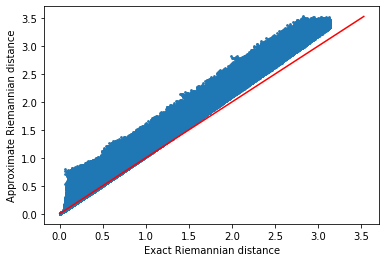

In [16]:
Rdist_test(2, 5000)

Any improvement when n_nbrs increases? Big improvement when we increase to n_nbrs = 10, slighly more of an improvement at n_nbrs = 20. At n_nbrs = 50 it's a bit unclear: almost exactly 50% of points lie in a hemisphere (an improvement), almost exactly 100% of points are estimated as lying within pi, aka the whole sphere (an improvement), but the max distance (distance to antipodal point) is now UNDERESTIMATED at 3.12ish, whereas at n_nbrs = 20 it's almost exactly 3.14 (it should be pi)

In [ ]:
count_nbhds(2, 5000, 10)

In [ ]:
Rdist_test(2, 5000, 10)

In [ ]:
count_nbhds(2, 5000, 20)

In [ ]:
count_nbhds(2, 5000, 50)

In [ ]:
Rdist_test(2, 5000, 50)

Any improvement when N increases? Yes, for high enough n_nbrs. The most significant improvement still comes from increasing n_nbrs, though. At n_nbrs = 5, it looks about as bad as the N = 5000 case. At n_nbrs = 20 and n_nbrs = 50, things are improved and a little better than the N = 5000, n_nbrs = 20 case (at least in terms of percentage of neighbors in a hemisphere and percentage of neighbors estimated to be within pi (aka what should be the whole sphere))

In [ ]:
count_nbhds(2, 10000)

In [ ]:
Rdist_test(2, 10000)

In [ ]:
count_nbhds(2, 10000, 20)

In [ ]:
Rdist_test(2, 10000, 20)

In [ ]:
count_nbhds(2, 10000, 50)

In [ ]:
Rdist_test(2, 10000, 50)

Behavior in higher dimensions? Test 3-sphere

In [ ]:
count_nbhds(3, 5000, n_nbrs = 50)

In [ ]:
Rdist_test(3, 5000, 50)

In [ ]:
count_nbhds(3, 5000, n_nbrs = 100)

In [ ]:
Rdist_test(3, 5000, 100)

In [ ]:
count_nbhds(3, 10000, n_nbrs = 20)

In [ ]:
Rdist_test(3, 10000, 20)

In [ ]:
count_nbhds(3, 10000, n_nbrs = 50)

In [ ]:
Rdist_test(3, 10000, 50)

In [ ]:
count_nbhds(3, 20000, n_nbrs = 50)

Test 5-sphere

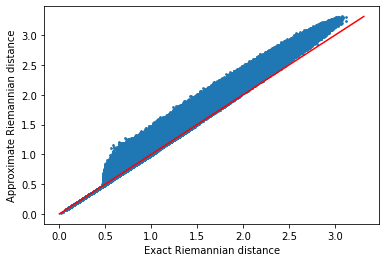

In [4]:
Rdist_test(5, 10000, 50)

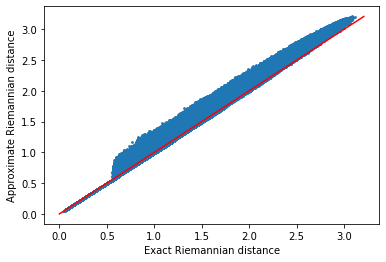

In [4]:
Rdist_test(5, 10000, 100)

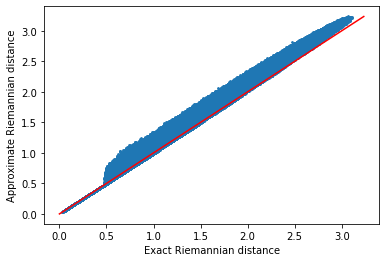

In [5]:
Rdist_test(5, 20000, 100)

First scalar curvature test: uniform sample on 2-sphere. Feed in exact density, dimension, Riemannian distances

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def run_sphere_test(n, N, n_nbrs = 5, r = math.pi/2, noise = 0, exact_Rdist = False, min_r = 0):
    # n: dimension of sphere, N: number of points, n_nbrs: parameter to pass to Isomap for Riemannian distance estimation, r: scale
    X = sphere(N, n, noise)
    if exact_Rdist:
        Rdist = sphere_Rdist_array(n, X)
    else:
        Rdist = None
    Sn = sphere_volume(n)
    sce = scalar_curvature_est(X, n, n_nbrs = n_nbrs, density = [1/Sn for i in range(N)], Rdist = Rdist)
    eps, ball_volumes = sce.ball_volumes(0, r)
    eps, ball_ratios = sce.ball_ratios(0, r)
    
    plt.scatter(eps, ball_volumes, s = 3)
    plt.suptitle("Estimated Riemannian ball volumes")
    if exact_Rdist:
        plt.title(f"N = {N}")
    else:
        plt.title(f"N = {N}, n_nbrs = {n_nbrs}")
    plt.show()

    Vn = (math.pi**(n/2))/gamma(n/2 + 1) # volume of Euclidean unit n-ball
    euc_ball_volumes = [Vn*ep**n for ep in eps]
    plt.scatter(eps, euc_ball_volumes, s = 3)
    plt.title("Euclidean ball volumes")
    plt.show()

    plt.scatter(eps, ball_ratios, s = 3)
    plt.suptitle("Ratios of Riemannian ball volumes to Euclidean ball volumes")
    if exact_Rdist:
        plt.title(f"N = {N}")
    else:
        plt.title(f"N = {N}, n_nbrs = {n_nbrs}")
    p = np.poly1d(np.polyfit(eps, ball_ratios, 2))
    xs = np.linspace(0, r, 100)
    ys = p(xs)
    plt.plot(xs, ys, color = 'r')
    plt.show()
    
    # do a quadratic regression on eps, ball_volumes
    S = sce.at(0, r, min_r = min_r)
    print("Estimated scalar curvature via quadratic regression: ", S)
    
    if exact_Rdist:
        start_idx = [100, 250, 500]
    else:
        start_idx = [500]
    for idx in start_idx:
        eps, pers_S = sce.persistent_curvature(0, r)
        plt.scatter(eps[idx:], pers_S[idx:], s = 3)
        plt.suptitle("Estimated scalar curvature using ratio relation at varying radii")
        if exact_Rdist:
            plt.title(f"N = {N}")
        else:
            plt.title(f"N = {N}, n_nbrs = {n_nbrs}")
        plt.show()
    
    # just set S = 6*(n+2)*(1 - ratio at scale r)
    ratio = ball_ratios[-1]
    ep = eps[-1]
    S = 6*(n+2)*(1 - ratio)/(ep**2)
    print(f"Estimated scalar curvature just using ratio at scale r = {r}: ", S)
    return sce

In [ ]:
run_sphere_test(2, 5000, exact_Rdist = True)

In [ ]:
run_sphere_test(2, 10000, exact_Rdist = True)

Testing quadratic regression when we throw away balls of radius < rmin or radius > rmax. Also tested whether doing a polynomial fit with a higher degree polynomial helped-- that made things much worse in the cases I tested.

In [8]:
import numpy as np
import matplotlib.pyplot as plt

def test_range(sce, rmin, rmax, deg = 2):
    # sce: scalar_curvature_est object that's already been fit to the data points
    # rmin, rmax: min/max radius to use for ball volumes
    # deg: degree of polynomial to fit to the ball ratio plot
    N = sce.N
    curvature_ests = []
    for i in range(N):
        eps, ball_ratios = sce.ball_ratios(i, rmax)
        ball_ratios = ball_ratios[eps > rmin]
        eps = eps[eps > rmin]
        p = np.polyfit(eps, ball_ratios, deg)
            
        if i == 0:
            plt.scatter(eps, ball_ratios, s = 3)
            plt.suptitle("Ratios of Riemannian ball volumes to Euclidean ball volumes (for a single point)")
            plt.title(f"N = {N}")
            q = np.poly1d(p)
            xs = np.linspace(rmin, rmax, 100)
            ys = q(xs)
            plt.plot(xs, ys, color = 'r')
            plt.show()

        # get S from the quadratic regression
        S = -6*(n + 2)*p[deg - 2]
        if i == 0:
            print("Scalar curvature est via quadratic regression (for ratios plotted above): ", S)
        curvature_ests.append(S)
    return curvature_ests

def plot_dist(dist, binwidth = .05):
    min_val = min(dist)
    max_val = max(dist)
    plt.hist(dist, bins = int((max_val - min_val)/binwidth))
    plt.show()

In [ ]:
N = 10000
n = 2
X = sphere(N, n)
Rdist = sphere_Rdist_array(n, X)
Sn = sphere_volume(n)
sce = scalar_curvature_est(X, n, density = [1/Sn for i in range(N)], Rdist = Rdist)

In [ ]:
curvatures = test_range(sce, .3, math.pi/2)
plot_dist(curvatures)

In [ ]:
curvatures = test_range(sce, .3, 1)
plot_dist(curvatures)

In [ ]:
curvatures = test_range(sce, .4, math.pi/2)
plot_dist(curvatures)

In [ ]:
curvatures = test_range(sce, .4, 1)
plot_dist(curvatures)

In [ ]:
curvatures = test_range(sce, .4, math.pi)
plot_dist(curvatures)

In [ ]:
curvatures = test_range(sce, .4, math.pi/2, 4)
plot_dist(curvatures)

In [ ]:
curvatures = test_range(sce, .4, 1, 4)
plot_dist(curvatures)

In [ ]:
curvatures = test_range(sce, .4, math.pi, 4)
plot_dist(curvatures)

In [ ]:
curvatures = test_range(sce, .45, math.pi/2)
plot_dist(curvatures)

In [ ]:
curvatures = test_range(sce, .45, 1)
plot_dist(curvatures)

In [ ]:
curvatures = test_range(sce, .5, math.pi/2)
plot_dist(curvatures)

In [ ]:
curvatures = test_range(sce, .5, 1)
plot_dist(curvatures)

In [ ]:
curvatures = test_range(sce, .5, math.pi)
plot_dist(curvatures)

In [ ]:
curvatures = test_range(sce, .5, math.pi/2, 4)
plot_dist(curvatures)

3-sphere tests below (exact density, dimension, Riemannian distance). Actual volume of hemisphere is below, for comparison

In [ ]:
.5*sphere_volume(3)

In [ ]:
run_sphere_test(3, 10000, exact_Rdist = True)

Second scalar curvature test: This time, use graph approximation for Riemannian distance. 

Generate uniform sample on 2-sphere with N = 5000 points, calculate ball volumes/ratios for balls contained in a hemisphere, set n_nbrs = Isomap default (n_nbrs = 5). These results are bad because Riemannian distance estimation is way too inaccurate (systematic overestimation).

In [ ]:
import matplotlib.pyplot

n = 2
N = 5000
X = sphere(N, n)
Sn = sphere_volume(n)
sce = scalar_curvature_est(X, n, n_nbrs = 5, density = [1/Sn for i in range(N)])

In [ ]:
eps, ball_volumes = sce.ball_volumes(0, math.pi/2)
eps, ball_ratios = sce.ball_ratios(0, math.pi/2)

Plot geodesic ball volume estimations as function of radius.
We're underestimating Riemannian ball volume. At radius pi/2, the ball is a hemisphere and so it should have volume 2*pi (6.28ish). Instead we're calculating that it's closer to 5. From experiments above, looks like the reason is that we're undercounting neighborhoods/overestimating Riemannian distance

In [ ]:
plt.scatter(eps, ball_volumes, s = 3)
plt.show()

Compare to euclidean ball volumes. Sanity check: at radius pi/2, the volume should be pi^3/8 (7.75ish)

In [ ]:
Vn = (math.pi**(n/2))/gamma(n/2 + 1) # volume of Euclidean unit n-ball
euc_ball_volumes = [Vn*ep**n for ep in eps]
plt.scatter(eps, euc_ball_volumes, s = 3)

Plot ratio of geodesic ball volume to euclidean ball volume. The ratio here is garbage because of the underestimation of Riemannian ball volumes. Ratio at pi/2 should be 8/pi^2 (.81ish)

In [ ]:
plt.scatter(eps[3:], ball_ratios[3:], s = 3)
plt.show()

Plot an approximation to the analytic ratio that we should be seeing 
(using relation between ratio and scalar curvature, cutting off O(eps^4) terms)

In [ ]:
S = n*(n-1)
print(S)
analytic_ratio_approx = [1 - S*(ep**2)/(6*(n+2)) for ep in eps]
plt.scatter(eps, analytic_ratio_approx, s = 3)

More tests on 2-spheres: Uniform distribution, but with increased N and increased n_nbrs. These results are much more reasonable. As seen in the earlier neighborhood counting experiments, increasing n_nbrs is especially important for improving Riemannian distance estimation. The quadratic regression thing leads to garbage results (essentially, getting this approach to be accurate would require the data to have the right convexity/concavity, which is too much to ask for). Instead I tried using the relation that: (ratio of Riemannian/euclidean balls of radius r centered at p) \approx 1 - S(p)*r^2/(6*(n+2)) for small r. In the experiments below, we get S(p) = 2.15, 2.05, 1.87, 1.9 (for varying N and n_nbrs)

In [ ]:
run_sphere_test(2, 5000, 20)

In [ ]:
run_sphere_test(2, 5000, 50)

In [ ]:
run_sphere_test(2, 10000, 20)

In [ ]:
run_sphere_test(2, 10000, 50)

Tests on 2-sphere with noise. Uniform distribution + gaussian noise. Results seem pretty reasonable (still pretty close to 2). Tested standard deviations .01, .02, .03, .05, .1, .2. Things start getting dicey at .2. The first test I ran (N =10,000 and n_brs = 20) gave me S = 1.88, which was good. The second test (same params) gave S = 1.16. I'll have to run that over many trials to get a distribution. Still seems like an improvement on the existing paper, where things were only reasonable up through sigma = .03.

In [ ]:
run_sphere_test(2, 10000, 20, r = math.pi/2, noise = .01)

In [ ]:
run_sphere_test(2, 10000, 20, r = math.pi/2, noise = .02)

In [ ]:
run_sphere_test(2, 10000, 20, r = math.pi/2, noise = .03)

In [ ]:
run_sphere_test(2, 10000, 20, r = math.pi/2, noise = .05)

In [ ]:
run_sphere_test(2, 10000, 20, r = math.pi/2, noise = .1)

In [ ]:
run_sphere_test(2, 10000, 20, r = math.pi/2, noise = .2)

In [ ]:
run_sphere_test(2, 10000, 20, r = math.pi/2, noise = .2)

In [ ]:
run_sphere_test(2, 10000, 20, r = math.pi/2, noise = .2)

In [ ]:
run_sphere_test(2, 10000, 50, r = math.pi/2, noise = .2)

Tests on 3-sphere. Uniform distribution

In [ ]:
run_sphere_test(3, 10000, 20, r = math.pi/2)

In [ ]:
run_sphere_test(3, 10000, 50, r = math.pi/2)

In [ ]:
run_sphere_test(3, 20000, 50, r = math.pi/2)

Sample from torus (uniform)

In [16]:
import numpy as np
import math
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt

def torus(N, r, R):
    psis = [np.random.random()*2*math.pi for i in range(N)]
    j = 0
    thetas = []
    while j < N:
        theta = np.random.random()*2*math.pi
        #eta = np.random.random()*2*(r/R) + 1 - (r/R)
        #if eta < 1 + (r/R)*math.cos(theta):
        eta = np.random.random()/math.pi
        if eta < (1 + (r/R)*math.cos(theta))/(2*math.pi):
            thetas.append(theta)
            j += 1
    
    def embed_torus(theta, psi):
        x = (R + r*math.cos(theta))*math.cos(psi)
        y = (R + r*math.cos(theta))*math.sin(psi)
        z = r*math.sin(theta)
        return [x, y, z]
    
    X = np.array([embed_torus(thetas[i], psis[i]) for i in range(N)])
    return X, np.array(thetas)

# set_axes_equal and _set_axes_radius are functions from @Mateen Ulhaq and @karlo to make the aspect ratio equal for 3d plots
def set_axes_equal(ax):
    """Set 3D plot axes to equal scale.

    Make axes of 3D plot have equal scale so that spheres appear as
    spheres and cubes as cubes.  Required since `ax.axis('equal')`
    and `ax.set_aspect('equal')` don't work on 3D.
    """
    limits = np.array([
        ax.get_xlim3d(),
        ax.get_ylim3d(),
        ax.get_zlim3d(),
    ])
    origin = np.mean(limits, axis=1)
    radius = 0.5 * np.max(np.abs(limits[:, 1] - limits[:, 0]))
    _set_axes_radius(ax, origin, radius)

def _set_axes_radius(ax, origin, radius):
    x, y, z = origin
    ax.set_xlim3d([x - radius, x + radius])
    ax.set_ylim3d([y - radius, y + radius])
    ax.set_zlim3d([z - radius, z + radius])
    
def plot_3d(X, vals = None):
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    if vals is None:
        p = ax.scatter(X[:, 0], X[:, 1], X[:, 2], c = X[:, 2]) # color according to z-coordinate
    else:
        p = ax.scatter(X[:, 0], X[:, 1], X[:, 2], c = vals)
    ax.set_box_aspect([1,1,1])
    set_axes_equal(ax)
    fig.colorbar(p)
    plt.show()

def S_exact(theta, r, R):
    S = (2*math.cos(theta))/(r*(R + r*math.cos(theta)))
    return S

def exact_curvatures(thetas, r, R):
    curvatures = [S_exact(theta, r, R) for theta in thetas]
    return curvatures

def theta_index(theta, thetas):
    # Returns index in thetas of the angle closest to theta
    err = [abs(theta_ - theta) for theta_ in thetas]
    return np.argmin(err)

In [ ]:
import matplotlib.pyplot as plt

%matplotlib notebook
r = 1 
R = 2
N = 10000
X, thetas = torus(N, r, R) # r = .5 and R = 2.5 are the parameters used in other curvature paper
plot_3d(X)

In [ ]:
%matplotlib notebook
exact_S = exact_curvatures(thetas, r, R)
plot_3d(X, exact_S)

Explore curvature estimations for varying scale parameter r, at: 

    1) a point near theta = 0 (positive scalar curvature)
    2) a point near theta = pi/2 (zero curvature)
    3) a point near pi (negative curvature)

Step 1: get points near theta = 0, pi/2, and pi

In [ ]:
i = theta_index(0, thetas)
print(thetas[i])
j = theta_index(math.pi/2, thetas)
print(thetas[j] - math.pi/2)
k = theta_index(math.pi, thetas)
print(thetas[k] - math.pi)

Step 2: compute estimated ball volumes/ratios for balls of varying radii around these points

In [ ]:
n_nbrs = 20
Tarea = 4*(math.pi**2)*r*R # surface area of 2-torus
sce = scalar_curvature_est(X, 2, n_nbrs = 20, density = [1/Tarea for i in range(N)])
maxr = math.pi*r

eps_i, ball_volumes_i = sce.ball_volumes(i, maxr)
print("computed ball volumes i")
eps_j, ball_volumes_j = sce.ball_volumes(j, maxr)
print("computed ball volumes j")
eps_k, ball_volumes_k = sce.ball_volumes(k, maxr)
print("computed ball volumes k")

eps_i, ball_ratios_i = sce.ball_ratios(i, maxr)
print("computed ball ratios i")
eps_j, ball_ratios_j = sce.ball_ratios(j, maxr)
print("computed ball ratios j")
eps_k, ball_ratios_k = sce.ball_ratios(k, maxr)
print("computed ball ratios k")

Step 3: Plot ball volumes/ratios and estimate scalar curvature

In [ ]:
%matplotlib inline
plt.scatter(eps_i, ball_volumes_i)
plt.title(f"Estimated ball volumes at positive curvature, N = {N}")
plt.show()

minr_i = .3
big_enough = eps_i > minr_i
plt.scatter(eps_i[big_enough], ball_ratios_i[big_enough])
p = np.polyfit(eps_i[big_enough], ball_ratios_i[big_enough], 2)
q = np.poly1d(p)
xs = np.linspace(minr_i, maxr, 100)
ys = q(xs)
plt.plot(xs, ys, color = 'r')
S_quad = -6*(2 + 2)*p[0]
plt.title(f"Estimated ball ratios at positive curvature, N = {N}")
plt.show()
print("Scalar curvature via quadratic regression: ", S_quad)

S_i = S(thetas[i], r, R)
print("Actual scalar curvature: ", S_i)
big_enough = eps_i > 1
ratio_Ss_i = np.array([6*(2 + 2)*(1 - ball_ratios_i[m])/(ep**2) for m, ep in enumerate(eps_i)])
plt.scatter(eps_i[big_enough], ratio_Ss_i[big_enough])
plt.plot([min(eps_i[big_enough]), max(eps_i[big_enough])], [S_i, S_i], c = 'r') # correct answer
plt.title(f"Curvature est using ratio method, N = {N}")
plt.show()

In [ ]:
%matplotlib inline
plt.scatter(eps_j, ball_volumes_j)
plt.title(f"Estimated ball volumes at zero curvature, N = {N}")
plt.show()

minr_j
big_enough = eps_j > minr_j
plt.scatter(eps_j[big_enough], ball_ratios_j[big_enough])
p = np.polyfit(eps_j[big_enough], ball_ratios_j[big_enough], 2)
q = np.poly1d(p)
xs = np.linspace(minr_j, maxr, 100)
ys = q(xs)
plt.plot(xs, ys, color = 'r')
S_quad = -6*(2 + 2)*p[0]
plt.title(f"Estimated ball ratios at zero curvature, N = {N}")
plt.show()
print("Scalar curvature via quadratic regression: ", S_quad)

S_j = S(thetas[j], r, R)
print("Actual scalar curvature: ", S_j)
ratio_Ss_j = np.array([6*(2 + 2)*(1 - ball_ratios_j[m])/(ep**2) for m, ep in enumerate(eps_j)])
big_enough = eps_j > 1
plt.scatter(eps_j[big_enough], ratio_Ss_j[big_enough])
plt.plot([min(eps_j[big_enough]), max(eps_j[big_enough])], [S_j, S_j], c = 'r') # correct answer
plt.title(f"Curvature est using ratio method, N = {N}")
plt.show()

In [ ]:
%matplotlib inline
plt.scatter(eps_k, ball_volumes_k)
plt.title(f"Estimated ball volumes at negative curvature, N = {N}")
plt.show()

minr_k = 0

big_enough = eps_k > minr_k
plt.scatter(eps_k[big_enough], ball_ratios_k[big_enough])
p = np.polyfit(eps_k[big_enough], ball_ratios_k[big_enough], 2)
q = np.poly1d(p)
xs = np.linspace(minr_k, maxr, 100)
ys = q(xs)
plt.plot(xs, ys, color = 'r')
S_quad = -6*(2 + 2)*p[0]
plt.title(f"Estimated ball ratios at negative curvature, N = {N}")
plt.show()
print("Scalar curvature via quadratic regression: ", S_quad)

S_k = S(thetas[k], r, R)
print("Actual scalar curvature: ", S_k)
ratio_Ss_k = np.array([6*(2 + 2)*(1 - ball_ratios_k[m])/(ep**2) for m, ep in enumerate(eps_k)])
big_enough = eps_k > 1
plt.scatter(eps_k[big_enough], ratio_Ss_k[big_enough])
plt.plot([min(eps_k[big_enough]), max(eps_k[big_enough])], [S_k, S_k], c = 'r') # correct answer
plt.title(f"Curvature est using ratio method, N = {N}")
plt.show()

Test: Double the number of points on torus to N = 20000

In [ ]:
import matplotlib.pyplot as plt

%matplotlib notebook
r = 1 
R = 2
N = 20000
X, thetas = torus(N, r, R) # r = .5 and R = 2.5 are the parameters used in other curvature paper
plot_3d(X)

In [ ]:
i = theta_index(0, thetas)
print(thetas[i])
j = theta_index(math.pi/2, thetas)
print(thetas[j] - math.pi/2)
k = theta_index(math.pi, thetas)
print(thetas[k] - math.pi)

In [ ]:
Tarea = 4*(math.pi**2)*r*R # surface area of 2-torus
sce = scalar_curvature_est(X, 2, n_nbrs = 20, density = [1/Tarea for i in range(N)])
maxr = math.pi*r

eps_i, ball_volumes_i = sce.ball_volumes(i, maxr)
print("computed ball volumes i")
eps_j, ball_volumes_j = sce.ball_volumes(j, maxr)
print("computed ball volumes j")
eps_k, ball_volumes_k = sce.ball_volumes(k, maxr)
print("computed ball volumes k")

eps_i, ball_ratios_i = sce.ball_ratios(i, maxr)
print("computed ball ratios i")
eps_j, ball_ratios_j = sce.ball_ratios(j, maxr)
print("computed ball ratios j")
eps_k, ball_ratios_k = sce.ball_ratios(k, maxr)
print("computed ball ratios k")

In [ ]:
%matplotlib inline
plt.scatter(eps_i, ball_volumes_i)
plt.title(f"Estimated ball volumes at positive curvature, N = {N}")
plt.show()

minr_i = .2
big_enough = eps_i > minr_i
plt.scatter(eps_i[big_enough], ball_ratios_i[big_enough])
p = np.polyfit(eps_i[big_enough], ball_ratios_i[big_enough], 2)
q = np.poly1d(p)
xs = np.linspace(minr_i, maxr, 100)
ys = q(xs)
plt.plot(xs, ys, color = 'r')
S_quad = -6*(2 + 2)*p[0]
plt.title(f"Estimated ball ratios at positive curvature, N = {N}")
plt.show()
print("Scalar curvature via quadratic regression: ", S_quad)

S_i = S(thetas[i], r, R)
print("Actual scalar curvature: ", S_i)
big_enough = eps_i > 1
ratio_Ss_i = np.array([6*(2 + 2)*(1 - ball_ratios_i[m])/(ep**2) for m, ep in enumerate(eps_i)])
plt.scatter(eps_i[big_enough], ratio_Ss_i[big_enough])
plt.plot([min(eps_i[big_enough]), max(eps_i[big_enough])], [S_i, S_i], c = 'r') # correct answer
plt.title(f"Curvature est using ratio method, N = {N}")
plt.show()

In [ ]:
%matplotlib inline
plt.scatter(eps_j, ball_volumes_j)
plt.title(f"Estimated ball volumes at zero curvature, N = {N}")
plt.show()

minr_j = .4
big_enough = eps_j > minr_j
plt.scatter(eps_j[big_enough], ball_ratios_j[big_enough])
p = np.polyfit(eps_j[big_enough], ball_ratios_j[big_enough], 2)
q = np.poly1d(p)
xs = np.linspace(minr_j, maxr, 100)
ys = q(xs)
plt.plot(xs, ys, color = 'r')
S_quad = -6*(2 + 2)*p[0]
plt.title(f"Estimated ball ratios at zero curvature, N = {N}")
plt.show()
print("Scalar curvature via quadratic regression: ", S_quad)

S_j = S(thetas[j], r, R)
print("Actual scalar curvature: ", S_j)
ratio_Ss_j = np.array([6*(2 + 2)*(1 - ball_ratios_j[m])/(ep**2) for m, ep in enumerate(eps_j)])
big_enough = eps_j > 1
plt.scatter(eps_j[big_enough], ratio_Ss_j[big_enough])
plt.plot([min(eps_j[big_enough]), max(eps_j[big_enough])], [S_j, S_j], c = 'r') # correct answer
plt.title(f"Curvature est using ratio method, N = {N}")
plt.show()

In [ ]:
%matplotlib inline
plt.scatter(eps_k, ball_volumes_k)
plt.title(f"Estimated ball volumes at negative curvature, N = {N}")
plt.show()

minr_k = .5

big_enough = eps_k > minr_k
plt.scatter(eps_k[big_enough], ball_ratios_k[big_enough])
p = np.polyfit(eps_k[big_enough], ball_ratios_k[big_enough], 2)
q = np.poly1d(p)
xs = np.linspace(minr_k, maxr, 100)
ys = q(xs)
plt.plot(xs, ys, color = 'r')
S_quad = -6*(2 + 2)*p[0]
plt.title(f"Estimated ball ratios at negative curvature, N = {N}")
plt.show()
print("Scalar curvature via quadratic regression: ", S_quad)

S_k = S(thetas[k], r, R)
print("Actual scalar curvature: ", S_k)
ratio_Ss_k = np.array([6*(2 + 2)*(1 - ball_ratios_k[m])/(ep**2) for m, ep in enumerate(eps_k)])
big_enough = eps_k > 1
plt.scatter(eps_k[big_enough], ratio_Ss_k[big_enough])
plt.plot([min(eps_k[big_enough]), max(eps_k[big_enough])], [S_k, S_k], c = 'r') # correct answer
plt.title(f"Curvature est using ratio method, N = {N}")
plt.show()

Testing sphere with new curvature estimation strategy: fit quadratic poly of form y = 1 - C*ep^2 for some coefficient C, where y is the ratio of ball volumes at radius ep

In [ ]:
N = 10000
n = 2
X= sphere(N, n)
Rdist = sphere_Rdist_array(n, X)
Sn = sphere_volume(n)
sce = scalar_curvature_est(X, n, n_nbrs = n_nbrs, density = [1/Sn for i in range(N)], Rdist = Rdist)

In [ ]:
rmax = math.pi/2
eps, ball_ratios = sce.ball_ratios(0, rmax)

In [ ]:
rmin = .3
big_enough = eps > rmin
big_eps = eps[big_enough]
big_ratios = ball_ratios[big_enough]
plt.scatter(big_eps, big_ratios)

# fit quadratic poly y = 1 + C*ep^2
numerator = sum(np.array([(big_ratios[i] - 1)*ep**2 for i, ep in enumerate(big_eps)]))
denom = sum(np.array([ep**4 for ep in big_eps]))
C = numerator/denom

# plot quadratic poly in red
xs = np.linspace(rmin, rmax, 100)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, c = 'r')

S = -6*(n + 2)*C
print("Scalar curvature estimation: ", S)

Does this work even without throwing out the information from the small balls? It seems to. This is probably because the coefficient C above gives higher weight to larger balls

In [ ]:
rmin = 0
big_enough = eps > rmin
big_eps = eps[big_enough]
big_ratios = ball_ratios[big_enough]
plt.scatter(big_eps, big_ratios)

# fit quadratic poly y = 1 + C*ep^2
numerator = sum(np.array([(big_ratios[i] - 1)*ep**2 for i, ep in enumerate(big_eps)]))
denom = sum(np.array([ep**4 for ep in big_eps]))
C = numerator/denom

# plot quadratic poly in red
xs = np.linspace(rmin, rmax, 100)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, c = 'r')

S = -6*(n + 2)*C
print("Scalar curvature estimation: ", S)

Conversely, can we improve things by increasing rmin? Not really.

In [ ]:
rmin = .5
big_enough = eps > rmin
big_eps = eps[big_enough]
big_ratios = ball_ratios[big_enough]
plt.scatter(big_eps, big_ratios)

# fit quadratic poly y = 1 + C*ep^2
numerator = sum(np.array([(big_ratios[i] - 1)*ep**2 for i, ep in enumerate(big_eps)]))
denom = sum(np.array([ep**4 for ep in big_eps]))
C = numerator/denom

# plot quadratic poly in red
xs = np.linspace(rmin, rmax, 100)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, c = 'r')

S = -6*(n + 2)*C
print("Scalar curvature estimation: ", S)

Can we throw out some of the larger balls? This is the best result so far (1.977), using balls ranging from radius 0 to 1. Could be a lucky result, though.

In [ ]:
rmin = 0
rmax = 1
big_enough = eps > rmin
small_enough = eps < rmax
right_size = [big_enough[i] and small_enough[i] for i, ep in enumerate(eps)]
right_eps = eps[right_size]
right_ratios = ball_ratios[right_size]
plt.scatter(right_eps, right_ratios)

# fit quadratic poly y = 1 + C*ep^2
numerator = sum(np.array([(right_ratios[i] - 1)*ep**2 for i, ep in enumerate(right_eps)]))
denom = sum(np.array([ep**4 for ep in right_eps]))
C = numerator/denom

# plot quadratic poly in red
xs = np.linspace(rmin, rmax, 100)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, c = 'r')

S = -6*(n + 2)*C
print("Scalar curvature estimation: ", S)

In [ ]:
N = 10000
n = 2
X = sphere(N, n)
Rdist = sphere_Rdist_array(n, X)
Sn = sphere_volume(n)
sce = scalar_curvature_est(X, n, density = [1/Sn for i in range(N)], Rdist = Rdist)

In [ ]:
Cs = [sce.fit_quad_coeff(i, 0, 1) for i in range(N)]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
# plot ball ratios for 0th point
eps, ball_ratios = sce.ball_ratios(0, 1)
plt.scatter(eps, ball_ratios)

# plot quadratic poly in red for 0th point
xs = np.linspace(0, 1, 100)
ys = [1 + Cs[0]*x**2 for x in xs]
plt.plot(xs, ys, c = 'r')
plt.show()

print("C = ", Cs[0])
print("S estimate = ", -6*(n+2)*Cs[0])

In [ ]:
plot_dist(Ss)

Testing new strategy on torus

In [ ]:
r = 1 
R = 2
N = 10000
X, thetas = torus(N, r, R)

In [ ]:
i = theta_index(0, thetas) # idx of point near theta = 0 (positive curvature)
j = theta_index(math.pi/2, thetas) # idx of point near theta = pi/2 (zero curvature)
k = theta_index(math.pi, thetas) # idx of point near theta = pi (negative curvature)

In [ ]:
rmax = math.pi*r
n_nbrs = 20
Tarea = 4*(math.pi**2)*r*R # surface area of 2-torus
sce = scalar_curvature_est(X, 2, n_nbrs = 20, density = [1/Tarea for i in range(N)])

eps_i, ball_ratios_i = sce.ball_ratios(i, rmax)
eps_j, ball_ratios_j = sce.ball_ratios(j, rmax)
eps_k, ball_ratios_k = sce.ball_ratios(k, rmax)

In [ ]:
import matplotlib.pyplot as plt

def fit_quad_coeff(eps, ball_ratios, rmin, rmax, n = 2):
    big_enough = eps > rmin
    small_enough = eps < rmax
    right_size = [big_enough[i] and small_enough[i] for i, ep in enumerate(eps)]
    right_eps = eps[right_size]
    right_ratios = ball_ratios[right_size]
    plt.scatter(right_eps, right_ratios)

    # fit quadratic poly y = 1 + C*ep^2
    numerator = sum(np.array([(right_ratios[m] - 1)*ep**2 for m, ep in enumerate(right_eps)]))
    denom = sum(np.array([ep**4 for ep in right_eps]))
    C = numerator/denom

    # plot quadratic poly in red
    xs = np.linspace(rmin, rmax, 100)
    ys = [1 + C*x**2 for x in xs]
    plt.plot(xs, ys, c = 'r')

    S_est = -6*(n + 2)*C
    print("Scalar curvature estimation: ", S_est)
    return C

Testing at three points on the torus using new strategy (one each of positive, zero, and negative curvature)

In [ ]:
fit_quad_coeff(eps_i, ball_ratios_i, 0, rmax)
print("Actual scalar curvature: ", S_exact(thetas[i], r, R))

In [ ]:
fit_quad_coeff(eps_i, ball_ratios_i, .3, rmax)
print("Actual scalar curvature: ", S_exact(thetas[i], r, R))

In [ ]:
fit_quad_coeff(eps_i, ball_ratios_i, .3, 1)
print("Actual scalar curvature: ", S_exact(thetas[i], r, R))

In [ ]:
fit_quad_coeff(eps_i, ball_ratios_i, 0, 1)
print("Actual scalar curvature: ", S_exact(thetas[i], r, R))

In [ ]:
fit_quad_coeff(eps_j, ball_ratios_j, 0, rmax)
print("Actual scalar curvature: ", S_exact(thetas[j], r, R))

In [ ]:
fit_quad_coeff(eps_j, ball_ratios_j, .3, rmax)
print("Actual scalar curvature: ", S_exact(thetas[j], r, R))

In [ ]:
fit_quad_coeff(eps_j, ball_ratios_j, 0, 1)
print("Actual scalar curvature: ", S_exact(thetas[j], r, R))

In [ ]:
fit_quad_coeff(eps_j, ball_ratios_j, 0, 1.5)
print("Actual scalar curvature: ", S_exact(thetas[j], r, R))

In [ ]:
fit_quad_coeff(eps_j, ball_ratios_j, 0, 2)
print("Actual scalar curvature: ", S_exact(thetas[j], r, R))

In [ ]:
fit_quad_coeff(eps_k, ball_ratios_k, 0, rmax)
print("Actual scalar curvature: ", S_exact(thetas[k], r, R))

In [ ]:
fit_quad_coeff(eps_k, ball_ratios_k, .3, math.pi*r)
print("Actual scalar curvature: ", S_exact(thetas[k], r, R))

In [ ]:
fit_quad_coeff(eps_k, ball_ratios_k, 0, 1)
print("Actual scalar curvature: ", S_exact(thetas[k], r, R))

Testing new strategy on the whole torus

In [ ]:
Cs = [sce.fit_quad_coeff(i, 0, math.pi*r) for i in range(N)]
Ss = [-6*(2 + 2)*C for C in Cs]

In [ ]:
plot_3d(X, Ss)

In [ ]:
actual_Ss = [S_exact(theta, r, R) for theta in thetas]

In [ ]:
plot_3d(X, actual_Ss)

In [ ]:
err = [abs(Ss[i] - actual_Ss[i]) for i in range(N)]
plot_3d(X, err)

Testing different rmax's on the torus

In [ ]:
Cs = [sce.fit_quad_coeff(i, 0, math.pi*r/2) for i in range(N)]
Ss = [-6*(2 + 2)*C for C in Cs]

In [ ]:
plot_3d(X, Ss)
err = [abs(Ss[i] - actual_Ss[i]) for i in range(N)]
plot_3d(X, err)

In [ ]:
Cs = [sce.fit_quad_coeff(i, 0, 2) for i in range(N)]
Ss = [-6*(2 + 2)*C for C in Cs]

In [ ]:
plot_3d(X, Ss)
err = [abs(Ss[i] - actual_Ss[i]) for i in range(N)]
plot_3d(X, err)

Testing sphere + noise

In [ ]:
# No noise. Unlike before, here I'm not cheating on Riemannian distance
N = 10000
n = 2
X = sphere(N, n)
Sn = sphere_volume(n)
sce = scalar_curvature_est(X, n, n_nbrs = 20, density = [1/Sn for i in range(N)])

In [ ]:
Cs = [sce.fit_quad_coeff(i, 0, math.pi/2) for i in range(N)]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
%matplotlib inline
print("Mean estimated curvature: ", np.mean(Ss))
plot_dist(Ss)

In [ ]:
# noise = .01 REDONE with multivariate gaussian
X = sphere(N, n, .01)
%matplotlib inline
plot_3d(X)

In [ ]:
sce = scalar_curvature_est(X, n, n_nbrs = 20, density = [1/Sn for i in range(N)])
Cs = [sce.fit_quad_coeff(i, 0, math.pi/2) for i in range(N)]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
print("Mean estimated curvature: ", np.mean(Ss))
plot_dist(Ss)

In [ ]:
# noise = .03 REDONE with actual multivariate Gaussian noise
X = sphere(N, n, .03)
plot_3d(X)

In [ ]:
sce = scalar_curvature_est(X, n, n_nbrs = 20, density = [1/Sn for i in range(N)])
Cs = [sce.fit_quad_coeff(i, 0, math.pi/2) for i in range(N)]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
print("Mean estimated curvature: ", np.mean(Ss))
plot_dist(Ss)

In [ ]:
# noise = .1 REDONE
X = sphere(N, n, .1)
plot_3d(X)
plt.show()

In [ ]:
sce = scalar_curvature_est(X, n, n_nbrs = 20, density = [1/Sn for i in range(N)])
Cs = [sce.fit_quad_coeff(i, 0, math.pi/2) for i in range(N)]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
print("Mean estimated curvature: ", np.mean(Ss))
plot_dist(Ss)

In [ ]:
# noise = .3 REDONE
X = sphere(N, n, .3)
plot_3d(X)

In [ ]:
sce = scalar_curvature_est(X, n, n_nbrs = 20, density = [1/Sn for i in range(N)])
Cs = [sce.fit_quad_coeff(i, 0, math.pi/2) for i in range(N)]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
print("Mean estimated curvature: ", np.mean(Ss))
plot_dist(Ss)

Test on hyperbolic disk(constant negative curvature)

In [302]:
import math
import numpy as np

def hyperbolic_disk(N, K = -1, Rh = 1):
    # N: number of points, K: Gaussian curvature
    # Rh: hyperbolic radius of the disk
    assert K < 0, "K must be negative"
    R = 1/math.sqrt(-K)
    thetas = 2*math.pi*np.random.random(N)
    us = np.random.random(N)
    C1 = 2/math.sqrt(-K)
    C2 = np.sinh(Rh*math.sqrt(-K)/2)
    rs = [C1*np.arcsinh(C2*math.sqrt(u)) for u in us]
    ts = [R*np.tanh(r/(2*R)) for r in rs]
    X = np.array([[ts[i]*math.cos(thetas[i]), ts[i]*math.sin(thetas[i])] for i in range(N)])
    return X

def hyperbolic_disk_polar(N, K = -1):
    # N: number of points
    # Gaussian curvature is K = -1
    thetas = 2*math.pi*np.random.random(N)
    us = np.random.random(N)
    C1 = 2/math.sqrt(-K)
    C2 = np.sinh(math.sqrt(-K)/2)
    rs = [C1*np.arcsinh(C2*math.sqrt(u)) for u in us]
    X = np.array([[rs[i], thetas[i]] for i in range(N)])
    return X

def hyperbolic_cartesian_to_polar(X, K = -1):
    R = 1/math.sqrt(-K)
    N = X.shape[0]
    X = []
    for i in range(N):
        x = X[i, 0]
        y = X[i, 1]
        r = 2*R*np.arctanh(math.sqrt(x**2 + y**2)/R)
        theta = np.arccos(x/(R*np.tanh(r/(2*R))))
        X.append([r, theta])
    return X
    
def hyperbolic_polar_to_cartesian(X, K = -1):
    R = 1/math.sqrt(-K)
    N = X.shape[0]
    rs = X[:, 0]
    thetas = X[:, 1]
    ts = [R*np.tanh(r/(2*R)) for r in rs]
    X = np.array([[ts[i]*math.cos(thetas[i]), ts[i]*math.sin(thetas[i])] for i in range(N)])
    return X

def hyperbolic_Rdist(u, v, K = -1):
    assert K < 0, "K must be negative"
    R = 1/math.sqrt(-K)
    z = u/R
    w = v/R
    #wconj = np.array([w[0], -w[1]]) # conjugate of w, thought of as a complex number
    z_wconj = np.array([z[0]*w[0] + z[1]*w[1], w[0]*z[1] - z[0]*w[1]]) # product of z and w_conj, thought of as complex numbers
    dist = 2*R*np.arctanh(np.linalg.norm(z - w)/np.linalg.norm(np.array([1, 0]) - z_wconj))
    return dist

def hyperbolic_Rdist_polar(u, v):
    # u, v: tuples. polar coordinates (r, theta)
    # Gaussian curvature is K = -1
    r1 = u[0]
    theta1 = u[1]
    r2 = v[0]
    theta2 = v[1]
    return np.arccosh(np.cosh(r1)*np.cosh(r2) - np.sinh(r1)*np.sinh(r2)*np.cos(theta2 - theta1))

def hyperbolic_Rdist_array(X, K = -1, polar = False):
    # K is the Gaussian curvature of the hyperbolic plane that X is sampled from
    if polar: assert K == -1
    N = X.shape[0]
    Rdist = np.zeros((N, N))
    for i in range(N):
        print(i)
        for j in range(i):
            x1 = X[i, :]
            x2 = X[j, :]
            if polar:
                Rdist[i, j] = hyperbolic_Rdist_polar(x1, x2)
            else:
                Rdist[i, j] = hyperbolic_Rdist(x1, x2, K)
            Rdist[j, i] = Rdist[i, j]
    return Rdist

def hyperbolic_disk_area(Rh, K = -1):
    assert K < 0
    return (-4*math.pi/K)*(np.sinh(Rh*math.sqrt(-K)/2)**2)

In [ ]:
# Sanity checking the sampling method
X = hyperbolic_disk(1000, -1)
plt.scatter(X[:, 0], X[:, 1], s = 3)
plt.axis('equal')
plt.show()

X = hyperbolic_disk(1000, -10)
plt.scatter(X[:, 0], X[:, 1], s = 3)
plt.axis('equal')
plt.show()

X = hyperbolic_disk(1000, -100)
plt.scatter(X[:, 0], X[:, 1], s = 3)
plt.axis('equal')
plt.show()

In [ ]:
N = 10000
n = 2
K = -1
X = hyperbolic_disk(N)
plt.scatter(X[:, 0], X[:, 1], s = 3)
plt.axis('equal')
plt.show()

In [ ]:
Rdist = hyperbolic_Rdist_array(X, K)

In [ ]:
Harea = hyperbolic_disk_area(K)
sce = scalar_curvature_est(X, n, density = [1/Harea for i in range(N)], Rdist = Rdist)

Estimate curvature at the point closest to the origin in the hyperbolic disk model, for varying rmax

In [ ]:
i = np.argmin([np.linalg.norm(x) for x in X])

In [ ]:
rmax = 1
eps, ball_ratios = sce.ball_ratios(i, rmax)
fit_quad_coeff(eps, ball_ratios, rmin = 0, rmax = rmax)

In [ ]:
rmax = .8
eps, ball_ratios = sce.ball_ratios(i, rmax)
fit_quad_coeff(eps, ball_ratios, rmin = 0, rmax = rmax)

Estimate scalar curvature for all points in a ball of radius (1 - rmax) of the origin, for varying rmax

In [ ]:
org = np.array([0,0])
rs = [hyperbolic_Rdist(org, x, K) for x in X]

In [ ]:
rmax = .9
small_r_indices = [i for i in range(N) if rs[i] < (1 - rmax)]
X_smallr = np.array([X[i, :] for i in small_r_indices])
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_r_indices]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
plt.scatter(X_smallr[:, 0], X_smallr[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

plot_dist(Ss, binwidth = .05)
plt.show()

In [ ]:
rmax = .8
small_r_indices = [i for i in range(N) if rs[i] < (1 - rmax)]
X_smallr = np.array([X[i, :] for i in small_r_indices])
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_r_indices]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
plt.scatter(X_smallr[:, 0], X_smallr[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

plot_dist(Ss, binwidth = .05)
plt.show()

In [ ]:
rmax = .7
small_r_indices = [i for i in range(N) if rs[i] < (1 - rmax)]
X_smallr = np.array([X[i, :] for i in small_r_indices])
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_r_indices]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
plt.scatter(X_smallr[:, 0], X_smallr[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

plot_dist(Ss, binwidth = .05)
plt.show()

In [ ]:
rmax = .6
small_r_indices = [i for i in range(N) if rs[i] < (1 - rmax)]
X_smallr = np.array([X[i, :] for i in small_r_indices])
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_r_indices]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
plt.scatter(X_smallr[:, 0], X_smallr[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

plot_dist(Ss, binwidth = .05)
plt.show()

In [ ]:
rmax = .5
small_r_indices = [i for i in range(N) if rs[i] < (1 - rmax)]
X_smallr = np.array([X[i, :] for i in small_r_indices])
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_r_indices]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
plt.scatter(X_smallr[:, 0], X_smallr[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

plot_dist(Ss, binwidth = .05)
plt.show()

Testing N = 20000 points on hyperbolic disk

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
N = 20000
K = -1
X = hyperbolic_disk(N)
plt.scatter(X[:, 0], X[:, 1], s = 3)
plt.axis('equal')
plt.show()

In [ ]:
Rdist = hyperbolic_Rdist_array(X, K)
np.save('hyperbolic_disk_20000.npy', Rdist)

Estimate scalar curvature at the point closest to the origin, for varying rmax

In [ ]:
Rdist = np.load('hyperbolic_disk_20000.npy')
Harea = hyperbolic_disk_area(K)
sce = scalar_curvature_est(X, n, density = [1/Harea for i in range(N)], Rdist = Rdist)
i = np.argmin([np.linalg.norm(x) for x in X])
rmax = 1
eps, ball_ratios = sce.ball_ratios(i, rmax)
fit_quad_coeff(eps, ball_ratios, rmin = 0, rmax = rmax)

In [ ]:
rmax = .5
eps, ball_ratios = sce.ball_ratios(i, rmax)
fit_quad_coeff(eps, ball_ratios, rmin = 0, rmax = rmax)

Estimate scalar curvature for all points in a ball of radius (1 - rmax) of the origin, for varying rmax

In [ ]:
org = np.array([0,0])
rs = [hyperbolic_Rdist(org, x, K) for x in X]

In [ ]:
rmax = .9
small_r_indices = [i for i in range(N) if rs[i] < (1 - rmax)]
X_smallr = np.array([X[i, :] for i in small_r_indices])
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_r_indices]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
print("Mean curvature estimate: ", np.mean(Ss))
plt.scatter(X_smallr[:, 0], X_smallr[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

plot_dist(Ss, binwidth = .05)
plt.show()

In [ ]:
rmax = .8
small_r_indices = [i for i in range(N) if rs[i] < (1 - rmax)]
X_smallr = np.array([X[i, :] for i in small_r_indices])
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_r_indices]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
print("Mean curvature estimate: ", np.mean(Ss))
plt.scatter(X_smallr[:, 0], X_smallr[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

plot_dist(Ss, binwidth = .05)
plt.show()

In [ ]:
rmax = .7
small_r_indices = [i for i in range(N) if rs[i] < (1 - rmax)]
X_smallr = np.array([X[i, :] for i in small_r_indices])
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_r_indices]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
print("Mean curvature estimate: ", np.mean(Ss))
plt.scatter(X_smallr[:, 0], X_smallr[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

plot_dist(Ss, binwidth = .05)
plt.show()

In [ ]:
rmax = .6
small_r_indices = [i for i in range(N) if rs[i] < (1 - rmax)]
X_smallr = np.array([X[i, :] for i in small_r_indices])
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_r_indices]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
print("Mean curvature estimate: ", np.mean(Ss))
plt.scatter(X_smallr[:, 0], X_smallr[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

plot_dist(Ss, binwidth = .05)
plt.show()

In [ ]:
rmax = .5
small_r_indices = [i for i in range(N) if rs[i] < (1 - rmax)]
X_smallr = np.array([X[i, :] for i in small_r_indices])
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_r_indices]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
print("Mean curvature estimate: ", np.mean(Ss))
plt.scatter(X_smallr[:, 0], X_smallr[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

plot_dist(Ss, binwidth = .05)
plt.show()

One-sheet hyperboloid testing. Note that in other paper, they sampled u in [-2, 2] and then only computed scalar curvature for u in [-1, 1]. They sampled enough points so that there were 10^4 points with u in [-1, 1] to avoid boundary efffects. So really, they had a lot more than 10,000 points for this example.

In [ ]:
def det_g(a, c, u):
    return (a**4)*(u**2) + a**2*(u**2 + 1)*c**2

def hyperboloid(N, a, c, B, within_halfB = False):
    # if within_halfB = False, then sample N points from the hyperboloid with u in [-B, B]
    # if within_halfB = True, then sample points uniformly from u in [-B, B] until there are at least N points with u in [-.5B, .5B]
    sqrt_max_det_g = math.sqrt(det_g(a, c, B))
    us = []
    thetas = []
    i = 0
    while i < N:
        theta = 2*math.pi*np.random.random()
        u = 2*B*np.random.random() - B
        eta = sqrt_max_det_g*np.random.random()
        sqrt_det_g = math.sqrt(det_g(a, c, u))
        
        if eta < sqrt_det_g:
            us.append(u)
            thetas.append(theta)
            if (within_halfB and -.5*B <= u <= .5*B) or (not within_halfB):
                i +=1
    xs = [a*math.cos(thetas[i])*math.sqrt(us[i]**2 + 1) for i in range(N)]
    ys = [a*math.sin(thetas[i])*math.sqrt(us[i]**2 + 1) for i in range(N)]
    zs = [c*us[i] for i in range(N)]
    X = np.array([[xs[i], ys[i], zs[i]] for i in range(N)])
    return X

def Harea(a, c, B):
    alpha = math.sqrt(c**2 + a**2)/(c**2)
    cBalpha = c*B*alpha
    return 2*math.pi*a*(math.sqrt(cBalpha**2 + 1)*cBalpha + np.arcsinh(cBalpha))/alpha

def hyperboloid_S(z):
    # actual scalar curvature at z when a = b = 2 and c = 1
    return -2/((5*z**2 + 1)**2)

In [ ]:
i = 0
within_halfB = True
B = 2
u = 1.5
if (within_halfB and -.5*B <= u <= .5*B) or (not within_halfB):
    i +=1
print(i)

In [ ]:
%matplotlib notebook
N = 10000
a = 2
c = 1
B = 2
X = hyperboloid(N, a, c, B) # same params as other paper
plot_3d(X)

In [ ]:
np.save('X_hyperboloid_10000.npy', X)

In [ ]:
%matplotlib notebook
X = np.load('X_hyperboloid_10000.npy')
plot_3d(X)

In [ ]:
Rdist = sce.get_Rdist()
np.save('hyperboloid_Rdist_10000.npy', Rdist)

In [ ]:
N = 10000
a = 2
c = 1
B = 2
n = 2
X = np.load('X_hyperboloid_10000.npy')
small_u_indices = [i for i in range(N) if abs(X[i, 2])/c <= 1] # indices where u <= 1
X_smallu = np.array([X[i, :] for i in small_u_indices])

In [ ]:
Rdist = np.load('Rdist_hyperboloid_10000.npy')

In [ ]:
A = Harea(a, c, B)
sce = scalar_curvature_est(X, 2, density = [1/A for i in range(N)], Rdist = Rdist)

In [ ]:
j = small_u_indices[0]
eps, ball_volumes = sce.ball_volumes(j, 1)
plt.scatter(eps, ball_volumes)
plt.show()

eps, ball_volumes = sce.ball_volumes(j, 2)
plt.scatter(eps, ball_volumes)
plt.show()

eps, ball_volumes = sce.ball_volumes(j, 3)
plt.scatter(eps, ball_volumes)
plt.show()

In [ ]:
rmax = 1
j = small_u_indices[0]
eps, ball_ratios = sce.ball_ratios(j, rmax)
print("Actual S: ", hyperboloid_S(X[j, 2]))
fit_quad_coeff(eps, ball_ratios, 0, rmax)
plt.show()

In [ ]:
rmax = 1.5
j = small_u_indices[0]
eps, ball_ratios = sce.ball_ratios(j, rmax)
print("Actual S: ", hyperboloid_S(X[j, 2]))
fit_quad_coeff(eps, ball_ratios, 0, rmax)
plt.show()

In [ ]:
rmax = 2
j = small_u_indices[0]
eps, ball_ratios = sce.ball_ratios(j, rmax)
print("Actual S: ", hyperboloid_S(X[j, 2]))
fit_quad_coeff(eps, ball_ratios, 0, rmax)
plt.show()

In [ ]:
n = 2
rmax = 1
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_u_indices]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
np.save('hyperboloid_10000_Sest_rmax1.npy', np.array(Ss))

In [ ]:
import numpy as np
Ss = np.load('hyperboloid_10000_Sest.rmax1.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

In [ ]:
rmax = 1.5
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_u_indices]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
np.save('hyperboloid_10000_Sest_rmax1.5.npy', np.array(Ss))

In [ ]:
Ss = np.load('hyperboloid_10000_Sest.rmax1.5.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

In [ ]:
rmax = 2
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_u_indices]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
np.save('hyperboloid_10000_Sest_rmax2.npy', np.array(Ss))

In [ ]:
Ss = np.load('hyperboloid_10000_Sest.rmax2.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

In [ ]:
rmax = 3
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_u_indices]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
np.save('hyperboloid_10000_Sest_rmax3.npy', np.array(Ss))

In [ ]:
Ss = np.load('hyperboloid_10000_Sest_rmax3.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

Test N = 20000 points

In [ ]:
N = 20000
a = 2
c = 1
B = 2
X = hyperboloid(N, a, c, B) # same params as other paper
np.save('X_hyperboloid_20000.npy', X)

In [ ]:
N = 20000
c = 1
X = np.load('X_hyperboloid_20000.npy')
small_u_indices = [i for i in range(N) if abs(X[i, 2])/c <= 1] # indices where u <= 1
X_smallu = np.array([X[i, :] for i in small_u_indices])

In [ ]:
plot_3d(X_smallu)

In [ ]:
a = 2
B = 2
c = 1
A = Harea(a, c, B)
sce = scalar_curvature_est(X, 2, n_nbrs = 20, density = [1/A for i in range(N)])

In [ ]:
Rdist = sce.get_Rdist()
np.save('Rdist_hyperboloid_20000.npy', Rdist)

In [ ]:
rmax = 1
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_u_indices]
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_hyperboloid_20000_rmax1.npy', np.array(Ss))

In [ ]:
Ss = np.load('Sest_hyperboloid_20000_rmax1.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

In [ ]:
rmax = 1.5
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_u_indices]
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_hyperboloid_20000_rmax1.5.npy', np.array(Ss))

In [ ]:
Ss = np.load('Sest_hyperboloid_20000_rmax1.5.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

In [ ]:
rmax = 2
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_u_indices]
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_hyperboloid_20000_rmax2.npy', np.array(Ss))

In [ ]:
%matplotlib notebook
Ss = np.load('Sest_hyperboloid_20000_rmax2.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

Testing 10,000 points with u in [-1, 1]. Requires many more than 20,000 points because the [-1, 1] region has less than half the total surface area

In [ ]:
X = np.load('X_hyperboloid_10000_within_halfheight_1.npy')
N = X.shape[0]
Rdist = np.load('Rdist_hyperboloid_10000_within_halfheight1.npy')
a = 2
B = 2
c = 1
A = Harea(a, c, B)
sce = scalar_curvature_est(X, 2, density = [1/A for i in range(N)], Rdist = Rdist)

In [ ]:
X = np.load('X_hyperboloid_10000_within_halfheight1.npy')
N = X.shape[0]
a = 2
B = 2
c = 1
n = 2
small_u_indices = [i for i in range(N) if abs(X[i, 2])/c <= 1] # indices where u <= 1
X_smallu = np.array([X[i, :] for i in small_u_indices])

In [ ]:
rmax = 1
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_u_indices]
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_hyperboloid_10000_within_halfheight1_rmax1.npy', np.array(Ss))

In [ ]:
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax1.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

In [ ]:
X = np.load('X_hyperboloid_10000_within_halfheight1.npy')
N = X.shape[0]
small_u_indices = [i for i in range(N) if abs(X[i, 2]) < 1]
X_smallu = np.array([X[i, :] for i in small_u_indices])
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax1.npy')
plt.scatter(X_smallu[:, 2], Ss, s = 3)

zs = np.linspace(-1, 1, 100)
ys = [hyperboloid_S(z) for z in zs]
plt.plot(zs, ys, color = 'r')

In [ ]:
rmax = 1.5
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_u_indices]
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_hyperboloid_10000_within_halfheight1_rmax1.5.npy', np.array(Ss))

In [ ]:
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax1.5.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

In [ ]:
X = np.load('X_hyperboloid_10000_within_halfheight1.npy')
N = X.shape[0]
small_u_indices = [i for i in range(N) if abs(X[i, 2]) < 1]
X_smallu = np.array([X[i, :] for i in small_u_indices])
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax1.5.npy')
plt.scatter(X_smallu[:, 2], Ss, s = 3)

zs = np.linspace(-1, 1, 100)
ys = [hyperboloid_S(z) for z in zs]
plt.plot(zs, ys, color = 'r')

In [ ]:
rmax = 2
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_u_indices]
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_hyperboloid_10000_within_halfheight1_rmax2.npy', np.array(Ss))

In [ ]:
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax2.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

In [ ]:
X = np.load('X_hyperboloid_10000_within_halfheight1.npy')
N = X.shape[0]
small_u_indices = [i for i in range(N) if abs(X[i, 2]) < 1]
X_smallu = np.array([X[i, :] for i in small_u_indices])
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax2.npy')
plt.scatter(X_smallu[:, 2], Ss, s = 3)

zs = np.linspace(-1, 1, 100)
ys = [hyperboloid_S(z) for z in zs]
plt.plot(zs, ys, color = 'r')

Testing density estimation (sphere)

In [ ]:
N = 10000
X_sphere = sphere(N, 2)
np.save('X_sphere_10000.npy', X_sphere)
print("Sampled sphere")
kde = KDE(2, X_sphere)
density = kde.density()
print("Actual density = ", 1/sphere_volume(2))
print("Mean estimated density = ", np.mean(density))
np.save('density_sphere_10000.npy', np.array(density))

In [ ]:
plot_dist(density, binwidth = .005)

In [ ]:
X = np.load('X_sphere_10000.npy')
density = np.load('density_sphere_10000.npy')
plot_3d(X, density)
err = abs(density - 1/sphere_volume(2))
plot_3d(X, err)

Checking density calculation for one-sheet hyperboloid

In [ ]:
A = Harea(a, c, B)
print("Calculated density = ", 1/A)

In [ ]:
X_h = np.load('X_hyperboloid_10000.npy')
kde = KDE(2, X_h)
a = 2
c = 1
B = 2
density = kde.density()
np.save('density_hyperboloid_10000.npy', np.array(density))

In [ ]:
density = np.load('density_hyperboloid_10000.npy')
print("Mean estimated density = ", np.mean(density))
print("Median estimated density = ", np.median(density))
plot_dist(density, binwidth = .0005)

In [ ]:
density = np.load('density_hyperboloid_10000.npy')
X = np.load('X_hyperboloid_10000.npy')
plot_3d(X, density)
err = abs(density - 1/Harea(2, 1, 2))
plot_3d(X, err)

In [ ]:
X_h = np.load('X_hyperboloid_20000.npy')
kde = KDE(2, X_h)
density = kde.density()
np.save('density_hyperboloid_20000.npy', np.array(density))

In [ ]:
density = np.load('density_hyperboloid_20000.npy')
print("Mean estimated density = ", np.mean(density))
print("Median estimated density = ", np.median(density))
plot_dist(density, binwidth = .0005)

In [ ]:
density = np.load('density_hyperboloid_20000.npy')
X = np.load('X_hyperboloid_20000.npy')
plot_3d(X, density)
err = abs(density - 1/Harea(2, 1, 2))
plot_3d(X, err)

In [ ]:
X_h = np.load('X_hyperboloid_10000_within_halfheight_1.npy')
kde = KDE(2, X_h)
density = kde.density()
np.save('density_hyperboloid_10000_within_halfheight_1.npy', np.array(density))

In [ ]:
print("Mean estimated density = ", np.mean(density))
print("Median estimated density = ", np.median(density))
plot_dist(density, binwidth = .0005)

In [ ]:
%matplotlib notebook
density = np.load('density_hyperboloid_10000_within_halfheight1.npy')
X = np.load('X_hyperboloid_10000_within_halfheight1.npy')
plot_3d(X, density)
err = abs(density - 1/Harea(2, 1, 2))
plot_3d(X, err)

Testing results when using empirical density instead of analytic density

Subtest #1: Sphere, no averaging within balls.

In [ ]:
X = np.load('X_sphere_10000.npy')
density = np.load('density_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist)

In [ ]:
n = 2
rmax = math.pi/2
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in range(10000)]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
np.save('Sest_sphere_10000_rmax_piover2_empiricaldensity.npy', np.array(Ss))

In [ ]:
Ss = np.load('Sest_sphere_10000_rmax_piover2_empiricaldensity.npy')
plot_dist(Ss)

Subtest #2: Sphere, averaging within balls

In [ ]:
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)
rmax = math.pi/2
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in range(10000)]
Ss = [-6*(n + 2)*C for C in Cs]
np.save(f'Sest_sphere_10000_rmax_piover2_empiricaldensity_avg.npy', np.array(Ss))

In [ ]:
Ss = np.load('Sest_sphere_10000_rmax_piover2_empiricaldensity_avg.npy')
plot_dist(Ss, binwidth = .01)

Subtest #3: Hyperboloid, no averaging within balls.

In [ ]:
X = np.load('X_hyperboloid_10000_within_halfheight_1.npy')
N = X.shape[0]
Rdist = np.load('Rdist_hyperboloid_10000_within_halfheight1.npy')
density = np.load('density_hyperboloid_10000_within_halfheight_1.npy')
a = 2
B = 2
c = 1
n = 2
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist)

In [ ]:
small_u_indices = [i for i in range(N) if abs(X[i, 2])/c <= 1] # indices where u <= 1
X_smallu = np.array([X[i, :] for i in small_u_indices])

In [ ]:
rmaxes = [1, 1.5, 2]
for rmax in rmaxes:
    Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_u_indices]
    Ss = [-6*(n + 2)*C for C in Cs]
    np.save(f'Sest_hyperboloid_10000_within_halfheight1_rmax{rmax}_empiricaldensity.npy', np.array(Ss))

In [ ]:
X = np.load('X_hyperboloid_10000_within_halfheight1.npy')
N = X.shape[0]
c = 1
small_u_indices = [i for i in range(N) if abs(X[i, 2])/c <= 1] # indices where u <= 1
X_smallu = np.array([X[i, :] for i in small_u_indices])

In [ ]:
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax1_empiricaldensity.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

In [ ]:
X = np.load('X_hyperboloid_10000_within_halfheight1.npy')
N = X.shape[0]
small_u_indices = [i for i in range(N) if abs(X[i, 2]) < 1]
X_smallu = np.array([X[i, :] for i in small_u_indices])
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax1.5_empiricaldensity.npy')
plt.scatter(X_smallu[:, 2], Ss, s = 3)

zs = np.linspace(-1, 1, 100)
ys = [hyperboloid_S(z) for z in zs]
plt.plot(zs, ys, color = 'r')

In [ ]:
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax1.5_empiricaldensity.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

In [ ]:
X = np.load('X_hyperboloid_10000_within_halfheight1.npy')
N = X.shape[0]
small_u_indices = [i for i in range(N) if abs(X[i, 2]) < 1]
X_smallu = np.array([X[i, :] for i in small_u_indices])
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax1.5_empiricaldensity.npy')
plt.scatter(X_smallu[:, 2], Ss, s = 3)

zs = np.linspace(-1, 1, 100)
ys = [hyperboloid_S(z) for z in zs]
plt.plot(zs, ys, color = 'r')

In [ ]:
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax2_empiricaldensity.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

In [ ]:
X = np.load('X_hyperboloid_10000_within_halfheight1.npy')
N = X.shape[0]
small_u_indices = [i for i in range(N) if abs(X[i, 2]) < 1]
X_smallu = np.array([X[i, :] for i in small_u_indices])
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax2_empiricaldensity.npy')
plt.scatter(X_smallu[:, 2], Ss, s = 3)

zs = np.linspace(-1, 1, 100)
ys = [hyperboloid_S(z) for z in zs]
plt.plot(zs, ys, color = 'r')

Subtest #4: Hyperboloid, average density within ball

In [ ]:
X = np.load('X_hyperboloid_10000_within_halfheight_1.npy')
N = X.shape[0]
small_u_indices = [i for i in range(N) if abs(X[i, 2]) < 1]
X_smallu = np.array([X[i, :] for i in small_u_indices])

In [ ]:
Rdist = np.load('Rdist_hyperboloid_10000_within_halfheight1.npy')
density = np.load('density_hyperboloid_10000_within_halfheight_1.npy')
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

rmax = 2
rs, ball_ratios = sce.ball_ratios(0, rmax)
i = np.argmin([abs(X[i, 2]) for i in small_u_indices])
C = sce.fit_quad_coeff(i, 0, rmax)
xs = np.linspace(0, rmax, 100)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.scatter(rs, ball_ratios)
plt.show()

In [ ]:
rmaxes = [1, 1.5, 2]
for rmax in rmaxes:
    Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_u_indices]
    Ss = [-6*(n + 2)*C for C in Cs]
    np.save(f'Sest_hyperboloid_10000_within_halfheight1_rmax{rmax}_empiricaldensity_avg.npy', np.array(Ss))

In [ ]:
%matplotlib notebook
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax1_empiricaldensity_avg.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

In [ ]:
%matplotlib inline
X = np.load('X_hyperboloid_10000_within_halfheight1.npy')
N = X.shape[0]
small_u_indices = [i for i in range(N) if abs(X[i, 2]) < 1]
X_smallu = np.array([X[i, :] for i in small_u_indices])
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax1_empiricaldensity_avg.npy')
plt.scatter(X_smallu[:, 2], Ss, s = 3)

zs = np.linspace(-1, 1, 100)
ys = [hyperboloid_S(z) for z in zs]
plt.plot(zs, ys, color = 'r')

In [ ]:
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax1.5_empiricaldensity_avg.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

In [ ]:
%matplotlib inline
X = np.load('X_hyperboloid_10000_within_halfheight1.npy')
N = X.shape[0]
small_u_indices = [i for i in range(N) if abs(X[i, 2]) < 1]
X_smallu = np.array([X[i, :] for i in small_u_indices])
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax1.5_empiricaldensity_avg.npy')
plt.scatter(X_smallu[:, 2], Ss, s = 3)

zs = np.linspace(-1, 1, 100)
ys = [hyperboloid_S(z) for z in zs]
plt.plot(zs, ys, color = 'r')

In [ ]:
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax2_empiricaldensity_avg.npy')
actual_Ss = [hyperboloid_S(X[i, 2]) for i in small_u_indices]
errs = [abs(S - actual_Ss[i]) for i, S in enumerate(Ss)]
plot_3d(X_smallu, actual_Ss)
plt.show()
plot_3d(X_smallu, Ss)
plt.show()
plot_3d(X_smallu, errs)

In [ ]:
%matplotlib inline
X = np.load('X_hyperboloid_10000_within_halfheight1.npy')
N = X.shape[0]
small_u_indices = [i for i in range(N) if abs(X[i, 2]) < 1]
X_smallu = np.array([X[i, :] for i in small_u_indices])
Ss = np.load('Sest_hyperboloid_10000_within_halfheight1_rmax2_empiricaldensity_avg.npy')
plt.scatter(X_smallu[:, 2], Ss, s = 3)

zs = np.linspace(-1, 1, 100)
ys = [hyperboloid_S(z) for z in zs]
plt.plot(zs, ys, color = 'r')

Subtest #5: Torus, average density within ball

In [ ]:
N = 10000
r = 1
R = 2
X, thetas = torus(N, r, R)
np.save("X_torus_10000.npy", X)
np.save("torus_thetas_10000.npy", thetas)

In [ ]:
kde = KDE(2, X)
density = kde.density()
np.save('density_torus_10000.npy', np.array(density))

In [ ]:
sce = scalar_curvature_est(X, 2, density = density, use_avg_density = True)
Rdist = sce.get_Rdist()
np.save('Rdist_torus_10000.npy', Rdist)

In [ ]:
X = np.load("X_torus_10000.npy")
density = np.load('density_torus_10000.npy')
Rdist = np.load('Rdist_torus_10000.npy')
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
n = 2
N = 10000
rmax = math.pi
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in range(N)]
Ss = [-6*(n + 2)*C for C in Cs]
np.save("Sest_torus_1000_rmax_pi_empiricaldensity_avg.npy", Ss)

In [ ]:
%matplotlib inline

Ss = np.load("Sest_torus_10000_rmax_pi_empiricaldensity_avg.npy")
X = np.load("X_torus_10000.npy")
thetas = np.load("torus_thetas_10000.npy")
actual_Ss = exact_curvatures(thetas, 1, 2)
errs = [abs(actual_Ss[i] - Ss[i]) for i in range(10000)]

plot_3d(X, actual_Ss)
plt.show()

plot_3d(X, Ss)
plt.show()

plot_3d(X, errs)
plt.show()

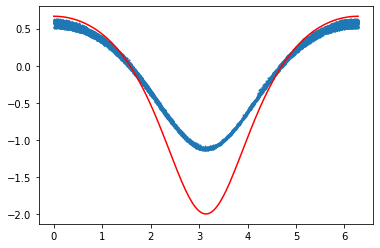

-1.140991094778087


In [22]:
Ss = np.load("Sest_torus_10000_rmax_pi_empiricaldensity_avg.npy")
X = np.load("X_torus_10000.npy")
thetas = np.load("torus_thetas_10000.npy")
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

print(min(Ss))

How does the error in regression fit change as rmax changes? Test on S^2. Something that's surprising is that the fit error continues to decrease even after the error in C starts increasing.

In [ ]:
X = np.load('X_sphere_10000.npy')
density = np.load('density_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
rs, Cs, errs = sce.quad_coeff_errs(0, math.pi)

plt.title("Fit error")
plt.scatter(rs, errs, s = 1)
plt.show()

plt.title("Fit error")
plt.scatter(rs[200:], errs[200:], s = 1)
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs, Cs, s = 3)
n = 2
correct_C = -2/(6*(n + 2))
plt.plot([rs[0], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs[200:], Cs[200:], s = 3)
n = 2
correct_C = -2/(6*(n + 2))
plt.plot([rs[200], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

Test fit error on T^2. Choose 3 points (one each of positive, zero, and negative curvature). Here, the fit error more or less decreases until 4.5, then starts increasing again. Still, this doesn't line up with the minimization in C error.

In [ ]:
X = np.load('X_torus_10000.npy')
density = np.load('density_torus_10000.npy')
Rdist = np.load('Rdist_torus_10000.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
thetas = np.load("torus_thetas_10000.npy")
i = theta_index(0, thetas) # positive curvature
j = theta_index(math.pi/2, thetas) # zero curvature
k = theta_index(math.pi, thetas) # negative curvature

In [ ]:
rs, Cs, errs = sce.quad_coeff_errs(i, 2*math.pi)

plt.title("Fit error")
plt.scatter(rs, errs, s = 1)
plt.show()

plt.title("Fit error")
plt.scatter(rs[200:], errs[200:], s = 1)
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs, Cs, s = 3)
n = 2
correct_S = S_exact(thetas[i], 1, 2)
correct_C = -correct_S/(6*(n + 2))
plt.plot([rs[0], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs[100:], Cs[100:], s = 3)
n = 2
correct_C = -2/(6*(n + 2))
plt.plot([rs[100], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

In [ ]:
rs, Cs, errs = sce.quad_coeff_errs(j, 2*math.pi)

plt.title("Fit error")
plt.scatter(rs, errs, s = 1)
plt.show()

plt.title("Fit error")
plt.scatter(rs[200:], errs[200:], s = 1)
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs, Cs, s = 3)
n = 2
correct_S = S_exact(thetas[j], 1, 2)
correct_C = -correct_S/(6*(n + 2))
plt.plot([rs[0], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs[100:], Cs[100:], s = 3)
n = 2
correct_C = -2/(6*(n + 2))
plt.plot([rs[100], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

In [ ]:
rs, Cs, errs = sce.quad_coeff_errs(k, 2*math.pi)

plt.title("Fit error")
plt.scatter(rs, errs, s = 1)
plt.show()

plt.title("Fit error")
plt.scatter(rs[200:], errs[200:], s = 1)
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs, Cs, s = 3)
n = 2
correct_S = S_exact(thetas[k], 1, 2)
correct_C = -correct_S/(6*(n + 2))
plt.plot([rs[0], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs[100:], Cs[100:], s = 3)
n = 2
correct_C = -2/(6*(n + 2))
plt.plot([rs[100], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

Test fit error on hyperboloid. Testing at a point near z = 0 and a point near z = 1. Like the sphere, the fit error just monotonically decreases. Notably, the minimum fit error for z = 0 is .5, but for z = 1 it's much larger at around 5. The .5 error is good (less than the minimum fit errors for the torus/sphere, which are around 1).

In [ ]:
X = np.load('X_hyperboloid_10000_within_halfheight_1.npy')
density = np.load('density_hyperboloid_10000_within_halfheight_1.npy')
Rdist = np.load('Rdist_hyperboloid_10000_within_halfheight1.npy')
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
N = X.shape[0]
i = np.argmin([abs(X[i, 2]) for i in range(N)])
j = np.argmin([abs(X[i, 2] - 1) for i in range(N)])

In [ ]:
rs, Cs, errs = sce.quad_coeff_errs(i, 3)

plt.title("Fit error")
plt.scatter(rs, errs, s = 1)
plt.show()

plt.title("Fit error")
plt.scatter(rs[200:], errs[200:], s = 1)
plt.show()

plt.title("Estimated coefficient C")
z = X[i, 2]
correct_S = hyperboloid_S(z)
plt.scatter(rs, Cs, s = 3)
n = 2
correct_C = -correct_S/(6*(n + 2))
plt.plot([rs[0], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs[100:], Cs[100:], s = 3)
plt.plot([rs[100], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

In [ ]:
rs, Cs, errs = sce.quad_coeff_errs(j, 3)

plt.title("Fit error")
plt.scatter(rs, errs, s = 1)
plt.show()

plt.title("Fit error")
plt.scatter(rs[200:], errs[200:], s = 1)
plt.show()

plt.title("Estimated coefficient C")
z = X[j, 2]
correct_S = hyperboloid_S(z)
plt.scatter(rs, Cs, s = 3)
n = 2
correct_C = -correct_S/(6*(n + 2))
plt.plot([rs[0], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs[100:], Cs[100:], s = 3)
plt.plot([rs[100], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

Testing a refinement of C. Instead of doing minimizing l2 norm of the error, approximate L2 norm of the error of the actual curve. For all of them, the C refinement doesn't seem to have much of an effect. Things still look more or less the same.

First test: S^2. The distribution doesn't look very different from the other version of C. Previously, the range was from about 2.1 to 2.25. Now it's 2.15 to 2.3, so everything has just been shifted up.

In [ ]:
X = np.load('X_sphere_10000.npy')
density = np.load('density_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
n = 2
rmax = math.pi/2
Cs = [sce.fit_quad_coeff(i, 0, rmax, l2norm = False) for i in range(10000)]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
np.save('Sest_sphere_10000_rmax_piover2_empiricaldensity_avg_Crefinement.npy', Ss)
plot_dist(Ss, binwidth = .01)

Test C refinement on T^2, for varying rmax

In [ ]:
X = np.load('X_torus_10000.npy')
thetas = np.load("torus_thetas_10000.npy")
density = np.load('density_torus_10000.npy')
Rdist = np.load('Rdist_torus_10000.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
n = 2
rmax = math.pi
Cs = [sce.fit_quad_coeff(i, 0, rmax, l2norm = False) for i in range(10000)]
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_torus_10000_rmax_pi_empiricaldensity_avg_Crefinement.npy', Ss)

In [ ]:
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

In [ ]:
n = 2
rmax = 1
Cs = [sce.fit_quad_coeff(i, 0, rmax, l2norm = False) for i in range(10000)]
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_torus_10000_rmax_1_empiricaldensity_avg_Crefinement.npy', Ss)

In [ ]:
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

In [ ]:
n = 2
rmax = 2
Cs = [sce.fit_quad_coeff(i, 0, rmax, l2norm = False) for i in range(10000)]
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_torus_10000_rmax_2_empiricaldensity_avg_Crefinement.npy', Ss)

In [ ]:
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

Test C refinement on hyperboloid

In [ ]:
X = np.load('X_hyperboloid_10000_within_halfheight_1.npy')
density = np.load('density_hyperboloid_10000_within_halfheight_1.npy')
Rdist = np.load('Rdist_hyperboloid_10000_within_halfheight1.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
N = X.shape[0]
small_u_indices = [i for i in range(N) if abs(X[i, 2]) < 1]
X_small = np.array([X[i, :] for i in small_u_indices])

In [ ]:
n = 2
rmax = 2
Cs = [sce.fit_quad_coeff(i, 0, rmax, l2norm = False) for i in small_u_indices]
Ss = [-6*(n + 2)*C for C in Cs]
np.save(f'Sest_hyperboloid_10000_within_halfheight1_rmax_{rmax}_empiricaldensity_avg_Crefinement.npy', Ss)

In [ ]:
plt.scatter(X_small[:, 2], Ss, s = 1)
zs = np.linspace(-1, 1, 200)
ys = [hyperboloid_S(z) for z in zs]
plt.plot(zs, ys, color = 'r')
plt.show()

In [ ]:
n = 2
rmax = 1.5
Cs = [sce.fit_quad_coeff(i, 0, rmax, l2norm = False) for i in small_u_indices]
Ss = [-6*(n + 2)*C for C in Cs]
np.save(f'Sest_hyperboloid_10000_within_halfheight1_rmax_{rmax}_empiricaldensity_avg_Crefinement.npy', Ss)

In [ ]:
plt.scatter(X_small[:, 2], Ss, s = 1)
zs = np.linspace(-1, 1, 200)
ys = [hyperboloid_S(z) for z in zs]
plt.plot(zs, ys, color = 'r')
plt.show()

In [ ]:
n = 2
rmax = 1
Cs = [sce.fit_quad_coeff(i, 0, rmax, l2norm = False) for i in small_u_indices]
Ss = [-6*(n + 2)*C for C in Cs]
np.save(f'Sest_hyperboloid_10000_within_halfheight1_rmax_{rmax}_empiricaldensity_avg_Crefinement.npy', Ss)

In [ ]:
plt.scatter(X_small[:, 2], Ss, s = 1)
zs = np.linspace(-1, 1, 200)
ys = [hyperboloid_S(z) for z in zs]
plt.plot(zs, ys, color = 'r')
plt.show()

For the refined C, how does the error in regression fit change as rmax changes? Tests on sphere, torus, hyperboloid. In general, fit error may keep decreasing monotonically even as error in C increases.

In [ ]:
X = np.load('X_sphere_10000.npy')
density = np.load('density_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
rs, Cs, errs = sce.quad_coeff_errs(0, math.pi, l2norm = False)

plt.title("Fit error")
plt.scatter(rs[:-1], errs, s = 1)
plt.show()

plt.title("Fit error")
plt.scatter(rs[200:-1], errs[200:], s = 1)
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs[:-1], Cs, s = 3)
n = 2
correct_C = -2/(6*(n + 2))
plt.plot([rs[0], rs[-2]], [correct_C, correct_C], color = 'r')
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs[200:-1], Cs[200:], s = 3)
n = 2
correct_C = -2/(6*(n + 2))
plt.plot([rs[200], rs[-2]], [correct_C, correct_C], color = 'r')
plt.show()

In [ ]:
X = np.load('X_torus_10000.npy')
density = np.load('density_torus_10000.npy')
Rdist = np.load('Rdist_torus_10000.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
thetas = np.load("torus_thetas_10000.npy")
i = theta_index(0, thetas) # positive curvature
j = theta_index(math.pi/2, thetas) # zero curvature
k = theta_index(math.pi, thetas) # negative curvature

In [ ]:
import matplotlib.pyplot as plt

rs, Cs, errs = sce.quad_coeff_errs(i, 2*math.pi, l2norm = False)

plt.title("Fit error")
plt.scatter(rs[:-1], errs, s = 1)
plt.show()

plt.title("Fit error")
plt.scatter(rs[200:-1], errs[200:], s = 1)
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs[:-1], Cs, s = 3)
n = 2
correct_S = S_exact(thetas[i], 1, 2)
correct_C = -correct_S/(6*(n + 2))
plt.plot([rs[0], rs[-2]], [correct_C, correct_C], color = 'r')
plt.show()

In [ ]:
rs, Cs, errs = sce.quad_coeff_errs(j, 2*math.pi, l2norm = False)

plt.title("Fit error")
plt.scatter(rs[:-1], errs, s = 1)
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs[:-1], Cs, s = 3)
n = 2
correct_S = S_exact(thetas[j], 1, 2)
correct_C = -correct_S/(6*(n + 2))
plt.plot([rs[0], rs[-2]], [correct_C, correct_C], color = 'r')
plt.show()

In [ ]:
rs, Cs, errs = sce.quad_coeff_errs(k, 2*math.pi, l2norm = False)

plt.title("Fit error")
plt.scatter(rs[:-1], errs, s = 1)
plt.show()

plt.title("Fit error")
plt.scatter(rs[200:-1], errs[200:], s = 1)
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs[:-1], Cs, s = 3)
n = 2
correct_S = S_exact(thetas[k], 1, 2)
correct_C = -correct_S/(6*(n + 2))
plt.plot([rs[0], rs[-2]], [correct_C, correct_C], color = 'r')
plt.show()

In [ ]:
X = np.load('X_hyperboloid_10000_within_halfheight_1.npy')
density = np.load('density_hyperboloid_10000_within_halfheight_1.npy')
Rdist = np.load('Rdist_hyperboloid_10000_within_halfheight1.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
N = X.shape[0]
i = np.argmin([abs(X[i, 2]) for i in range(N)]) # point near z = 0
j = np.argmin([abs(X[i, 2] - 1) for i in range(N)]) # point near z = 1

In [ ]:
rs, Cs, errs = sce.quad_coeff_errs(i, 3, l2norm = False)

plt.title("Fit error")
plt.scatter(rs[:-1], errs, s = 1)
plt.show()

plt.title("Fit error")
plt.scatter(rs[200:-1], errs[200:], s = 1)
plt.show()

plt.title("Estimated coefficient C")
z = X[i, 2]
correct_S = hyperboloid_S(z)
n = 2
correct_C = -correct_S/(6*(n + 2))
plt.scatter(rs[:-1], Cs, s = 3)
plt.plot([rs[0], rs[-2]], [correct_C, correct_C], color = 'r')
plt.show()

In [ ]:
rs, Cs, errs = sce.quad_coeff_errs(j, 3, l2norm = False)

plt.title("Fit error")
plt.scatter(rs[:-1], errs, s = 1)
plt.show()

plt.title("Fit error")
plt.scatter(rs[200:-1], errs[200:], s = 1)
plt.show()

plt.title("Estimated coefficient C")
z = X[j, 2]
correct_S = hyperboloid_S(z)
n = 2
correct_C = -correct_S/(6*(n + 2))
plt.scatter(rs[:-1], Cs, s = 3)
plt.plot([rs[0], rs[-2]], [correct_C, correct_C], color = 'r')
plt.show()

plt.title("Estimated coefficient C")
plt.scatter(rs[100:-1], Cs[100:], s = 3)
plt.plot([rs[100], rs[-2]], [correct_C, correct_C], color = 'r')
plt.show()

Test alternate ball volume. On sphere, you can see that the ball volume gets wildly underestimated. Should be around .8ish at pi/2. This means that scalar curvature gets significantly overestimated. Results on torus are similarly bad. Didn't bother with hyperboloid.

In [ ]:
# Sphere test
X = np.load('X_sphere_10000.npy')
density = np.load('density_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_alt_ball_vol = True)

In [ ]:
rmax = math.pi/2
rs, ball_ratios = sce.ball_ratios(0, rmax)
plt.scatter(rs, ball_ratios, s = 3)

rmax = math.pi/2
rs, ball_ratios = sce.ball_ratios(1, rmax)
plt.scatter(rs, ball_ratios, s = 3)

rmax = math.pi/2
rs, ball_ratios = sce.ball_ratios(2, rmax)
plt.scatter(rs, ball_ratios, s = 3)

In [ ]:
n = 2
rmax = math.pi/2
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in range(10000)]
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_sphere_10000_rmax_piover2_empiricaldensity_avg_altballvol.npy', Ss)

In [ ]:
plot_dist(Ss)
plt.show()

In [ ]:
# Torus test
X = np.load('X_torus_10000.npy')
density = np.load('density_torus_10000.npy')
Rdist = np.load('Rdist_torus_10000.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_alt_ball_vol = True)
thetas = np.load("torus_thetas_10000.npy")

In [ ]:
n = 2
rmax = math.pi
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in range(10000)]
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_torus_10000_rmax_pi_empiricaldensity_avg_altballvol.npy', Ss)

In [ ]:
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

In [ ]:
n = 2
rmax = 1
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in range(10000)]
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_torus_10000_rmax_1_empiricaldensity_avg_altballvol.npy', Ss)

In [ ]:
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

In [ ]:
n = 2
rmax = 2
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in range(10000)]
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_torus_10000_rmax_2_empiricaldensity_avg_altballvol.npy', Ss)

In [ ]:
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

Modified alternate ball volume so that the little radiuses go to 0 a little slower as N --> infty (based roughly on coverage threshold rate). This is even less accurate. Not clear what the best way to choose little radius size is.

In [ ]:
# Sphere test
X = np.load('X_sphere_10000.npy')
density = np.load('density_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_alt_ball_vol = True)

In [ ]:
rs, ball_ratios = sce.ball_ratios(0, math.pi/2)
plt.scatter(rs, ball_ratios)

In [ ]:
n = 2
rmax = math.pi/2
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in range(10000)]
Ss = [-6*(n + 2)*C for C in Cs]

In [ ]:
plot_dist(Ss)

Test: Average ball ratios on sphere

In [ ]:
# Load sphere
X = np.load('X_sphere_10000.npy')
density = np.load('density_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
# Test: pass sequence of rs to ball_ratios

rs, ball_ratios = sce.ball_ratios(0, math.pi/2)

# compare these two plots- they look similar, as they should
rs, ball_ratios = sce.ball_ratios(1, rs = rs)
plt.scatter(rs, ball_ratios, s = 3) # blue

rs, ball_ratios = sce.ball_ratios(1, math.pi/2)
plt.scatter(rs, ball_ratios, s = 3) # orange

In [ ]:
# Average over ALL points
rs, ball_ratios = sce.ball_ratios(0, math.pi/2)
ball_ratio_sums = ball_ratios
N = 10000
for i in range(1, N):
    _, ball_ratios = sce.ball_ratios(i, rs = rs)
    for j in range(len(rs)):
        ball_ratio_sums[j] = ball_ratio_sums[j] + ball_ratios[j]
ball_ratio_avgs = [ball_ratio_sums[j]/N for j in range(len(rs))]

In [ ]:
# Comparison of average ball ratios to ball ratios at 0th point. Average ball ratios are in orange
rs, ball_ratios = sce.ball_ratios(0, math.pi/2)
plt.scatter(rs, ball_ratios, s = 3)
plt.scatter(rs, ball_ratio_avgs, s = 3)
plt.show()

plt.scatter(rs[20:], ball_ratios[20:], s = 3)
plt.scatter(rs[20:], ball_ratio_avgs[20:], s = 3)
plt.show()

# comparison of average to another point. Average ball ratios are in orange
other_rs, ball_ratios = sce.ball_ratios(1, math.pi/2)
plt.scatter(other_rs, ball_ratios, s = 3)
plt.scatter(rs, ball_ratio_avgs, s = 3)
plt.show()

plt.scatter(other_rs[20:], ball_ratios[20:], s = 3)
plt.scatter(rs[20:], ball_ratio_avgs[20:], s = 3)

In [ ]:
rs, ball_ratios = sce.ball_ratios(0, math.pi/2)
ball_ratio_seqs = [ball_ratios]
for i in range(1, 10000):
    print(i)
    _, ball_ratios = sce.ball_ratios(i, rs = rs)
    ball_ratio_seqs.append(ball_ratios)

In [ ]:
'''
Average over a sample of varying size. 
For a given [sample_sz], run [num_trials] trials. 
    For a single trial:
        Sample [sample_sz] points. 
        Average their ball_ratio sequences to get an average ball ratio sequence.
    We now have [num_trials] average ball ratio sequences.
    For each r, calculate sample variance over the [num_trials] data points.
    Store sample variance for each r.
For each [sample_sz], we now have a sequence of sample variances, of length = len(rs)
'''
sample_sizes = [1, 5, 10, 50, 100]
sample_var_seqs = []
num_trials = 100 # number of trials to run for each sample size
for sample_sz in sample_sizes:
    sample_var_seq = []
    for j in range(len(rs)):
        print("Sample size: ", sample_sz, ", r index: ", j)
        avg_ball_ratios = []
        for k in range(num_trials):
            sample = [np.random.randint(0, 10000) for i in range(sample_sz)]
            avg_ball_ratio = np.mean([ball_ratio_seqs[sample[i]][j] for i in range(sample_sz)])
            avg_ball_ratios.append(avg_ball_ratio)
        sample_var = np.var(avg_ball_ratios)
        sample_var_seq.append(sample_var)
    sample_var_seqs.append(sample_var_seq)

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
for i, samp_sz in enumerate(sample_sizes):
    plt.scatter(rs, sample_var_seqs[i], s = 3, label = str(samp_sz))
plt.legend()
plt.show()

for i, samp_sz in enumerate(sample_sizes):
    plt.scatter(rs[20:], sample_var_seqs[i][20:], s = 3, label = str(samp_sz))
plt.legend()
plt.show()

In [ ]:
for i, samp_sz in enumerate(sample_sizes):
    plt.scatter(rs[100:], sample_var_seqs[i][100:], s = 3, label = str(samp_sz))
plt.ylim(0, .003)
plt.legend()
plt.show()

In [ ]:
for i, samp_sz in enumerate(sample_sizes):
    plt.scatter(rs[500:], sample_var_seqs[i][500:], s = 3, label = str(samp_sz))
plt.ylim(0, .0006)
plt.legend()
plt.show()

In [ ]:
for i, samp_sz in enumerate(sample_sizes):
    plt.scatter(rs[1000:], sample_var_seqs[i][1000:], s = 3, label = str(samp_sz))
plt.ylim(0, .0004)
plt.legend()
plt.show()

Test averaging code

In [ ]:
# small example
X = sphere(10, 2)
sce = scalar_curvature_est(X, 2, n_nbrs = 2)
Ss = sce.estimate_all(math.pi/2, 2)
print(Ss)

In [ ]:
# Sphere example
X = np.load('X_sphere_10000.npy')
density = np.load('density_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
# this took a LONG time to run and I'm not sure why
Ss = sce.estimate_all(math.pi/2, 5)

In [ ]:
plot_dist(Ss)

In [ ]:
# redid code so that I'm not storing all the ball ratios at every point (at cost of recomputing the ball ratios 5x at every point)
# testing on small example
X = sphere(10, 2)
sce = scalar_curvature_est(X, 2, n_nbrs = 2)
Ss = sce.estimate_all(math.pi/2, 2)
print(Ss)

In [ ]:
# Sphere example
X = np.load('X_sphere_10000.npy')
density = np.load('density_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
Ss = sce.estimate_all(math.pi/2, 5)
plot_dist(Ss)

In [ ]:
# Torus
X = np.load('X_torus_10000.npy')
thetas = np.load('torus_thetas_10000.npy')
density = np.load('density_torus_10000.npy')
Rdist = np.load('Rdist_torus_10000.npy')
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist, use_avg_density = True)

In [ ]:
Ss = sce.estimate_all(1, 5)

In [ ]:
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

In [ ]:
Ss = sce.estimate_all(1, 10)

In [ ]:
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

In [ ]:
Ss = sce.estimate_all(2, 5)

In [ ]:
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

In [ ]:
Ss = sce.estimate_all(math.pi, 5)

In [ ]:
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

In [ ]:
Ss = sce.estimate_all(math.pi, 10)

In [ ]:
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

Does sampling more points from torus help us get accurate curvature at the min curvature?

In [ ]:
N = 20000
X, thetas = torus(N, 1, 2)
np.save('X_torus_20000.npy', X)
np.save('X_torus_thetas.npy', thetas)

In [ ]:
n = 2
sce = scalar_curvature_est(X, n)
Rdist = sce.get_Rdist()
np.save('Rdist_torus_20000.npy', Rdist)
density = sce.get_density()
np.save('density_torus_20000.npy', density)

In [ ]:
rmax = math.pi
Cs = []
for i in range(20000):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_torus_20000_rmax_pi_empiricaldensity_avg.npy', Ss)

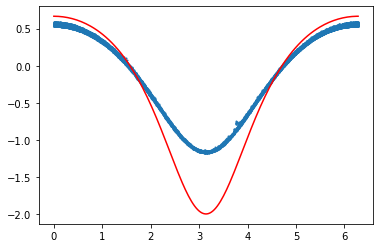

In [18]:
import matplotlib.pyplot as plt
thetas = np.load('X_torus_thetas.npy')
Ss = np.load('Sest_torus_20000_rmax_pi_empiricaldensity_avg.npy')
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

In [19]:
print(min(Ss))

-1.1796680929763737


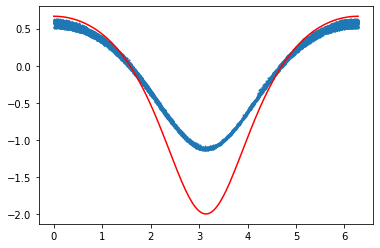

-1.140991094778087


In [23]:
# Comparison to rmax = pi with N = 10,0000
Ss = np.load("Sest_torus_10000_rmax_pi_empiricaldensity_avg.npy")
X = np.load("X_torus_10000.npy")
thetas = np.load("torus_thetas_10000.npy")
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

print(min(Ss))

In [ ]:
rmax = 2
Cs = []
for i in range(20000):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_torus_20000_rmax_2_empiricaldensity_avg.npy', Ss)

In [20]:
Ss = np.load('Sest_torus_20000_rmax_2_empiricaldensity_avg.npy')
print(min(Ss))

-1.3730594979248134


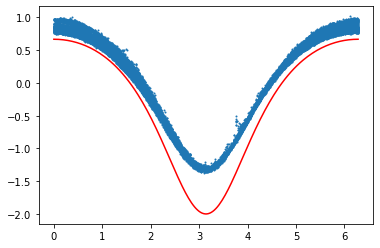

In [21]:
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

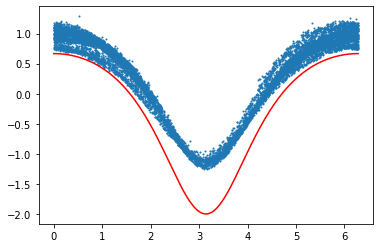

-1.259497431439539


In [25]:
# Comparison to rmax = 2 with N = 10,000 (slightly different, C refinement)
Ss = np.load("Sest_torus_10000_rmax_2_empiricaldensity_avg_Crefinement.npy")
X = np.load("X_torus_10000.npy")
thetas = np.load("torus_thetas_10000.npy")
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

print(min(Ss))

In [ ]:
rmax = 1.5
Cs = []
for i in range(20000):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_torus_20000_rmax_1.5_empiricaldensity_avg.npy', Ss)

In [22]:
Ss = np.load('Sest_torus_20000_rmax_1.5_empiricaldensity_avg.npy')
print(min(Ss))

-1.3053905332712996


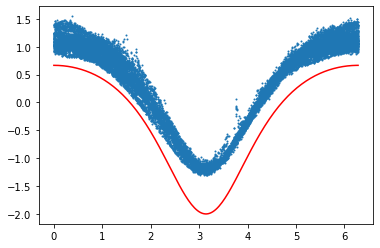

In [23]:
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

In [ ]:
rmax = 1
Cs = []
for i in range(20000):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_torus_20000_rmax_1_empiricaldensity_avg.npy', Ss)

In [24]:
Ss = np.load('Sest_torus_20000_rmax_1_empiricaldensity_avg.npy')
print(min(Ss))

-0.9855638797852079


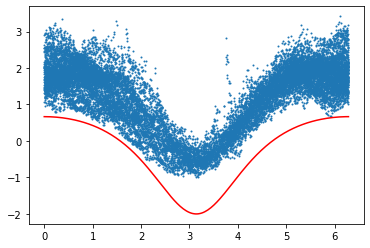

In [25]:
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

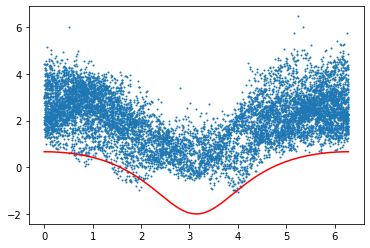

-1.0471828106034324


In [26]:
# Comparison to rmax = 1 with N = 10,000 (slightly different, C refinement)
Ss = np.load("Sest_torus_10000_rmax_1_empiricaldensity_avg_Crefinement.npy")
X = np.load("X_torus_10000.npy")
thetas = np.load("torus_thetas_10000.npy")
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

print(min(Ss))

Testing higher dimension (S^3)

In [ ]:
N = 10000
n = 3
X = sphere(N, 3)
np.save('X_S3_10000.npy', X)

In [ ]:
sce = scalar_curvature_est(X, 3)
Rdist = sce.get_Rdist()
np.save('Rdist_S3_10000.npy', Rdist)
density = sce.get_density()
np.save('density_S3_10000.npy', density)

In [ ]:
rmax = math.pi/2
Cs = []
for i in range(N):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_S3_10000_rmax_piover2_empiricaldensity_avg.npy', Ss)

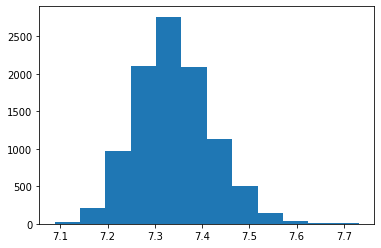

In [26]:
# N = 10,0000. n_nbrs = 20
Ss = np.load('Sest_S3_10000_rmax_piover2_empiricaldensity_avg.npy')
plot_dist(Ss)

In [4]:
# increase n_nbrs to 50 (Rdist is more accurate)
X = np.load('X_S3_10000.npy')
density = np.load('density_S3_10000.npy')
sce = scalar_curvature_est(X, 3, density = density, n_nbrs = 50)
Rdist = sce.get_Rdist()
np.save('Rdist_S3_10000_nnbrs_50.npy', Rdist)

In [6]:
rmax = math.pi/2
n = 3
N = 10000
Cs = []
for i in range(N):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_S3_10000_rmax_piover2_empiricaldensity_avg_nnbrs_50.npy', Ss)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


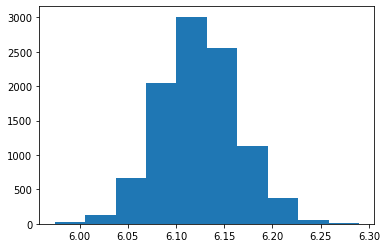

In [18]:
Ss = np.load('Sest_S3_10000_rmax_piover2_empiricaldensity_avg_nnbrs_50.npy')
plt.hist(Ss, bins = 10)
plt.show()

In [ ]:
# increase number of points to 20000 (already ran)
N = 20000
n = 3
X = sphere(N, 3)
np.save('X_S3_20000.npy', X)

In [ ]:
# already ran- used default n_nbrs = 20
sce = scalar_curvature_est(X, 3)
Rdist = sce.get_Rdist()
np.save('Rdist_S3_20000.npy', Rdist)
density = sce.get_density()
np.save('density_S3_20000.npy', density)

In [13]:
N = 20000
n = 3
X = np.load('X_S3_20000.npy')
Rdist = np.load('Rdist_S3_20000.npy')
density = np.load('density_S3_20000.npy')
sce = scalar_curvature_est(X, 3, density = density, Rdist = Rdist)
rmax = math.pi/2
Cs = []
for i in range(N):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_S3_20000_rmax_piover2_empiricaldensity_avg.npy', Ss)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15300
15400
15500
15600
15700
15800
15900
16000
16100
16200
16300
16400
16500
16600
16700
16800
16900
17000
17100
17200
17300
17400
17500
17600
17700
17800
17900
18000
18100
18200
18300
18400
18

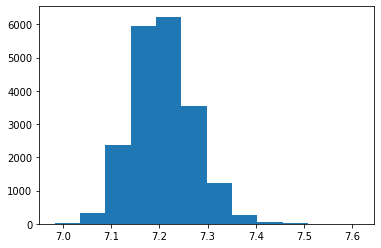

In [14]:
# N = 20,000, still only n_nbrs = 20 so not very accurate
plot_dist(Ss)

In [10]:
# N = 20,000. increase number of neighbors to 50
X = np.load('X_S3_20000.npy')
density = np.load('density_S3_20000.npy')
sce = scalar_curvature_est(X, 3, density = density, n_nbrs = 50)
Rdist = sce.get_Rdist()
np.save('Rdist_S3_20000_nnbrs_50.npy', Rdist)

In [11]:
rmax = math.pi/2
n = 3
N = 20000
Cs = []
for i in range(N):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_S3_20000_rmax_piover2_empiricaldensity_avg_nnbrs_50.npy', Ss)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15300
15400
15500
15600
15700
15800
15900
16000
16100
16200
16300
16400
16500
16600
16700
16800
16900
17000
17100
17200
17300
17400
17500
17600
17700
17800
17900
18000
18100
18200
18300
18400
18

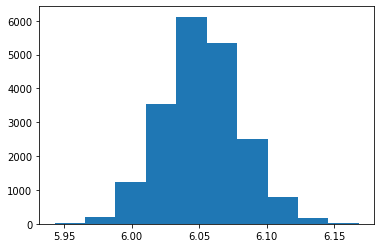

In [17]:
# N = 20,000 and n_nbrs = 50
Ss = np.load('Sest_S3_20000_rmax_piover2_empiricaldensity_avg_nnbrs_50.npy')
plt.hist(Ss, bins = 10)
plt.show()

In [4]:
# N = 20,000. feed in exact Rdist and density
X = np.load('X_S3_20000.npy')
N = 20000
n = 3
Rdist = sphere_Rdist_array(n, X)
np.save('Rdist_S3_exact.npy', Rdist)
print("saved exact Rdist matrix")
Sn = sphere_volume(n)
sce = scalar_curvature_est(X, n, density = [1/Sn for i in range(N)], Rdist = Rdist)

saved exact Rdist matrix


0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15300
15400
15500
15600
15700
15800
15900
16000
16100
16200
16300
16400
16500
16600
16700
16800
16900
17000
17100
17200
17300
17400
17500
17600
17700
17800
17900
18000
18100
18200
18300
18400
18

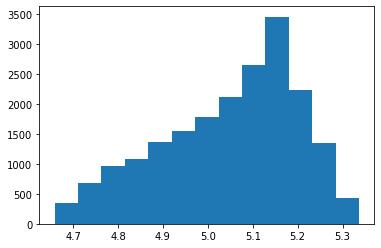

In [5]:
rmax = math.pi/2
Cs = []
for i in range(N):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_S3_20000_rmax_piover2_exact.npy', Ss)
plot_dist(Ss)

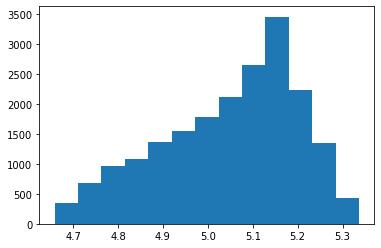

In [6]:
# N = 20,000. exact Rdist/density
plot_dist(Ss)

Estimated curvature:  4.768345004807334


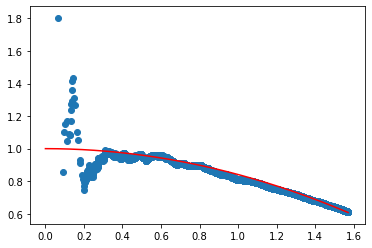

In [7]:
# ball ratio curve at a single point, for N = 20000 and exact Rdist/density
rmax = math.pi/2
rs, ball_ratios = sce.ball_ratios(0, rmax) # ball ratios at a single point
plt.scatter(rs, ball_ratios)
C = sce.fit_quad_coeff(i, 0, rmax)
print("Estimated curvature: ", -6*5*C)
xs = np.linspace(0, rmax, 200)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

Estimated curvature:  4.609180249561937


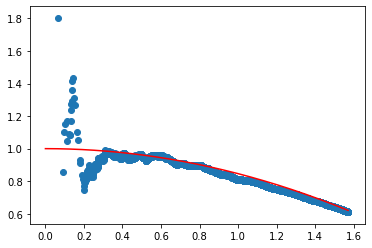

In [9]:
rmax = math.pi/2
rs, ball_ratios = sce.ball_ratios(0, rmax) # ball ratios at a single point
plt.scatter(rs, ball_ratios)
C = sce.fit_quad_coeff(i, 0, rmax, l2norm = False)
print("Estimated curvature: ", -6*5*C)
xs = np.linspace(0, rmax, 200)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

Estimated curvature:  3.711181142620508


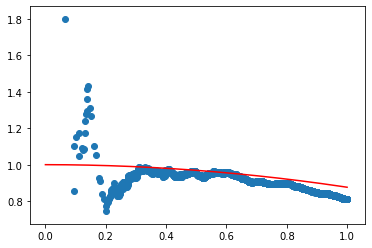

In [8]:
rmax = 1
rs, ball_ratios = sce.ball_ratios(0, rmax) # ball ratios at a single point
plt.scatter(rs, ball_ratios)
C = sce.fit_quad_coeff(i, 0, rmax)
print("Estimated curvature: ", -6*5*C)
xs = np.linspace(0, rmax, 200)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

Estimated curvature:  2.5421128920106866


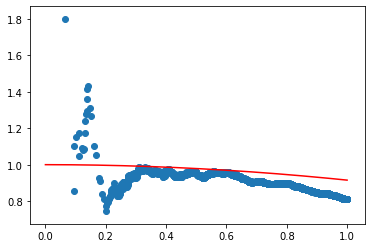

In [10]:
rmax = 1
rs, ball_ratios = sce.ball_ratios(0, rmax) # ball ratios at a single point
plt.scatter(rs, ball_ratios)
C = sce.fit_quad_coeff(i, 0, rmax, l2norm = False)
print("Estimated curvature: ", -6*5*C)
xs = np.linspace(0, rmax, 200)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

Estimated curvature:  4.601879432458158


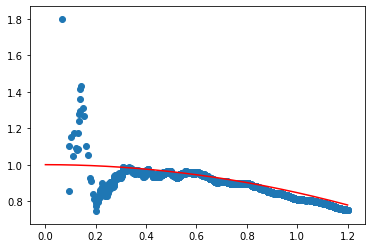

In [13]:
rmax = 1.2
rs, ball_ratios = sce.ball_ratios(0, rmax) # ball ratios at a single point
plt.scatter(rs, ball_ratios)
C = sce.fit_quad_coeff(i, 0, rmax)
print("Estimated curvature: ", -6*5*C)
xs = np.linspace(0, rmax, 200)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

Estimated curvature:  4.017277859385121


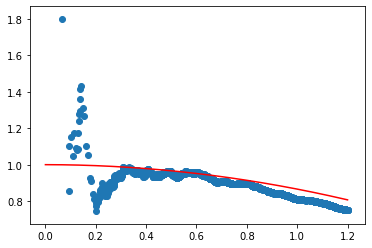

In [14]:
rmax = 1.2
rs, ball_ratios = sce.ball_ratios(0, rmax) # ball ratios at a single point
plt.scatter(rs, ball_ratios)
C = sce.fit_quad_coeff(i, 0, rmax, l2norm = False)
print("Estimated curvature: ", -6*5*C)
xs = np.linspace(0, rmax, 200)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

Test MLE method of ball volume estimation. Does terribly on S^2 and torus.

In [2]:
# Sphere test
X = np.load('X_sphere_10000.npy')
density = np.load('density_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy')

In [5]:
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist)

In [11]:
rmax = math.pi/2
n = 2
Cs = []
for i in range(10000):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax, mle = True))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_sphere_10000_rmax_piover2_empiricaldensity_avg_mle.npy', Ss)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


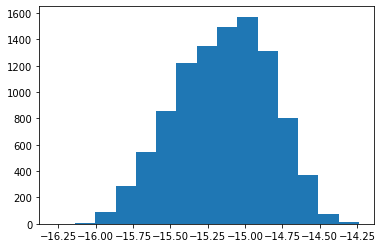

In [12]:
# MLE approach on S^2
plt.hist(Ss, bins = 15)
plt.show()

In [2]:
# check that code is still working
X = np.load('X_sphere_10000.npy')
density = np.load('density_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy')
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist)

rmax:  1.5707963267948966
rmax:  1.5707963267948966
S =  2.172530786748838


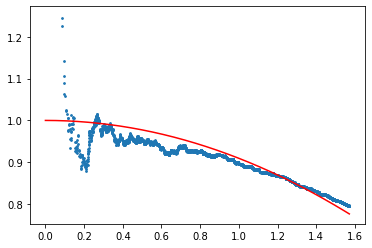

In [7]:
rs, ball_ratios = sce.ball_ratios(0, math.pi/2)
plt.scatter(rs[20:], ball_ratios[20:], s = 3)
C = sce.fit_quad_coeff(0, 0, math.pi/2)
xs = np.linspace(0, math.pi/2, 200)
ys = [1 + C*x**2 for x in xs]
S = -24*C
print("S = ", S)
plt.plot(xs, ys, color = 'r')
plt.show()

In [19]:
rmax = math.pi/2
n = 2
Cs = []
for i in range(10000):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


(array([2.000e+01, 1.430e+02, 5.640e+02, 1.481e+03, 1.839e+03, 1.910e+03,
        1.798e+03, 1.300e+03, 6.650e+02, 2.170e+02, 4.600e+01, 8.000e+00,
        6.000e+00, 1.000e+00, 2.000e+00]),
 array([2.08522493, 2.10102427, 2.1168236 , 2.13262294, 2.14842228,
        2.16422162, 2.18002095, 2.19582029, 2.21161963, 2.22741897,
        2.2432183 , 2.25901764, 2.27481698, 2.29061632, 2.30641566,
        2.32221499]),
 <a list of 15 Patch objects>)

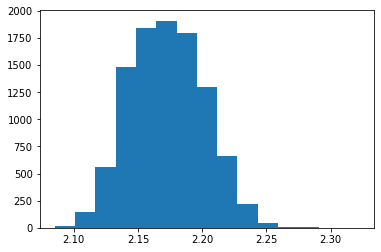

In [20]:
plt.hist(Ss, bins = 15)

In [13]:
# Torus test
X = np.load('X_torus_10000.npy')
density = np.load('density_torus_10000.npy')
Rdist = np.load('Rdist_torus_10000.npy')
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist)

In [14]:
rmax = math.pi
n = 2
Cs = []
for i in range(10000):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax, mle = True))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_torus_10000_rmax_pi_empiricaldensity_avg_mle.npy', Ss)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


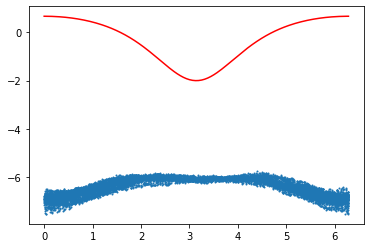

In [17]:
# MLE approach on torus
thetas = np.load("torus_thetas_10000.npy")
plt.scatter(thetas, Ss, s = 1)
xs = np.linspace(0, 2*math.pi, 200)
ys = [S_exact(x, 1, 2) for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

Test S^5

In [6]:
N = 10000
n = 5
X = sphere(N, n)
np.save('X_S5_10000.npy', X)
print("computed X")
sce = scalar_curvature_est(X, n)
Rdist = sce.get_Rdist()
np.save('Rdist_S5_10000.npy', Rdist)
print("computed Rdist")
density = sce.get_density()
np.save('density_S5_10000.npy', density)
print("computed density")

computed X
computed Rdist
computed density


In [8]:
# accidentally computed n_nbrs = 20 above. increase to 100
sce = scalar_curvature_est(X, n, n_nbrs = 100, density = density)
Rdist = sce.get_Rdist()
np.save('Rdist_S5_10000_nnbrs_100.npy', Rdist)

In [2]:
X = np.load('X_S5_10000.npy')
N = 10000
n = 5
Rdist = np.load('Rdist_S5_10000_nnbrs_100.npy')
density = np.load('density_S5_10000.npy')
sce = scalar_curvature_est(X, n, density = density, Rdist = Rdist)

In [3]:
rmax = math.pi/2
Cs = []
for i in range(N):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_S5_10000_rmax_piover2_empiricaldensity_avg_nnbrs_100.npy', Ss)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


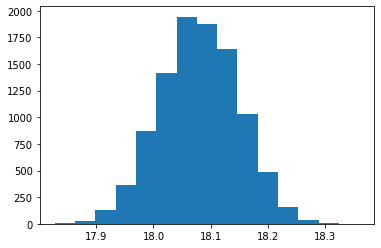

In [4]:
# S^5 with N = 10000, n_nbrs = 100. Actual scalar curvature is S = n*(n-1) = 20
plt.hist(Ss, bins = 15)
plt.show()

In [ ]:
# feed in exact Rdist
X = np.load('X_S5_10000.npy')
density = np.load('density_S5_10000.npy')
N = 10000
n = 5
Rdist_exact = sphere_Rdist_array(n, X)
np.save("Rdist_S5_exact.npy", Rdist_exact)
print("computed exact Rdist")
sce = scalar_curvature_est(X, n, density = density, Rdist = Rdist_exact)
print("initialized sce")

rmax = math.pi/2
Cs = []
for i in range(N):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_S5_10000_rmax_piover2_empiricaldensity_avg_Rdist_exact.npy', Ss)

computed exact Rdist


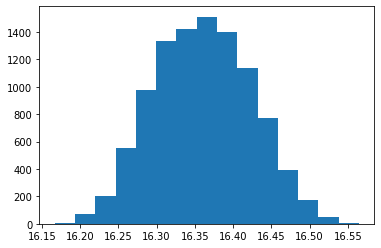

In [2]:
# S^5 with N = 10000, exact Rdist. Actual curvature is S = 20
Ss = np.load('Sest_S5_10000_rmax_piover2_empiricaldensity_avg_Rdist_exact.npy')
plt.hist(Ss, bins = 15)
plt.show()

Test S^7

In [3]:
N = 10000
n = 7
X = sphere(N, n)
np.save('X_S7_10000.npy', X)
print("computed X")
Rdist_exact = sphere_Rdist_array(n, X)
np.save('Rdist_S7_10000_exact.npy', Rdist_exact)
print("computed Rdist")
sce = scalar_curvature_est(X, n, Rdist = Rdist_exact)
density = sce.get_density()
np.save('density_S7_10000.npy', density)
print("computed density")

computed X
computed Rdist
computed density


In [4]:
rmax = math.pi/2
Cs = []
for i in range(N):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_S7_10000_rmax_piover2_empiricaldensity_avg_Rdist_exact.npy', Ss)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


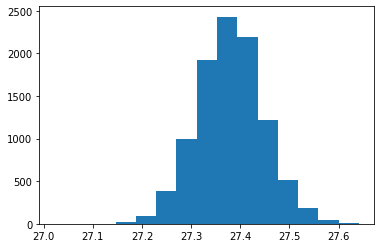

In [5]:
# S^7 with N = 10000, exact Rdist
plt.hist(Ss, bins = 15)
plt.show()

In [4]:
N = 20000
n = 7
X = sphere(N, n)
np.save('X_S7_20000.npy', X)
print("computed X")
Rdist_exact = sphere_Rdist_array(n, X)
np.save('Rdist_S7_20000_exact.npy', Rdist_exact)
print("computed Rdist")
sce = scalar_curvature_est(X, n, Rdist = Rdist_exact)
density = sce.get_density()
np.save('density_S7_20000.npy', density)
print("computed density")

computed X
computed Rdist
computed density


In [3]:
N = 20000
n = 7
X = np.load('X_S7_20000.npy')
Rdist = np.load('Rdist_S7_20000_exact.npy')
density = np.load('density_S7_20000.npy')
sce = scalar_curvature_est(X, n, Rdist = Rdist, density = density)

In [4]:
rmax = math.pi/2
Cs = []
for i in range(N):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_S7_20000_rmax_piover2_empiricaldensity_avg_Rdist_exact.npy', Ss)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15300
15400
15500
15600
15700
15800
15900
16000
16100
16200
16300
16400
16500
16600
16700
16800
16900
17000
17100
17200
17300
17400
17500
17600
17700
17800
17900
18000
18100
18200
18300
18400
18

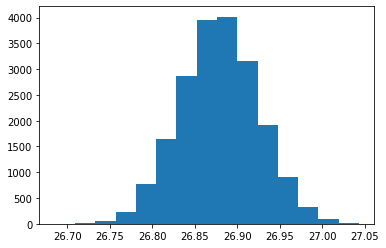

In [5]:
# S^7 with N = 20000, exact Rdist
plt.hist(Ss, bins = 15)
plt.show()

Test S^7 with estimated Rdist

In [ ]:
N = 10000
n = 7
X = np.load('X_S7_10000.npy')
density = np.load('density_S7_10000.npy')
sce = scalar_curvature_est(X, n, n_nbrs = 200, density = density)
Rdist = sce.get_Rdist()
np.save("Rdist_S7_10000_nnbrs_200.npy", Rdist)

In [ ]:
rmax = math.pi/2
Cs = []
for i in range(N):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_S7_10000_rmax_piover2_empiricaldensity_avg_nnbrs200.npy', Ss)

Test that we get qualitative trends correct. For example, if I decrease/increase the radius of a sphere, does the curvature increase/decrease quadratically?

In [19]:
N = 10000
n = 2
X = sphere(N, n, R = .5)
np.save("X_sphere_10000_radius.5.npy", X)
print("computed X")
sce = scalar_curvature_est(X, n)
Rdist = sce.get_Rdist()
np.save("Rdist_sphere_10000_radius.5.npy", Rdist)
print("computed Rdist")
density = sce.get_density()
np.save("density_sphere_10000_radius.5.npy", density)
print("computed density")

rmax = (math.pi/2)/2
Cs = []
for i in range(N):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_sphere_10000_radius.5_rmax_Rpiover2_empiricaldensity_avg.npy', Ss)

computed X
computed Rdist
computed density
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


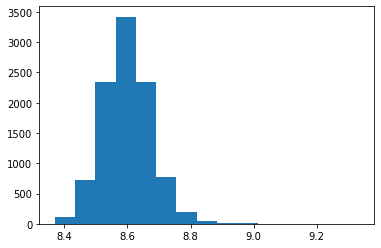

In [20]:
plt.hist(Ss, bins = 15)
plt.show()

In [6]:
# radius = 2
N = 10000
n = 2
X = sphere(N, n, R = 2)
np.save("X_sphere_10000_radius2.npy", X)
print("computed X")
sce = scalar_curvature_est(X, n)
Rdist = sce.get_Rdist()
np.save("Rdist_sphere_10000_radius2.npy", Rdist)
density = sce.get_density()
np.save("density_sphere_10000_radius2.npy", density)

computed X


In [7]:
rmax = (math.pi/2)*2 # pi*R/2
Cs = []
for i in range(N):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]
np.save('Sest_sphere_10000_radius2_rmax_Rpiover2_empiricaldensity_avg.npy', Ss)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


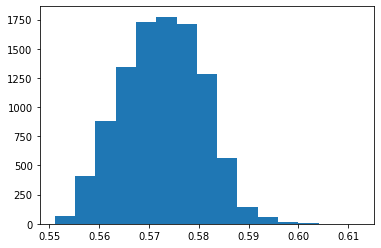

In [8]:
plt.hist(Ss, bins = 15)
plt.show()

Will fit error in C reflect bad choice of dimension?

In [31]:
# Baseline- correct dimension 
X = np.load('X_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy') # calculated with n_nbrs = 20
density = np.load('density_sphere_10000.npy')
n = 2
sce = scalar_curvature_est(X, n, density = density, Rdist = Rdist, use_avg_density = True)

In [32]:
rs, ball_ratios = sce.ball_ratios(0, math.pi/2)
C = sce.fit_quad_coeff(0, 0, math.pi/2)

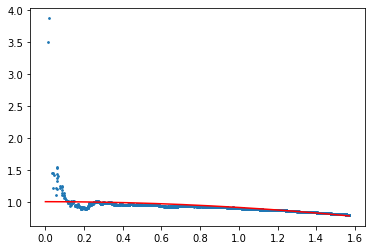

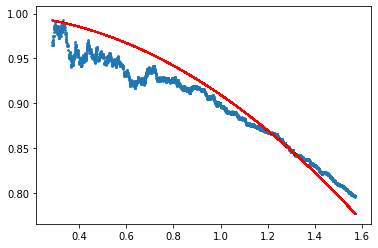

In [33]:
xs = np.linspace(0, math.pi/2, 200)
ys = [1 + C*x**2 for x in xs]
plt.scatter(rs, ball_ratios, s = 3)
plt.plot(xs, ys, color = 'r')
plt.show()

xs = np.linspace(rs[200:], math.pi/2, 200)
ys = [1 + C*x**2 for x in xs]
plt.scatter(rs[200:], ball_ratios[200:], s = 3)
plt.plot(xs, ys, color = 'r')
plt.show()

In [34]:
rs, Cs, errs = sce.quad_coeff_errs(0, math.pi)

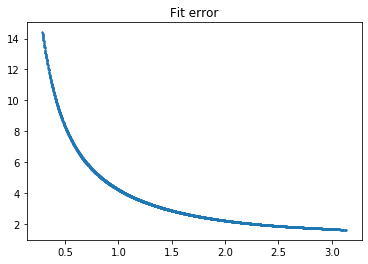

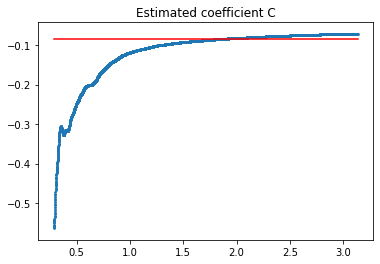

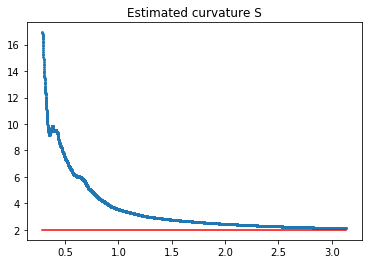

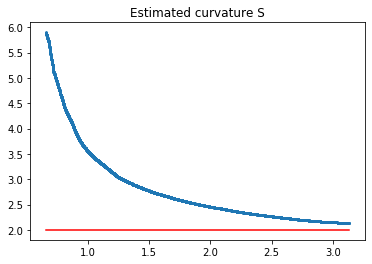

In [35]:
plt.title("Fit error")
start_idx = 200
plt.scatter(rs[start_idx:], errs[start_idx:], s = 1)
plt.show()

n = 3
plt.title("Estimated coefficient C")
plt.scatter(rs[start_idx:], Cs[start_idx:], s = 3)
correct_C = -2/(6*(2 + 2))
plt.plot([rs[start_idx], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

plt.title("Estimated curvature S")
Ss = [-6*(n+2)*C for C in Cs]
correct_S = 2
plt.scatter(rs[start_idx:], Ss[start_idx:], s = 3)
plt.plot([rs[start_idx], rs[-1]], [correct_S, correct_S], color = 'r')
plt.show()


plt.title("Estimated curvature S")
Ss = [-6*(n+2)*C for C in Cs]
correct_S = 2
start_idx = 1000
plt.scatter(rs[start_idx:], Ss[start_idx:], s = 3)
plt.plot([rs[start_idx], rs[-1]], [correct_S, correct_S], color = 'r')
plt.show()

In [36]:
# distribution of fit errors at rmax = pi/2
err_dist = []
for i in range(10000):
    if i%100 == 0:
        print(i)
    _, _, errs = sce.quad_coeff_errs(i, math.pi/2)
    err_dist.append(errs[-1])

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


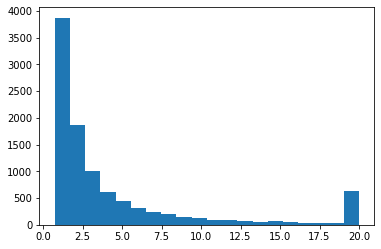

In [44]:
plt.hist(np.clip(err_dist, 0, 20), bins = 20)
plt.show()

Testing fit error on S^2 with estimated dimension n = 3

In [45]:
X = np.load('X_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy') # calculated with n_nbrs = 20
n = 3
sce = scalar_curvature_est(X, 3, Rdist = Rdist, use_avg_density = True) # don't use precalculated density, because density also depends on dimension

In [21]:
rs, ball_ratios = sce.ball_ratios(0, math.pi/2)
C = sce.fit_quad_coeff(0, 0, math.pi/2)

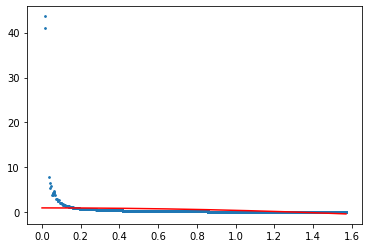

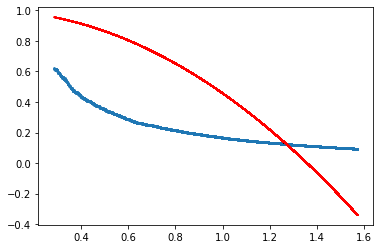

In [23]:
xs = np.linspace(0, math.pi/2, 200)
ys = [1 + C*x**2 for x in xs]
plt.scatter(rs, ball_ratios, s = 3)
plt.plot(xs, ys, color = 'r')
plt.show()

xs = np.linspace(rs[200:], math.pi/2, 200)
ys = [1 + C*x**2 for x in xs]
plt.scatter(rs[200:], ball_ratios[200:], s = 3)
plt.plot(xs, ys, color = 'r')
plt.show()

In [12]:
rs, Cs, errs = sce.quad_coeff_errs(0, math.pi)

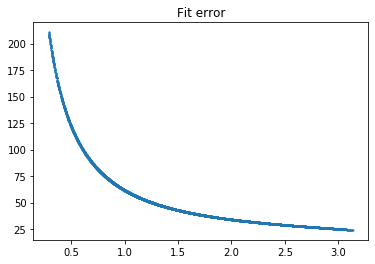

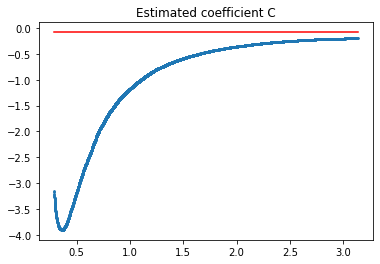

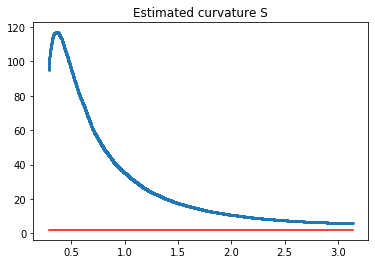

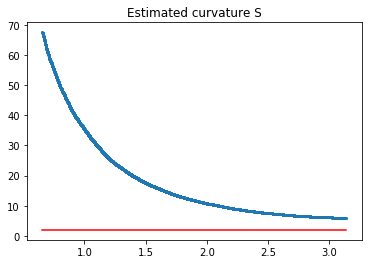

In [16]:
plt.title("Fit error")
start_idx = 200
plt.scatter(rs[start_idx:], errs[start_idx:], s = 1)
plt.show()

n = 3
plt.title("Estimated coefficient C")
plt.scatter(rs[start_idx:], Cs[start_idx:], s = 3)
correct_C = -2/(6*(2 + 2))
plt.plot([rs[start_idx], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

plt.title("Estimated curvature S")
Ss = [-6*(n+2)*C for C in Cs]
correct_S = 2
plt.scatter(rs[start_idx:], Ss[start_idx:], s = 3)
plt.plot([rs[start_idx], rs[-1]], [correct_S, correct_S], color = 'r')
plt.show()


plt.title("Estimated curvature S")
Ss = [-6*(n+2)*C for C in Cs]
correct_S = 2
start_idx = 1000
plt.scatter(rs[start_idx:], Ss[start_idx:], s = 3)
plt.plot([rs[start_idx], rs[-1]], [correct_S, correct_S], color = 'r')
plt.show()

In [46]:
# n = 3, distribution of fit errors at rmax = pi/2
err_dist_3 = []
for i in range(10000):
    if i%100 == 0:
        print(i)
    _, _, errs = sce.quad_coeff_errs(i, math.pi/2)
    err_dist_3.append(errs[-1])

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


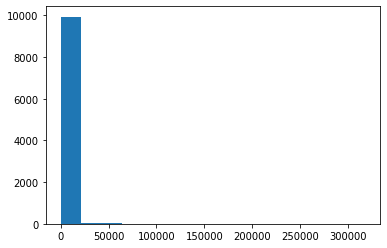

In [51]:
plt.hist(err_dist_3, bins = 15)
plt.show()

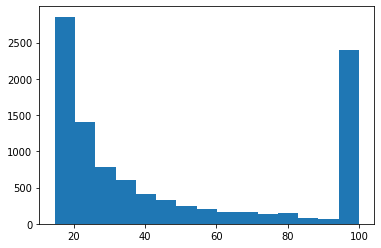

In [52]:
plt.hist(np.clip(err_dist_3, 0, 100), bins = 15)
plt.show()

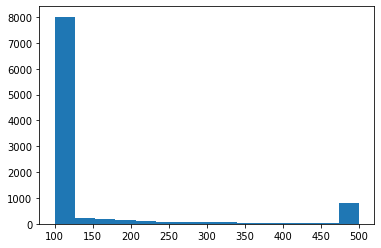

In [55]:
plt.hist(np.clip(err_dist_3, 100, 500), bins = 15)
plt.show()

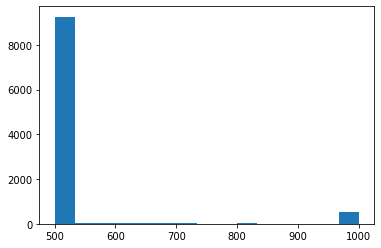

In [56]:
plt.hist(np.clip(err_dist_3, 500, 1000), bins = 15)
plt.show()

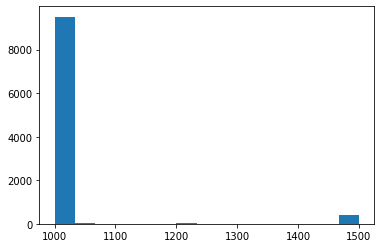

In [58]:
plt.hist(np.clip(err_dist_3, 1000, 1500), bins = 15)
plt.show()

In [24]:
n = 4
X = np.load('X_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy') # calculated with n_nbrs = 20
sce = scalar_curvature_est(X, n, Rdist = Rdist, use_avg_density = True) # don't use precalculated density, because density also depends on dimension

In [25]:
rs, ball_ratios = sce.ball_ratios(0, math.pi/2)
C = sce.fit_quad_coeff(0, 0, math.pi/2)

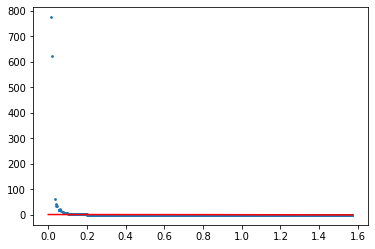

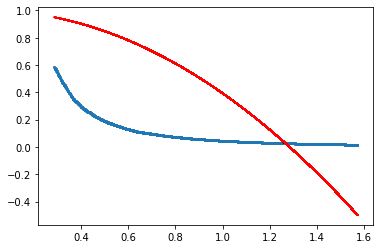

In [26]:
xs = np.linspace(0, math.pi/2, 200)
ys = [1 + C*x**2 for x in xs]
plt.scatter(rs, ball_ratios, s = 3)
plt.plot(xs, ys, color = 'r')
plt.show()

xs = np.linspace(rs[200:], math.pi/2, 200)
ys = [1 + C*x**2 for x in xs]
plt.scatter(rs[200:], ball_ratios[200:], s = 3)
plt.plot(xs, ys, color = 'r')
plt.show()

In [29]:
rs, Cs, errs = sce.quad_coeff_errs(0, math.pi)

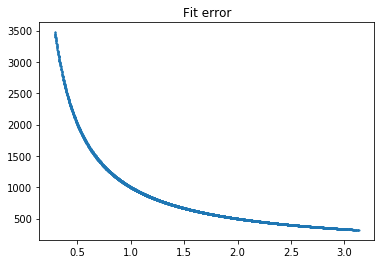

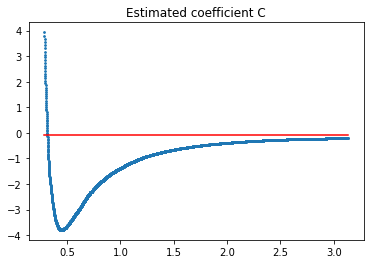

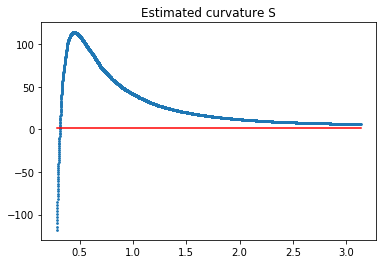

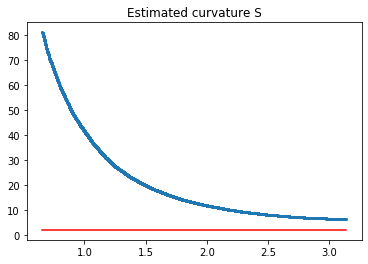

In [30]:
plt.title("Fit error")
start_idx = 200
plt.scatter(rs[start_idx:], errs[start_idx:], s = 1)
plt.show()

n = 3
plt.title("Estimated coefficient C")
plt.scatter(rs[start_idx:], Cs[start_idx:], s = 3)
correct_C = -2/(6*(2 + 2))
plt.plot([rs[start_idx], rs[-1]], [correct_C, correct_C], color = 'r')
plt.show()

plt.title("Estimated curvature S")
Ss = [-6*(n+2)*C for C in Cs]
correct_S = 2
plt.scatter(rs[start_idx:], Ss[start_idx:], s = 3)
plt.plot([rs[start_idx], rs[-1]], [correct_S, correct_S], color = 'r')
plt.show()

plt.title("Estimated curvature S")
Ss = [-6*(n+2)*C for C in Cs]
correct_S = 2
start_idx = 1000
plt.scatter(rs[start_idx:], Ss[start_idx:], s = 3)
plt.plot([rs[start_idx], rs[-1]], [correct_S, correct_S], color = 'r')
plt.show()

Test euclidean space for a baseline. Use exact distance/density to start. Test a sample of points (N = 10,000) from the Euclidean ball of radius 2. Happens to have same density as 2-sphere. Observations:

- Curvature estimates seem pretty close to 0. At rmax = 1.5, varies between -.2 and .05. At rmax = 1.2, varies between -.4 and .3. At rmax = 1, pretty bad: varies between -1 and 1, but still centered at 0 at least.
- But, it's not spatially random. 

In [23]:
# Exact "Rdist" and pdf
N = 10000
n = 2
R = 2
X = euc_sample(N, n, R)
print("computed X")
np.save("X_euc_10000_R2.npy", X)
Rdist = euc_distance(X)
np.save("Rdist_euc_10000_R2_exact.npy", Rdist)
print("computed Rdist")

computed X
computed Rdist


In [24]:
density = euc_density(n, R) # happens to be 1/(4*pi^2) = same density as on S^2
density_array = [density for i in range(N)]
sce = scalar_curvature_est(X, n, Rdist = Rdist, density = density_array, use_avg_density = False) # use_avg_density = False because density is uniform anyway

In [50]:
rmax = 1.5
small_indices = [i for i in range(N) if np.linalg.norm(X[i, :]) < R - rmax]

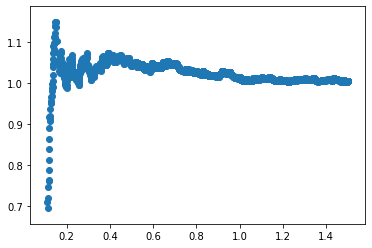

In [40]:
rs, ball_ratios = sce.ball_ratios(small_indices[0], rmax)
plt.scatter(rs[20:], ball_ratios[20:])
plt.show()

In [51]:
Cs = []
k = 0
for i in small_indices:
    if k%100 == 0:
        print(k)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
    k += 1
Ss = [-6*(n + 2)*C for C in Cs]

0
100
200
300
400
500
600


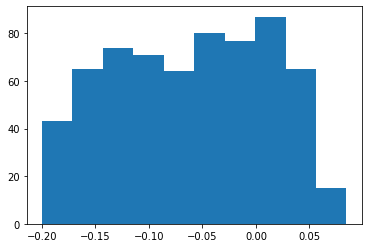

In [45]:
plt.hist(Ss)
plt.show()

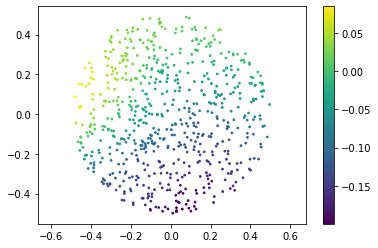

In [52]:
X_small = np.array([X[i, :] for i in small_indices])
plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

In [46]:
# Can we decrease rmax a little?
rmax = 1.25
small_indices = [i for i in range(N) if np.linalg.norm(X[i, :]) < R - rmax]
Cs = []
k = 0
for i in small_indices:
    if k%100 == 0:
        print(k)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
    k += 1
Ss = [-6*(n + 2)*C for C in Cs]

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400


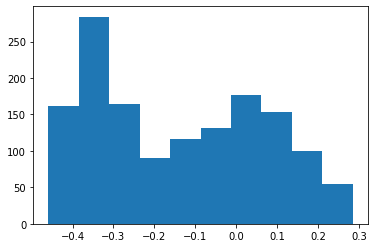

In [47]:
plt.hist(Ss)
plt.show()

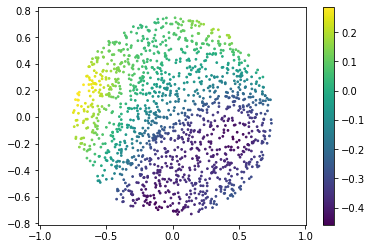

In [49]:
X_small = np.array([X[i, :] for i in small_indices])
plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

In [53]:
# Decrease rmax to rmax = 1?
rmax = 1
small_indices = [i for i in range(N) if np.linalg.norm(X[i, :]) < R - rmax]
Cs = []
k = 0
for i in small_indices:
    if k%100 == 0:
        print(k)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
    k += 1
Ss = [-6*(n + 2)*C for C in Cs]

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500


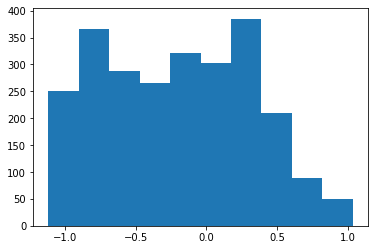

In [54]:
plt.hist(Ss)
plt.show()

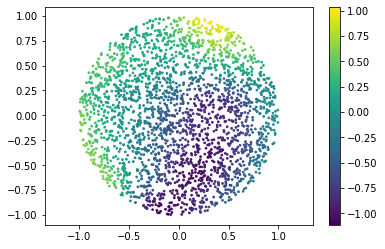

In [55]:
X_small = np.array([X[i, :] for i in small_indices])
plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

More euclidean tests, but this time empirical Rdist and empirical density. There's less spatial correlation (good), but less accuracy

In [56]:
sce = scalar_curvature_est(X, n)
Rdist = sce.get_Rdist()
np.save("Rdist_euc_10000_R2.npy", Rdist)
density = sce.get_density()
np.save("density_euc_10000_R2.npy", density)

computed Rdist
computed nearest neighbor distances
computed density


In [57]:
rmax = 1.5
small_indices = [i for i in range(N) if np.linalg.norm(X[i, :]) < R - rmax]

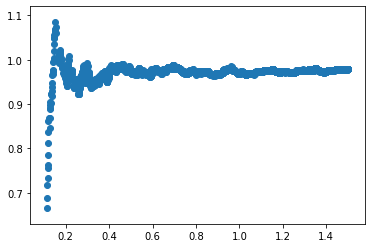

In [58]:
rs, ball_ratios = sce.ball_ratios(small_indices[0], rmax)
plt.scatter(rs[20:], ball_ratios[20:])
plt.show()

In [59]:
Cs = []
k = 0
for i in small_indices:
    if k%100 == 0:
        print(k)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
    k += 1
Ss = [-6*(n + 2)*C for C in Cs]

0
100
200
300
400
500
600


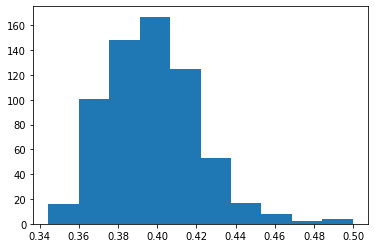

In [60]:
plt.hist(Ss)
plt.show()

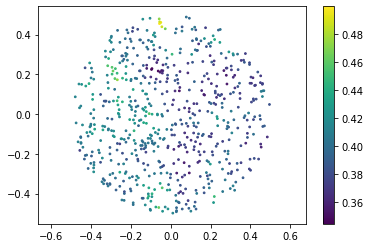

In [61]:
X_small = np.array([X[i, :] for i in small_indices])
plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

In [62]:
# decrease to rmax = 1.2
rmax = 1.2
small_indices = [i for i in range(N) if np.linalg.norm(X[i, :]) < R - rmax]

In [63]:
Cs = []
k = 0
for i in small_indices:
    if k%100 == 0:
        print(k)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
    k += 1
Ss = [-6*(n + 2)*C for C in Cs]

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600


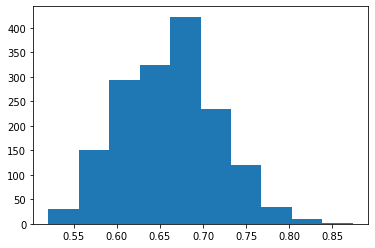

In [64]:
plt.hist(Ss)
plt.show()

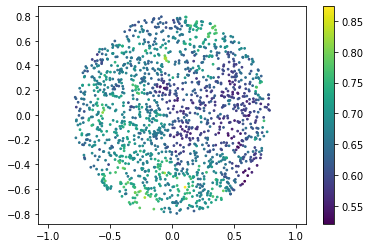

In [65]:
X_small = np.array([X[i, :] for i in small_indices])
plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

In [66]:
# decrease to rmax = 1
rmax = 1.2
small_indices = [i for i in range(N) if np.linalg.norm(X[i, :]) < R - rmax]

In [67]:
Cs = []
k = 0
for i in small_indices:
    if k%100 == 0:
        print(k)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
    k += 1
Ss = [-6*(n + 2)*C for C in Cs]

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600


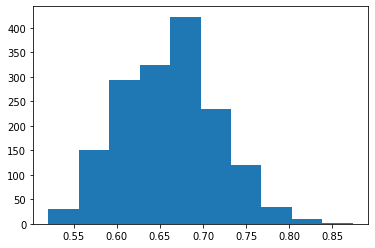

In [68]:
plt.hist(Ss)
plt.show()

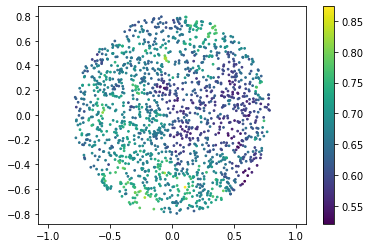

In [69]:
X_small = np.array([X[i, :] for i in small_indices])
plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

another euclidean test- what happens if we use Rdist in KDE? does the curvature estimation change?

In [4]:
n = 2
X = np.load("X_euc_10000_R2.npy")
Rdist = np.load("Rdist_euc_10000_R2.npy")
kde = KDE(2, D = Rdist)
density_Rdist = kde.density()
np.save("density_X_euc_10000_R2_Rdist.npy")

TypeError: _save_dispatcher() missing 1 required positional argument: 'arr'

In [5]:
np.save("density_X_euc_10000_R2_Rdist.npy", density_Rdist)

In [6]:
sce = scalar_curvature_est(X, n, density = density_Rdist, Rdist = Rdist)

computed nearest neighbor distances


In [8]:
N = 10000
rmax = 1.5
R = 2
small_indices = [i for i in range(N) if np.linalg.norm(X[i, :]) < R - rmax]

Cs = []
k = 0
for i in small_indices:
    if k%100 == 0:
        print(k)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
    k += 1
Ss = [-6*(n + 2)*C for C in Cs]

0
100
200
300
400
500
600


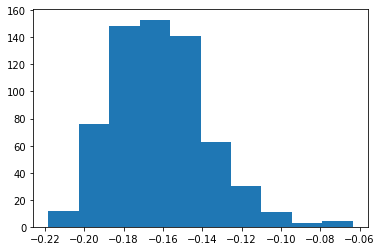

In [9]:
plt.hist(Ss)
plt.show()

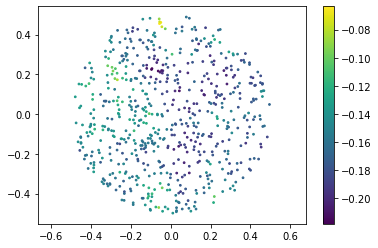

In [10]:
X_small = np.array([X[i, :] for i in small_indices])
plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

In [11]:
# decrease to rmax = 1.25
rmax = 1.25
small_indices = [i for i in range(N) if np.linalg.norm(X[i, :]) < R - rmax]

Cs = []
k = 0
for i in small_indices:
    if k%100 == 0:
        print(k)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
    k += 1
Ss = [-6*(n + 2)*C for C in Cs]

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400


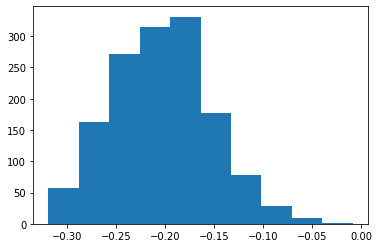

In [12]:
plt.hist(Ss)
plt.show()

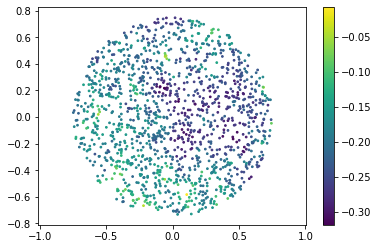

In [13]:
X_small = np.array([X[i, :] for i in small_indices])
plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

In [14]:
# decrease to rmax = 1
rmax = 1
small_indices = [i for i in range(N) if np.linalg.norm(X[i, :]) < R - rmax]

Cs = []
k = 0
for i in small_indices:
    if k%100 == 0:
        print(k)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
    k += 1
Ss = [-6*(n + 2)*C for C in Cs]

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500


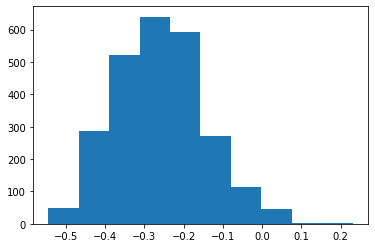

In [15]:
plt.hist(Ss)
plt.show()

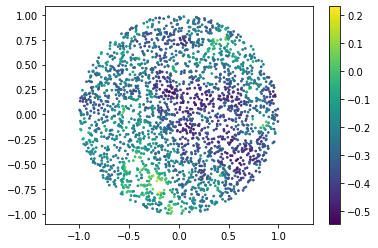

In [16]:
X_small = np.array([X[i, :] for i in small_indices])
plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

Density estimation- on a manifold, is it better to use estimated Rdist vs. euclidean distance? In Euclidean space it would be more accurate to use euc dist, but on a general manifold, it's probably to be as close as possible to Rdist. Even in euclidean space, we seem to get better results when we use RDist in KDE (see above)

In [77]:
# Euclidean example
kde = KDE(n, D = Rdist)
density_Rdist = kde.density()

In [30]:
def compare_density(X, density_Rdist, density, real_density):
    N = X.shape[0]
    plt.scatter(X[:, 0], X[:, 1], s = 3, c = density_Rdist) # empirically computed density, using estimated Rdist
    plt.axis('equal')
    plt.colorbar()
    plt.title("empirical, with estimated Rdist")
    plt.show()

    plt.scatter(X[:, 0], X[:, 1], s = 3, c = density) # empirically computed density, using euclidean distance
    plt.axis('equal')
    plt.title("empirical, with Euc dist")
    plt.colorbar()
    plt.show()

    density_diff = [density_Rdist[i] - density[i] for i in range(N)]
    plt.scatter(X[:, 0], X[:, 1], s = 3, c = density_diff) # difference
    plt.axis('equal')
    plt.title("difference between empirical densities")
    plt.colorbar()
    plt.show()

    diff = [density_Rdist[i] - real_density for i in range(N)]
    plt.scatter(X[:, 0], X[:, 1], s = 3, c = diff) # difference
    plt.axis('equal')
    plt.title("difference between Rdist empirical and analytic")
    plt.colorbar()
    plt.show()

    diff = [density[i] - real_density for i in range(N)]
    plt.scatter(X[:, 0], X[:, 1], s = 3, c = diff) # difference
    plt.axis('equal')
    plt.title("difference between euc empirical and analytic")
    plt.colorbar()
    plt.show()

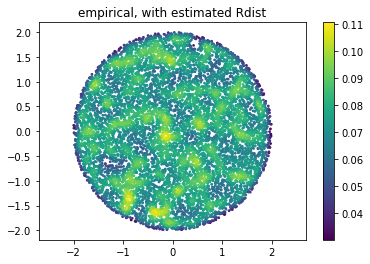

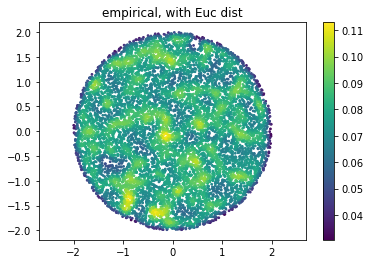

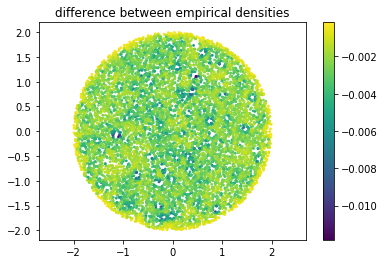

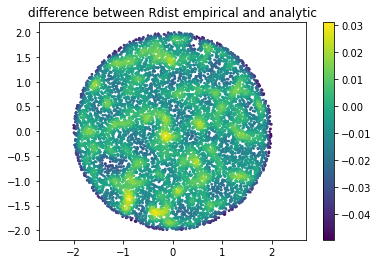

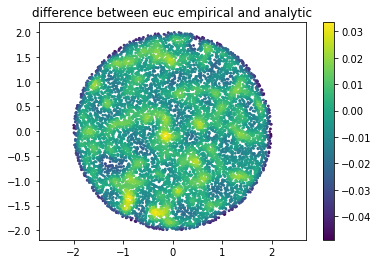

In [81]:
real_density = euc_density(n = 2, R = 2)
compare_density(X, density_Rdist, density, real_density)

In [82]:
# S^2 example
X = np.load('X_sphere_10000.npy')
n = 2
Rdist = np.load('Rdist_sphere_10000.npy')
kde = KDE(n, D = Rdist)
density_Rdist = kde.density()

In [83]:
# can't do 3d plots on server? workaround
Xnorth_proj = np.array([[X[i, 0], X[i, 1]] for i in range(10000) if X[i, 2] > 0])
Xsouth_proj = np.array([[X[i, 0], X[i, 1]] for i in range(10000) if X[i, 2] < 0])
density_Rdist_north= [density_Rdist[i] for i in range(10000) if X[i, 2] > 0]
density_Rdist_south = [density_Rdist[i] for i in range(10000) if X[i, 2] < 0]
density = np.load('density_sphere_10000.npy')
density_north = [density[i] for i in range(10000) if X[i, 2] > 0]
density_south = [density[i] for i in range(10000) if X[i, 2] < 0]

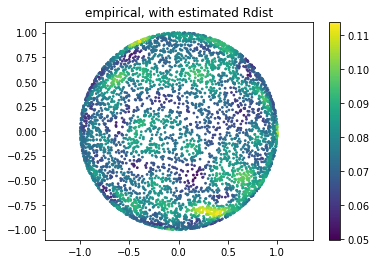

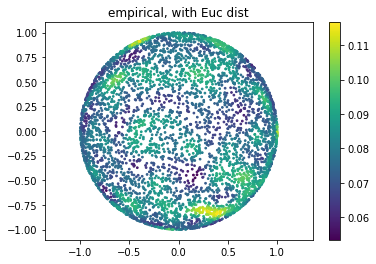

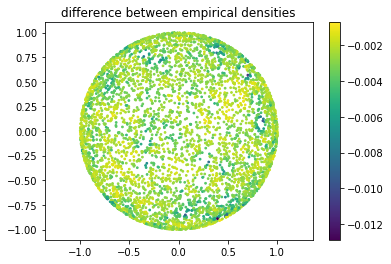

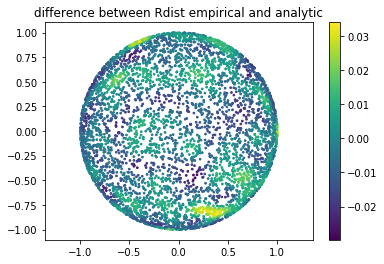

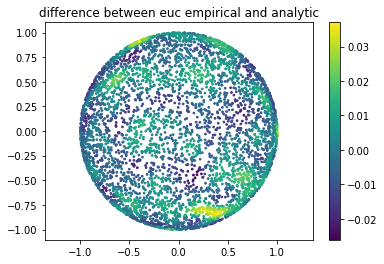

In [88]:
# visualization on north hemisphere
real_density = 1/sphere_volume(n)
compare_density(Xnorth_proj, density_Rdist_north, density_north, real_density)

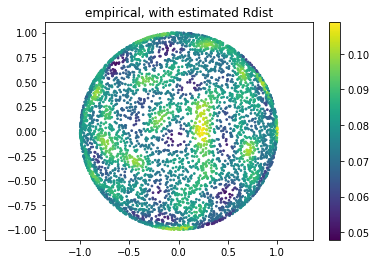

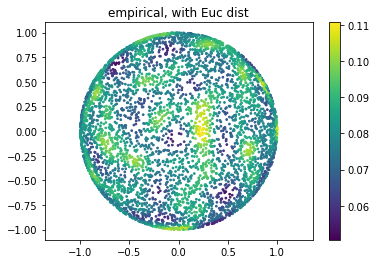

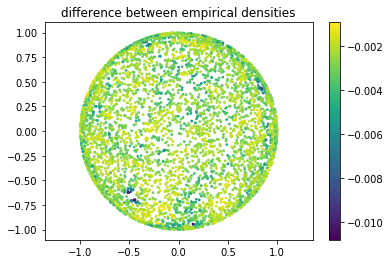

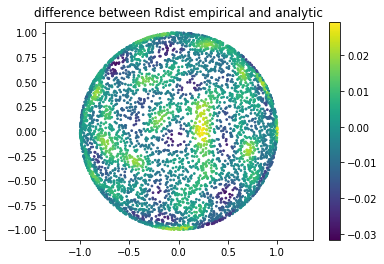

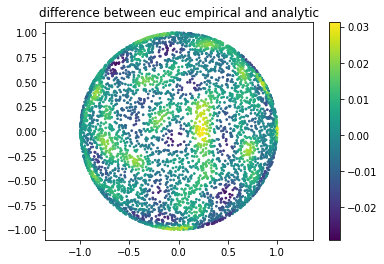

In [89]:
# visualization on southern hemisphere
compare_density(Xsouth_proj, density_Rdist_south, density_south, real_density)

In [93]:
# Hyperbolic example (poincare disk)
N = 10000
X = hyperbolic_disk(N, K = -1)
np.save("X_poincare_10000.npy", X)

In [94]:
Rdist = hyperbolic_Rdist_array(X)
np.save("Rdist_pointcare_10000_exact.npy", Rdist)

In [95]:
n = 2
kde = KDE(n, D = Rdist)
density_Rdist = kde.density()
np.save("density_poincare_1000.npy", density_Rdist)

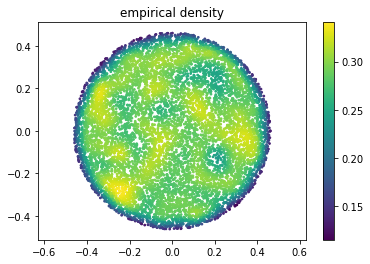

0.29305950698470384


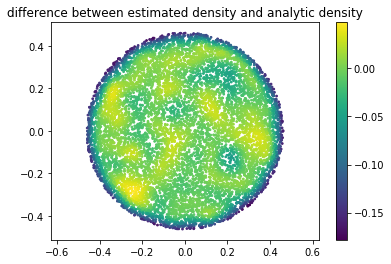

In [98]:
plt.scatter(X[:, 0], X[:, 1], s = 3, c = density_Rdist)
plt.axis('equal')
plt.title("empirical density")
plt.colorbar()
plt.show()

real_density = 1/hyperbolic_disk_area(-1)
print(real_density)
diff = [density_Rdist[i] - real_density for i in range(10000)]
plt.scatter(X[:, 0], X[:, 1], s = 3, c = diff)
plt.axis('equal')
plt.title("difference between estimated density and analytic density")
plt.colorbar()
plt.show()

Test curvature estimation- sphere with Rdist used in density estimation

In [17]:
N = 10000
n = 2
X = np.load('X_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy')
kde = KDE(n, D = Rdist)
density_Rdist = kde.density()
np.save("density_sphere_10000_Rdist.npy", density_Rdist)

In [18]:
sce = scalar_curvature_est(X, n, density = density_Rdist, Rdist = Rdist)

computed nearest neighbor distances


In [19]:
rmax = math.pi/2
Cs = []
for i in range(N):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


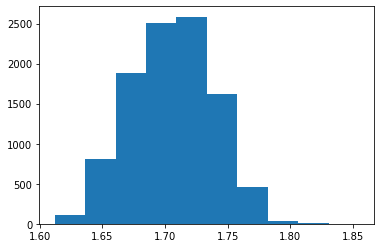

In [21]:
plt.hist(Ss)
plt.show()

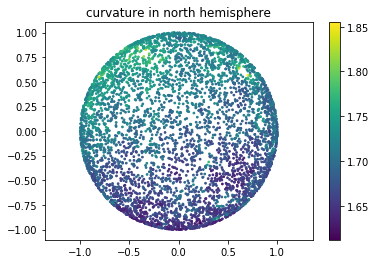

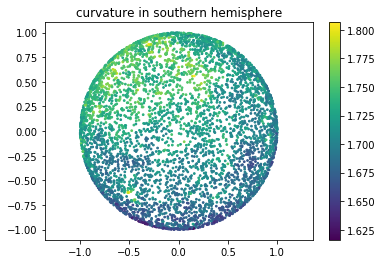

In [24]:
Xnorth_proj = np.array([[X[i, 0], X[i, 1]] for i in range(10000) if X[i, 2] > 0])
Ss_north = [Ss[i] for i in range(10000) if X[i, 2] > 0]
plt.scatter(Xnorth_proj[:, 0], Xnorth_proj[:, 1], s = 3, c = Ss_north)
plt.axis('equal')
plt.title("curvature in north hemisphere")
plt.colorbar()
plt.show()

Xsouth = np.array([[X[i, 0], X[i, 1]] for i in range(10000) if X[i, 2] < 0])
Ss_south = [Ss[i] for i in range(10000) if X[i, 2] < 0]
plt.scatter(Xsouth[:, 0], Xsouth[:, 1], s = 3, c = Ss_south)
plt.axis('equal')
plt.title("curvature in southern hemisphere")
plt.colorbar()
plt.show()

Again- sphere with Rdist used in density estimation, but this time with Gaussian kernel. Weirdly, the density is far more accurate (closer to analytic density), but curvature estimation is far more inaccurate

In [25]:
N = 10000
n = 2
X = np.load('X_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy')
kde = KDE(n, D = Rdist, kernel = KDE.gauss)
density_Rdist = kde.density()
np.save("density_sphere_10000_Rdist_gauss.npy", density_Rdist)

In [58]:
density_Rdist = np.load('density_sphere_10000_Rdist_gauss.npy')
sce = scalar_curvature_est(X, n, density = density_Rdist, Rdist = Rdist)

computed nearest neighbor distances


In [27]:
rmax = math.pi/2
Cs = []
for i in range(N):
    if i%100 == 0:
        print(i)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
Ss = [-6*(n + 2)*C for C in Cs]

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


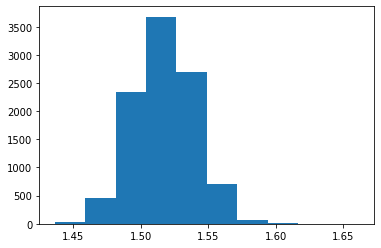

In [28]:
plt.hist(Ss)
plt.show()

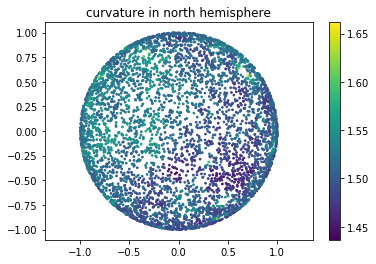

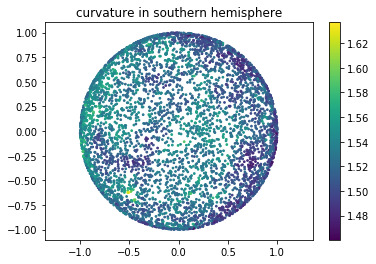

In [29]:
Xnorth_proj = np.array([[X[i, 0], X[i, 1]] for i in range(10000) if X[i, 2] > 0])
Ss_north = [Ss[i] for i in range(10000) if X[i, 2] > 0]
plt.scatter(Xnorth_proj[:, 0], Xnorth_proj[:, 1], s = 3, c = Ss_north)
plt.axis('equal')
plt.title("curvature in north hemisphere")
plt.colorbar()
plt.show()

Xsouth = np.array([[X[i, 0], X[i, 1]] for i in range(10000) if X[i, 2] < 0])
Ss_south = [Ss[i] for i in range(10000) if X[i, 2] < 0]
plt.scatter(Xsouth[:, 0], Xsouth[:, 1], s = 3, c = Ss_south)
plt.axis('equal')
plt.title("curvature in southern hemisphere")
plt.colorbar()
plt.show()

In [33]:
# compare density
real_density = 1/sphere_volume(2)
density = np.load("density_sphere_10000.npy")
density_north = [density[i] for i in range(10000) if X[i, 2] > 0]
density_south = [density[i] for i in range(10000) if X[i, 2] < 0]
density_Rdist_north = [density_Rdist[i] for i in range(10000) if X[i, 2] > 0]
density_Rdist_south = [density_Rdist[i] for i in range(10000) if X[i, 2] < 0]

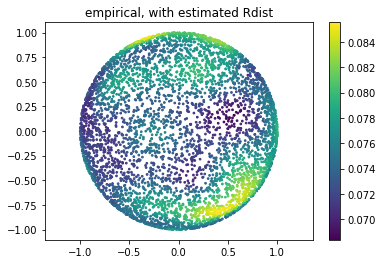

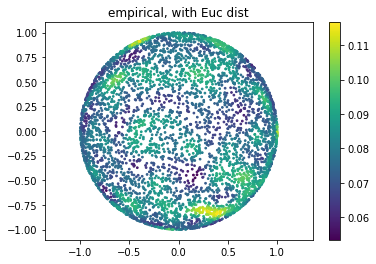

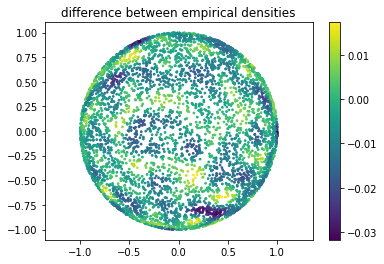

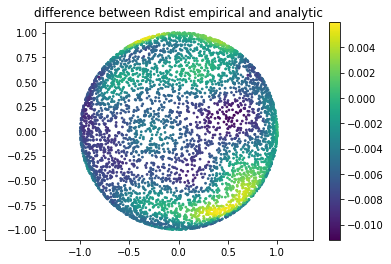

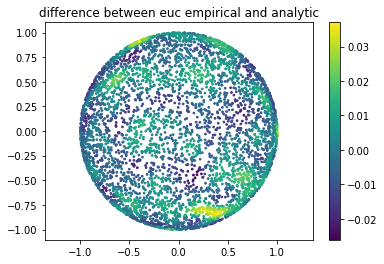

In [34]:
compare_density(Xnorth_proj, density_Rdist_north, density_north, real_density)

In [35]:
print(real_density)

0.07957747154594766


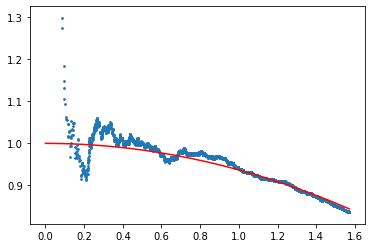

1.517361145236797


In [59]:
rmax = math.pi/2
rs, ball_ratios_Rdist = sce.ball_ratios(0, rmax)
plt.scatter(rs[20:], ball_ratios_Rdist[20:], s = 3)

C = sce.fit_quad_coeff(0, 0, rmax)
xs = np.linspace(0, rmax, 200)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()
S = -24*C
print(S)

In [60]:
# comparison: ball ratios using OG density
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist)

computed nearest neighbor distances


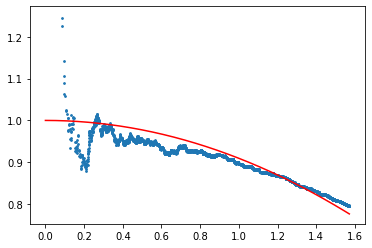

2.172530786748838


In [61]:
rmax = math.pi/2
rs, ball_ratios = sce.ball_ratios(0, rmax)
plt.scatter(rs[20:], ball_ratios[20:], s = 3)

C = sce.fit_quad_coeff(0, 0, rmax)
xs = np.linspace(0, rmax, 200)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()
S = -24*C
print(S)

In [44]:
# maybe try l2norm = False (in C, use a dr term)?
sce = scalar_curvature_est(X, 2, density = density_Rdist, Rdist = Rdist)

computed nearest neighbor distances


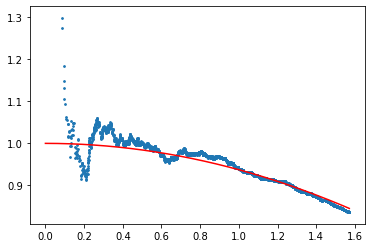

1.505910965779738


In [47]:
rmax = math.pi/2
rs, ball_ratios_Rdist_Crefine = sce.ball_ratios(0, rmax)
plt.scatter(rs[20:], ball_ratios_Rdist_Crefine[20:], s = 3)

C = sce.fit_quad_coeff(0, 0, rmax, l2norm = False)
xs = np.linspace(0, rmax, 200)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()
S = -24*C
print(S)

In the plots above, it doesn't look like the ball ratio estimations are all that different. Below: direct comparison between ball_ratios_Rdist (density calculated using Rdist) and ball_ratios (OG ball_ratios). Ball_ratios_Rdist is always greater than ball_ratios, by about .05. This difference is pretty large when we're looking at a curve that goes from 1 to .8ish.

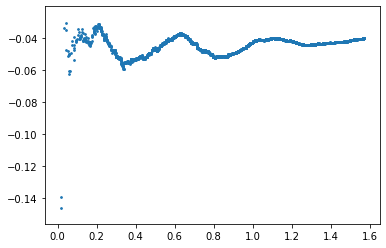

In [66]:
diff = [ball_ratios[i] - ball_ratios_Rdist[i] for i in range(len(rs))]
plt.scatter(rs, diff, s = 3)
plt.show()

Sphere: actual ball ratios. How do my estimates above compare to the analytic ball ratios?

In [71]:
real_ball_ratios = [S2_ball_volume(r)/(math.pi*r**2) for r in rs]

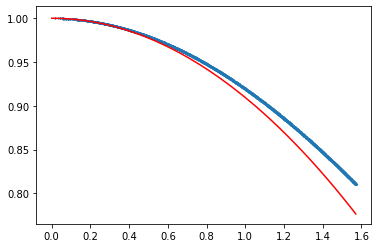

1.8836015077490993


In [83]:
plt.scatter(rs, real_ball_ratios, s = 1)

numerator = sum(np.array([(real_ball_ratios[i] - 1)*r**2 for i, r in enumerate(rs)]))
denom = sum(np.array([r**4 for r in rs]))
real_C = numerator/denom
xs = np.linspace(0, math.pi/2)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

print(-24*real_C)

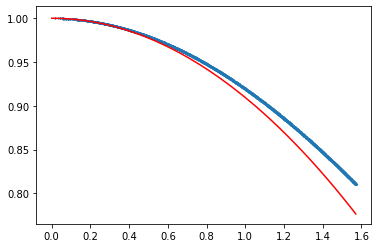

2.2111400035165367


In [84]:
# C refinement, with actual ball volumes
plt.scatter(rs, real_ball_ratios, s = 1)

rs_temp = np.append(rs, 0) # so that r[-1] = 0. need this for the rs[i] - rs[i-1] term below.
numerator = sum(np.array([(r**2)*(ball_ratios[i] - 1)*(r - rs_temp[i-1]) for i, r in enumerate(rs_temp[:-1])]))
denom = rs_temp[-2]**5/5
real_C = numerator/denom

xs = np.linspace(0, math.pi/2)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

print(-24*real_C)

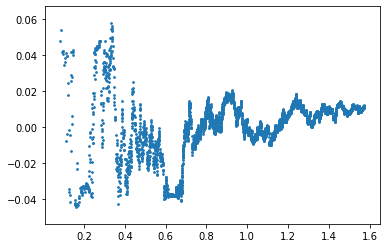

In [78]:
# difference between err in Rdist ball ratios and regular ball ratios
err_diff = [abs(real_ball_ratios[i] - ball_ratios_Rdist[i]) - abs(real_ball_ratios[i] - ball_ratios[i]) for i in range(len(rs))]
plt.scatter(rs[20:], err_diff[20:], s = 3)
plt.show()

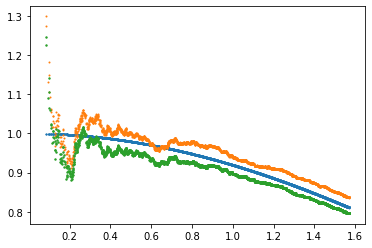

In [85]:
plt.scatter(rs[20:], real_ball_ratios[20:], s = 1)
plt.scatter(rs[20:], ball_ratios_Rdist[20:], s = 1)
plt.scatter(rs[20:], ball_ratios[20:], s = 2)
plt.show()

Euclidean test: Compare ball ratio estimates to analytic ball ratios. Recall: curvature results in euclidean space were better when Rdist was used in KDE (that test was done with biweight kernel). Looks like the Rdist-Gauss version also overestimates ball ratios, just like on sphere

In [86]:
X = np.load('X_euc_10000_R2.npy')
Rdist = np.load('Rdist_euc_10000_R2.npy')
kde = KDE(2, D = Rdist, kernel = KDE.gauss)
density_Rdist = kde.density()
np.save('density_euc_10000_R2_Rdist_gauss.npy', density_Rdist)

In [87]:
sce = scalar_curvature_est(X, 2, density = density_Rdist, Rdist = Rdist)

computed nearest neighbor distances


In [88]:
i = np.argmin([np.linalg.norm(X[j, :]) for j in range(10000)]) # point closet to the origin
rmax = math.pi/2
rs, ball_ratios_Rdist = sce.ball_ratios(i, rmax)

In [90]:
density = np.load('density_euc_10000_R2.npy')
sce = scalar_curvature_est(X, 2, density = density, Rdist = Rdist)

computed nearest neighbor distances


In [91]:
rmax = math.pi/2
rs, ball_ratios = sce.ball_ratios(i, rmax)

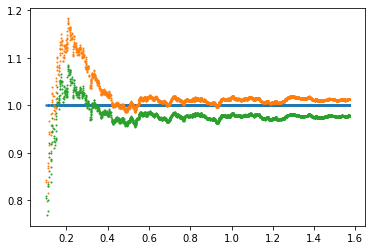

In [92]:
real_ball_ratios = [1 for i in range(len(rs))]
plt.scatter(rs[20:], real_ball_ratios[20:], s = 1)
plt.scatter(rs[20:], ball_ratios_Rdist[20:], s = 1)
plt.scatter(rs[20:], ball_ratios[20:], s = 1)
plt.show()

In [95]:
# curvature distribution (earlier, I only did biweight kernel with Rdist. now this is guassian kernel)
X = np.load('X_euc_10000_R2.npy')
Rdist = np.load('Rdist_euc_10000_R2.npy')
density_gauss = np.load('density_euc_10000_R2_Rdist_gauss.npy')
sce = scalar_curvature_est(X, 2, density = density_gauss, Rdist = Rdist)

computed nearest neighbor distances


In [96]:
rmax = 1.5
R = 2
small_indices = [i for i in range(N) if np.linalg.norm(X[i, :]) < R - rmax]

Cs = []
k = 0
for i in small_indices:
    if k%100 == 0:
        print(k)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
    k += 1
Ss = [-6*(n + 2)*C for C in Cs]

0
100
200
300
400
500
600


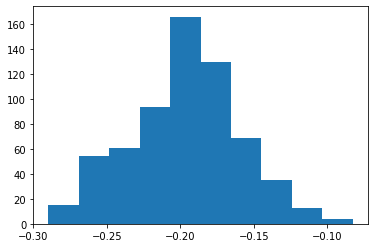

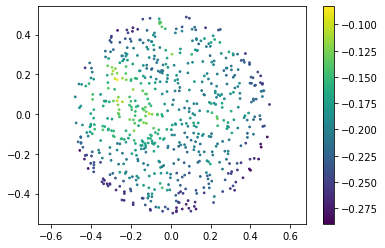

In [97]:
plt.hist(Ss)
plt.show()

X_small = np.array([X[i, :] for i in small_indices])
plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

In [98]:
rmax = 1.2
R = 2
small_indices = [i for i in range(N) if np.linalg.norm(X[i, :]) < R - rmax]

Cs = []
k = 0
for i in small_indices:
    if k%100 == 0:
        print(k)
    Cs.append(sce.fit_quad_coeff(i, 0, rmax))
    k += 1
Ss = [-6*(n + 2)*C for C in Cs]

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600


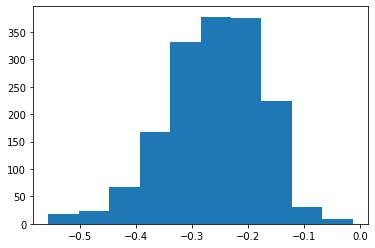

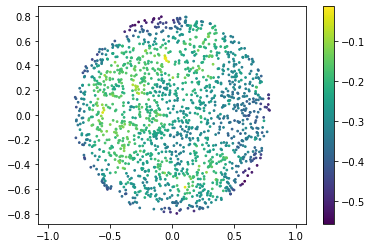

In [99]:
plt.hist(Ss)
plt.show()

X_small = np.array([X[i, :] for i in small_indices])
plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss)
plt.axis('equal')
plt.colorbar()
plt.show()

0.07957747154594767


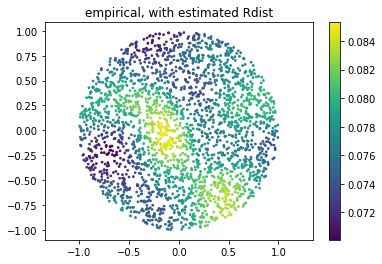

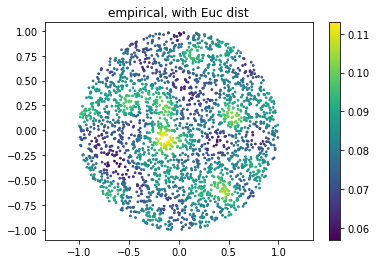

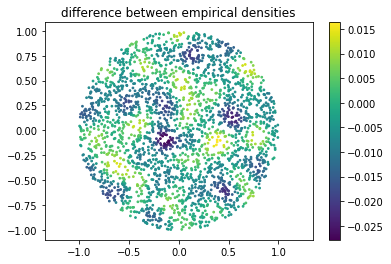

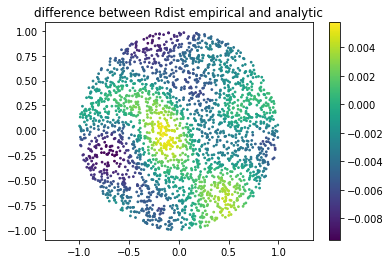

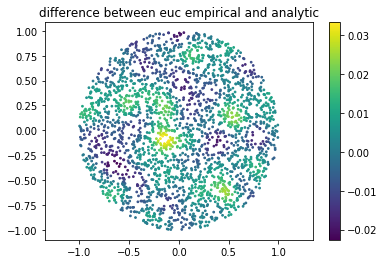

In [105]:
# compare density
real_density = 1/(4*math.pi)
print(real_density)
small_indices = [i for i in range(N) if np.linalg.norm(X[i, :]) < 1]
X_small = np.array([X[i, :] for i in small_indices])
density_small = [density[i] for i in small_indices]
density_gauss_small = [density_gauss[i] for i in small_indices]
compare_density(X_small, density_gauss_small, density_small, real_density)

Poincare test: Compare various choices for density estimation, and do curvature estimation with analytic ball volumes

In [93]:
X = np.load('X_poincare_10000.npy')
Rdist = np.load('Rdist_poincare_10000_exact.npy')
kde = KDE(2, D = Rdist, kernel = KDE.gauss)
density_Rdist = kde.density()
np.save('density_poincare_gauss.npy', density_Rdist)

0.29305950698470384


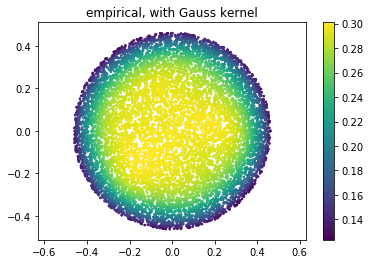

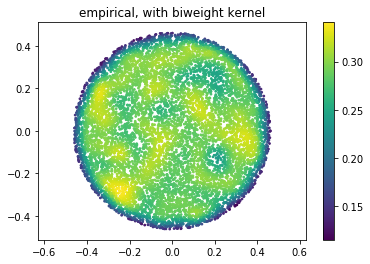

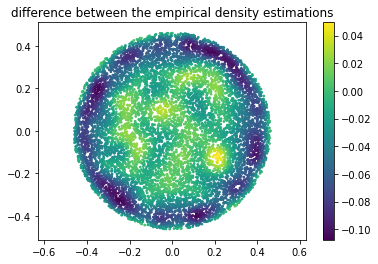

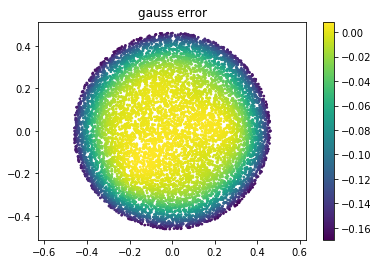

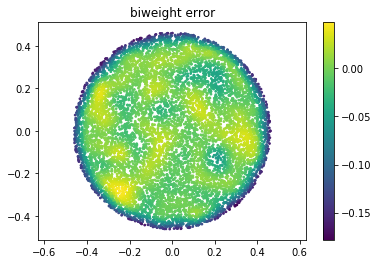

In [131]:
# compare empirical densities
density_gauss = np.load('density_poincare_10000_gauss.npy')
density_biweight = np.load('density_poincare_10000.npy')
real_density = 1/hyperbolic_disk_area(-1)
print(real_density)

plt.scatter(X[:, 0], X[:, 1], s = 3, c = density_gauss)
plt.axis('equal')
plt.colorbar()
plt.title("empirical, with Gauss kernel")
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = density_biweight)
plt.axis('equal')
plt.colorbar()
plt.title("empirical, with biweight kernel")
plt.show()

diff = [density_gauss[i] - density_biweight[i] for i in range(10000)]
plt.scatter(X[:, 0], X[:, 1], s = 3, c = diff)
plt.axis('equal')
plt.colorbar()
plt.title("difference between the empirical density estimations")
plt.show()

gauss_err = [density_gauss[i] - real_density for i in range(10000)]
plt.scatter(X[:, 0], X[:, 1], s = 3, c = gauss_err)
plt.axis('equal')
plt.colorbar()
plt.title("gauss error")
plt.show()

biweight_err = [density_biweight[i] - real_density for i in range(10000)]
plt.scatter(X[:, 0], X[:, 1], s = 3, c = biweight_err)
plt.axis('equal')
plt.colorbar()
plt.title("biweight error")
plt.show()

In [107]:
X = np.load('X_poincare_10000.npy')
Rdist = np.load('Rdist_poincare_10000_exact.npy')
density_Rdist = np.load('density_poincare_10000_gauss.npy')
sce = scalar_curvature_est(X, 2, density = density_Rdist, Rdist = Rdist)

computed nearest neighbor distances


In [108]:
density_biweight = np.load('density_poincare_10000.npy')
sce_biweight = scalar_curvature_est(X, 2, density = density_biweight, Rdist = Rdist)

computed nearest neighbor distances


In [110]:
i = np.argmin([np.linalg.norm(X[i, :]) for i in range(10000)]) # point closest to origin
rmax = 1
rs, ball_ratios_gauss = sce.ball_ratios(i, rmax)
rs, ball_ratios_biweight = sce_biweight.ball_ratios(i, rmax)

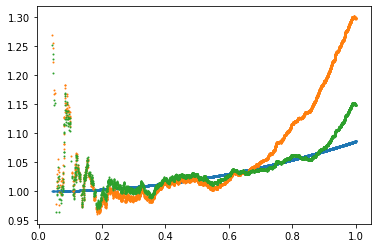

In [113]:
# I think the reason this is so inaccurate is because of boundary effects
# Update: Seems so. I reran this with a larger ball (radius 2) and error shrank dramatically
real_ball_ratios = [4*(math.sinh(r/2)**2)/r**2 for r in rs]
plt.scatter(rs[20:], real_ball_ratios[20:], s = 1)
plt.scatter(rs[20:], ball_ratios_gauss[20:], s = 1)
plt.scatter(rs[20:], ball_ratios_biweight[20:], s = 1)
plt.show()

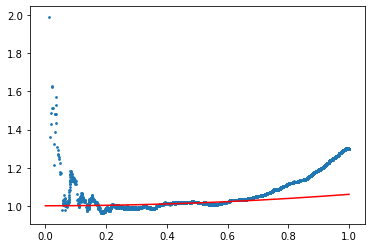

-1.440186705030825


In [117]:
C_gauss = sce.fit_quad_coeff(0, 0, rmax)
plt.scatter(rs, ball_ratios_gauss, s = 3)
xs = np.linspace(0, rmax, 200)
ys = [1 + C_gauss*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()
S = -24*C_gauss
print(S)

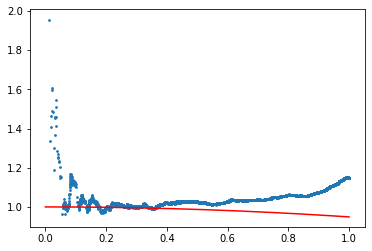

1.2243795541070241


In [119]:
C_biweight = sce_biweight.fit_quad_coeff(0, 0, rmax)
plt.scatter(rs, ball_ratios_biweight, s = 3)
xs = np.linspace(0, rmax, 200)
ys = [1 + C_biweight*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()
S = -24*C_biweight
print(S)

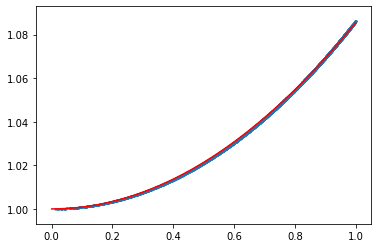

-2.050623244069774


In [121]:
plt.scatter(rs, real_ball_ratios, s = 1)
numerator = sum(np.array([(real_ball_ratios[i] - 1)*r**2 for i, r in enumerate(rs)]))
denom = sum(np.array([r**4 for r in rs]))
real_C = numerator/denom
xs = np.linspace(0, 1, 200)
ys = [1 + real_C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()

print(-24*real_C)

In [123]:
rmax = .9
org = np.array([0,0])
norms = [hyperbolic_Rdist(org, x, -1) for x in X]
small_indices = [i for i in range(N) if norms[i] < (1 - rmax)]
X_small = np.array([X[i, :] for i in small_indices])

# gauss curvature dist
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_indices]
Ss_gauss = [-6*(n + 2)*C for C in Cs]

# biweight curvature dist
Cs = [sce_biweight.fit_quad_coeff(i, 0, rmax) for i in small_indices]
Ss_biweight = [-6*(n + 2)*C for C in Cs]

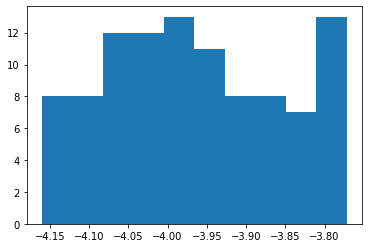

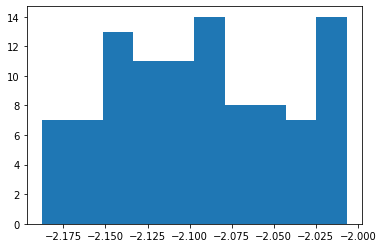

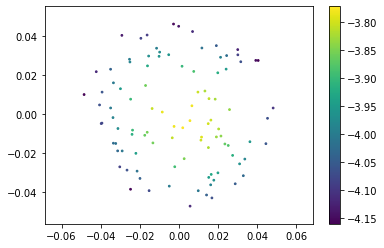

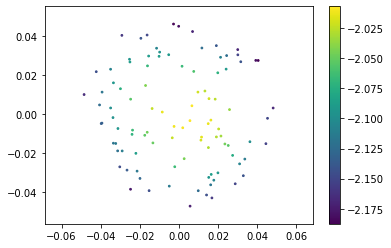

In [127]:
plt.hist(Ss_gauss)
plt.show()

plt.hist(Ss_biweight)
plt.show()

plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss_gauss)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss_biweight)
plt.axis('equal')
plt.colorbar()
plt.show()

In [132]:
rmax = .8
org = np.array([0,0])
norms = [hyperbolic_Rdist(org, x, -1) for x in X]
small_indices = [i for i in range(N) if norms[i] < (1 - rmax)]
X_small = np.array([X[i, :] for i in small_indices])

# gauss curvature dist
Cs = [sce.fit_quad_coeff(i, 0, rmax) for i in small_indices]
Ss_gauss = [-6*(n + 2)*C for C in Cs]

# biweight curvature dist
Cs = [sce_biweight.fit_quad_coeff(i, 0, rmax) for i in small_indices]
Ss_biweight = [-6*(n + 2)*C for C in Cs]

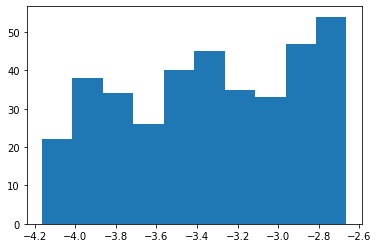

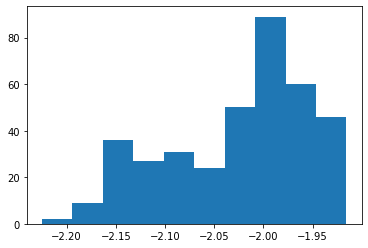

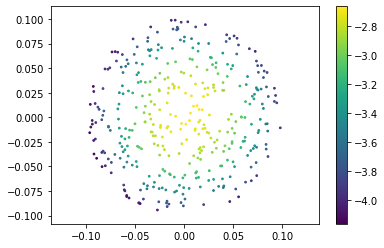

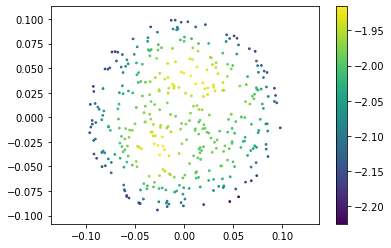

In [133]:
plt.hist(Ss_gauss)
plt.show()

plt.hist(Ss_biweight)
plt.show()

plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss_gauss)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss_biweight)
plt.axis('equal')
plt.colorbar()
plt.show()

Testing hyperbolic plane again, but this time with a larger ball to reduce boundary effects, which seem to be affecting gauss kernel the most

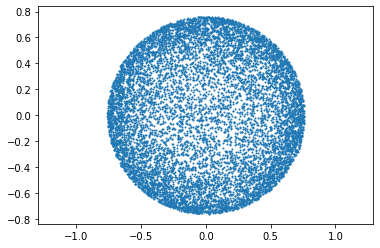

In [183]:
X = hyperbolic_disk(10000, Rh = 2)
plt.scatter(X[:, 0], X[:, 1], s = 1)
plt.axis('equal')
plt.show()
np.save("X_poincare_10000_Rh2.npy", X)

In [185]:
Rdist = hyperbolic_Rdist_array(X)
kde = KDE(2, D = Rdist, kernel = KDE.gauss)
density_gauss = kde.density()
np.save('density_poincare_10000_Rh2_gauss.npy', density_gauss)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063


3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704


5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344


6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980
6981
6982
6983


8424
8425
8426
8427
8428
8429
8430
8431
8432
8433
8434
8435
8436
8437
8438
8439
8440
8441
8442
8443
8444
8445
8446
8447
8448
8449
8450
8451
8452
8453
8454
8455
8456
8457
8458
8459
8460
8461
8462
8463
8464
8465
8466
8467
8468
8469
8470
8471
8472
8473
8474
8475
8476
8477
8478
8479
8480
8481
8482
8483
8484
8485
8486
8487
8488
8489
8490
8491
8492
8493
8494
8495
8496
8497
8498
8499
8500
8501
8502
8503
8504
8505
8506
8507
8508
8509
8510
8511
8512
8513
8514
8515
8516
8517
8518
8519
8520
8521
8522
8523
8524
8525
8526
8527
8528
8529
8530
8531
8532
8533
8534
8535
8536
8537
8538
8539
8540
8541
8542
8543
8544
8545
8546
8547
8548
8549
8550
8551
8552
8553
8554
8555
8556
8557
8558
8559
8560
8561
8562
8563
8564
8565
8566
8567
8568
8569
8570
8571
8572
8573
8574
8575
8576
8577
8578
8579
8580
8581
8582
8583
8584
8585
8586
8587
8588
8589
8590
8591
8592
8593
8594
8595
8596
8597
8598
8599
8600
8601
8602
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613
8614
8615
8616
8617
8618
8619
8620
8621
8622
8623


In [197]:
np.save('Rdist_poincare_10000_Rh2.npy', Rdist)

In [186]:
kde = KDE(2, D = Rdist, kernel = KDE.biweight)
density_biweight = kde.density()
np.save('density_poincare_10000_Rh2_biweight.npy', density_biweight)

In [187]:
sce_gauss = scalar_curvature_est(X, 2, density = density_gauss, Rdist = Rdist)
sce_biweight = scalar_curvature_est(X, 2, density = density_biweight, Rdist = Rdist)

computed nearest neighbor distances
computed nearest neighbor distances


In [190]:
i = np.argmin([np.linalg.norm(X[i, :]) for i in range(10000)]) # point closest to origin
rmax = 1
rs, ball_ratios_gauss = sce_gauss.ball_ratios(i, rmax)
rs, ball_ratios_biweight = sce_biweight.ball_ratios(i, rmax)

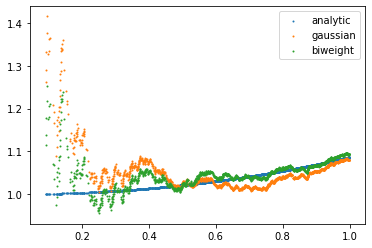

In [193]:
real_ball_ratios = [4*math.sinh(r/2)**2/r**2 for r in rs]
plt.scatter(rs[20:], real_ball_ratios[20:], s = 1, label = 'analytic')
plt.scatter(rs[20:], ball_ratios_gauss[20:], s = 1, label = 'gaussian')
plt.scatter(rs[20:], ball_ratios_biweight[20:], s = 1, label = 'biweight')
plt.legend()
plt.show()

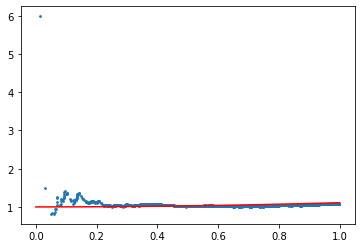

-2.6428712156196585


In [195]:
rmax = 1
C_gauss = sce_gauss.fit_quad_coeff(0, 0, rmax)
plt.scatter(rs, ball_ratios_gauss, s = 3)
xs = np.linspace(0, rmax, 200)
ys = [1 + C_gauss*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()
S = -24*C_gauss
print(S)

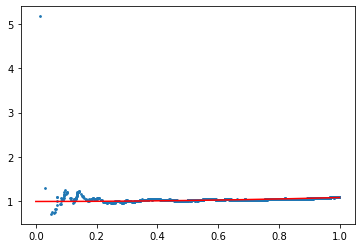

-2.1315330589100805


In [196]:
rmax = 1
C_biweight = sce_biweight.fit_quad_coeff(0, 0, rmax)
plt.scatter(rs, ball_ratios_biweight, s = 3)
xs = np.linspace(0, rmax, 200)
ys = [1 + C_biweight*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.show()
S = -24*C_biweight
print(S)

0.057618996223058196


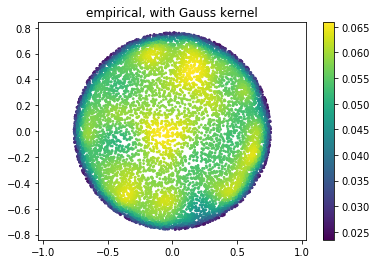

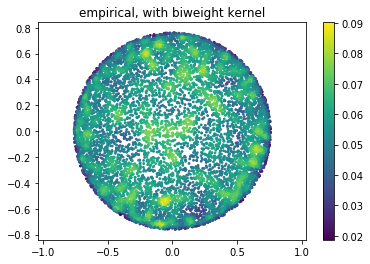

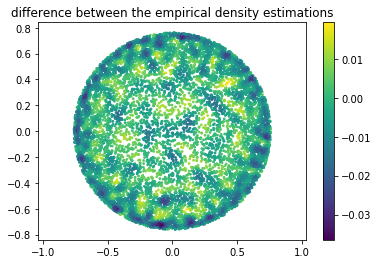

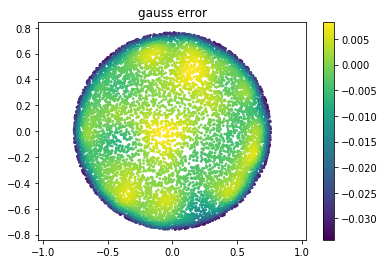

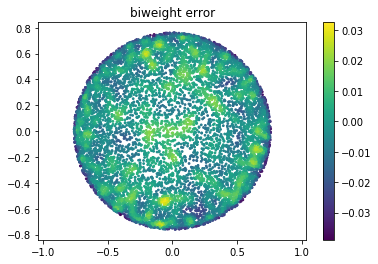

In [199]:
# compare empirical densities
Rh = 2
real_density = 1/hyperbolic_disk_area(Rh)
print(real_density)

plt.scatter(X[:, 0], X[:, 1], s = 3, c = density_gauss)
plt.axis('equal')
plt.colorbar()
plt.title("empirical, with Gauss kernel")
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = density_biweight)
plt.axis('equal')
plt.colorbar()
plt.title("empirical, with biweight kernel")
plt.show()

diff = [density_gauss[i] - density_biweight[i] for i in range(10000)]
plt.scatter(X[:, 0], X[:, 1], s = 3, c = diff)
plt.axis('equal')
plt.colorbar()
plt.title("difference between the empirical density estimations")
plt.show()

gauss_err = [density_gauss[i] - real_density for i in range(10000)]
plt.scatter(X[:, 0], X[:, 1], s = 3, c = gauss_err)
plt.axis('equal')
plt.colorbar()
plt.title("gauss error")
plt.show()

biweight_err = [density_biweight[i] - real_density for i in range(10000)]
plt.scatter(X[:, 0], X[:, 1], s = 3, c = biweight_err)
plt.axis('equal')
plt.colorbar()
plt.title("biweight error")
plt.show()

In [202]:
rmax = 1
Rh = 2
org = np.array([0,0])
norms = [hyperbolic_Rdist(org, x, -1) for x in X]
small_indices = [i for i in range(N) if norms[i] < (Rh - rmax)]
X_small = np.array([X[i, :] for i in small_indices])

# gauss curvature dist
Cs = [sce_gauss.fit_quad_coeff(i, 0, rmax) for i in small_indices]
Ss_gauss = [-6*(n + 2)*C for C in Cs]

# biweight curvature dist
Cs = [sce_biweight.fit_quad_coeff(i, 0, rmax) for i in small_indices]
Ss_biweight = [-6*(n + 2)*C for C in Cs]

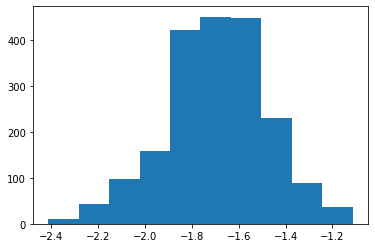

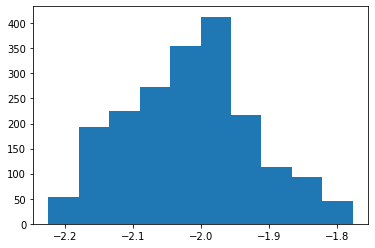

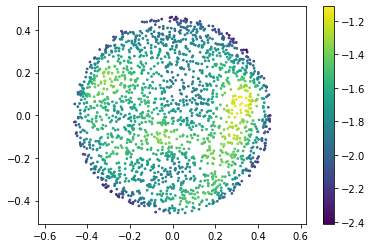

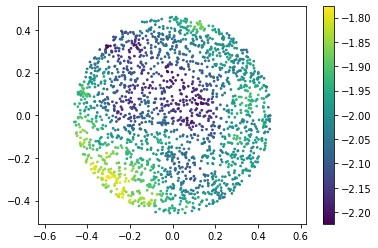

In [204]:
plt.hist(Ss_gauss)
plt.show()

plt.hist(Ss_biweight)
plt.show()

plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss_gauss)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss_biweight)
plt.axis('equal')
plt.colorbar()
plt.show()

Euclidean, with ALL pairwise comparisons

In [205]:
X = np.load('X_euc_10000_R2.npy')
Rdist = np.load('Rdist_euc_10000_R2.npy')
density_euc = np.load('density_euc_10000_R2.npy')
density_gauss = np.load('density_euc_10000_R2_Rdist_gauss.npy')
kde = KDE(2, D = Rdist, kernel = KDE.biweight)
density_biweight = kde.density()
np.save('density_euc_10000_R2_Rdist_biweight.npy', density_biweight)

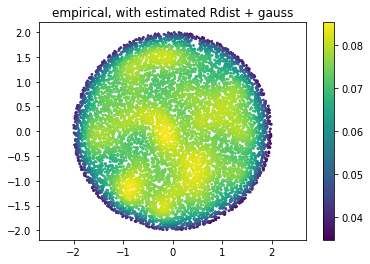

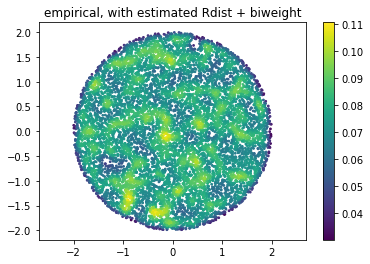

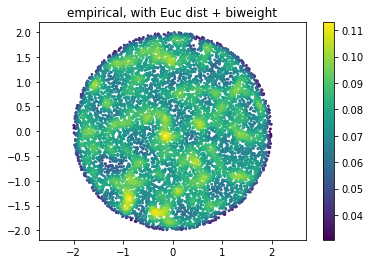

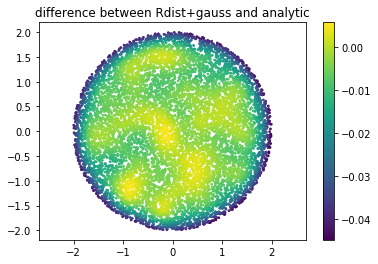

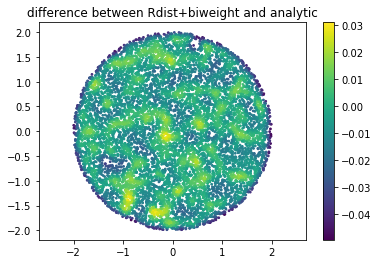

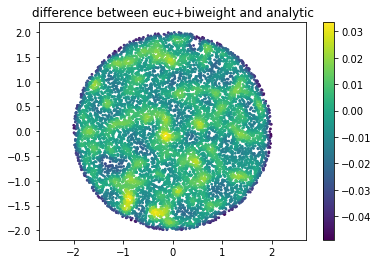

In [210]:
# density comparison
N = X.shape[0]
real_density = euc_density(2, 2)

plt.scatter(X[:, 0], X[:, 1], s = 3, c = density_gauss) # empirically computed density, using estimated Rdist
plt.axis('equal')
plt.colorbar()
plt.title("empirical, with estimated Rdist + gauss")
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = density_biweight) # empirically computed density, using estimated Rdist
plt.axis('equal')
plt.colorbar()
plt.title("empirical, with estimated Rdist + biweight")
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = density_euc) # empirically computed density, using euclidean distance
plt.axis('equal')
plt.title("empirical, with Euc dist + biweight")
plt.colorbar()
plt.show()

diff = [density_gauss[i] - real_density for i in range(N)]
plt.scatter(X[:, 0], X[:, 1], s = 3, c = diff) # difference
plt.axis('equal')
plt.title("difference between Rdist+gauss and analytic")
plt.colorbar()
plt.show()

diff = [density_biweight[i] - real_density for i in range(N)]
plt.scatter(X[:, 0], X[:, 1], s = 3, c = diff) # difference
plt.axis('equal')
plt.title("difference between Rdist+biweight and analytic")
plt.colorbar()
plt.show()

diff = [density_euc[i] - real_density for i in range(N)]
plt.scatter(X[:, 0], X[:, 1], s = 3, c = diff) # difference
plt.axis('equal')
plt.title("difference between euc+biweight and analytic")
plt.colorbar()
plt.show()

In [211]:
print(real_density)

0.07957747154594767


In [207]:
# Ball ratio comparison
sce_gauss = scalar_curvature_est(X, 2, density = density_gauss, Rdist = Rdist)
sce_biweight = scalar_curvature_est(X, 2, density = density_biweight, Rdist = Rdist)
sce_euc = scalar_curvature_est(X, 2, density = density_euc, Rdist = Rdist)

computed nearest neighbor distances
computed nearest neighbor distances
computed nearest neighbor distances


In [208]:
i = np.argmin([np.linalg.norm(X[i, :]) for i in range(10000)]) # point closest to origin
rmax = math.pi/2
rs, ball_ratios_euc = sce_euc.ball_ratios(i, rmax)
rs, ball_ratios_gauss = sce_gauss.ball_ratios(i, rmax)
rs, ball_ratios_biweight = sce_biweight.ball_ratios(i, rmax)

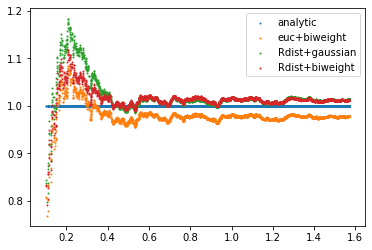

In [209]:
real_ball_ratios = [1 for r in rs]
plt.scatter(rs[20:], real_ball_ratios[20:], s = 1, label = 'analytic')
plt.scatter(rs[20:], ball_ratios_euc[20:], s = 1, label = 'euc+biweight')
plt.scatter(rs[20:], ball_ratios_gauss[20:], s = 1, label = 'Rdist+gaussian')
plt.scatter(rs[20:], ball_ratios_biweight[20:], s = 1, label = 'Rdist+biweight')
plt.legend()
plt.show()

In [212]:
# Compare curvature dists
rmax = math.pi/2
small_indices = [i for i in range(N) if np.linalg.norm(X[i, :]) < (2 - rmax)]
X_small = np.array([X[i, :] for i in small_indices])

# Rdist + gauss curvature dist
Cs = [sce_gauss.fit_quad_coeff(i, 0, rmax) for i in small_indices]
Ss_gauss = [-6*(n + 2)*C for C in Cs]

# Rdist + biweight curvature dist
Cs = [sce_biweight.fit_quad_coeff(i, 0, rmax) for i in small_indices]
Ss_biweight = [-6*(n + 2)*C for C in Cs]

# euc + biweight
Cs = [sce_euc.fit_quad_coeff(i, 0, rmax) for i in small_indices]
Ss_euc = [-6*(n + 2)*C for C in Cs]

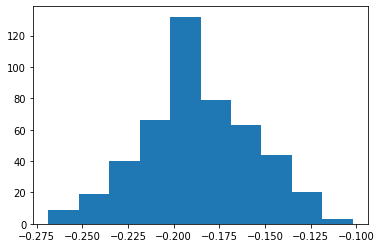

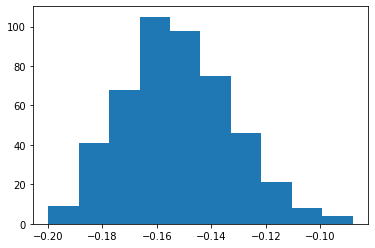

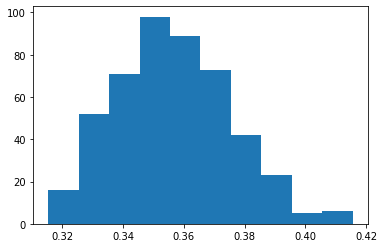

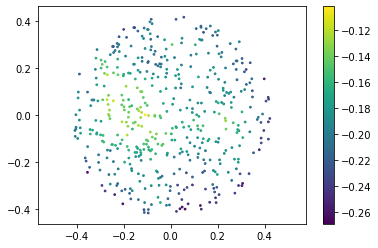

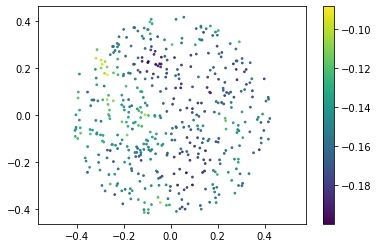

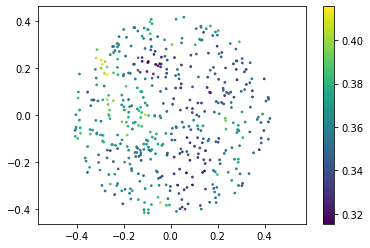

In [215]:
plt.hist(Ss_gauss)
plt.show()

plt.hist(Ss_biweight)
plt.show()

plt.hist(Ss_euc)
plt.show()

plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss_gauss)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss_biweight)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss_euc)
plt.axis('equal')
plt.colorbar()
plt.show()

Sphere, with ALL pairwise comparisons

In [216]:
X = np.load('X_sphere_10000.npy')
Rdist = np.load('Rdist_sphere_10000.npy')
density_euc = np.load('density_sphere_10000.npy')
density_gauss = np.load('density_sphere_10000_Rdist_gauss.npy')
density_biweight = np.load('density_sphere_10000_Rdist.npy')

0.07957747154594766


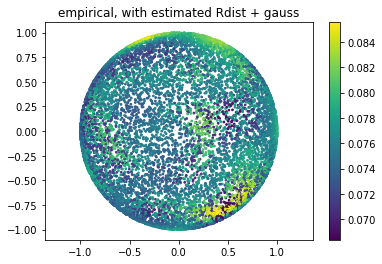

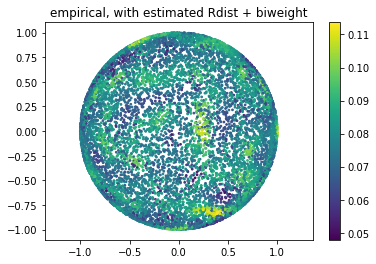

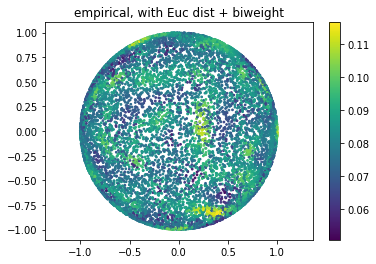

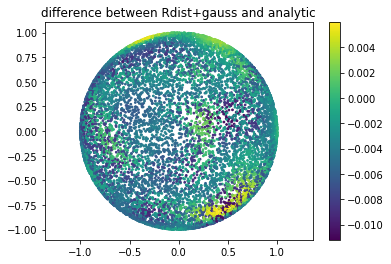

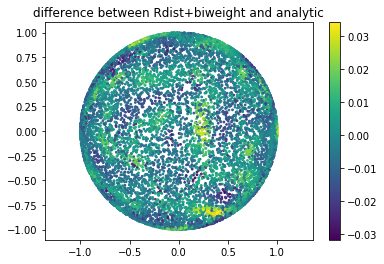

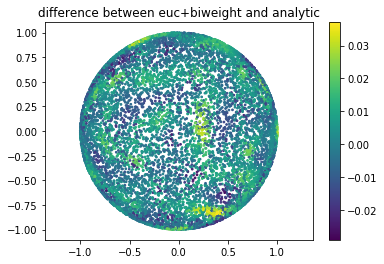

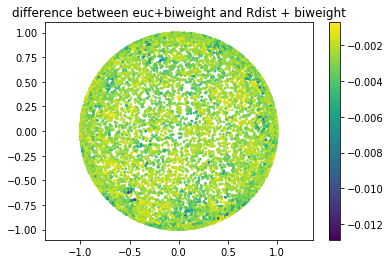

In [219]:
# density comparison
N = X.shape[0]
real_density = 1/sphere_volume(2)
print(real_density)

plt.scatter(X[:, 0], X[:, 1], s = 3, c = density_gauss) # empirically computed density, using estimated Rdist
plt.axis('equal')
plt.colorbar()
plt.title("empirical, with estimated Rdist + gauss")
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = density_biweight) # empirically computed density, using estimated Rdist
plt.axis('equal')
plt.colorbar()
plt.title("empirical, with estimated Rdist + biweight")
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = density_euc) # empirically computed density, using euclidean distance
plt.axis('equal')
plt.title("empirical, with Euc dist + biweight")
plt.colorbar()
plt.show()

diff = [density_gauss[i] - real_density for i in range(N)]
plt.scatter(X[:, 0], X[:, 1], s = 3, c = diff) # difference
plt.axis('equal')
plt.title("difference between Rdist+gauss and analytic")
plt.colorbar()
plt.show()

diff = [density_biweight[i] - real_density for i in range(N)]
plt.scatter(X[:, 0], X[:, 1], s = 3, c = diff) # difference
plt.axis('equal')
plt.title("difference between Rdist+biweight and analytic")
plt.colorbar()
plt.show()

diff = [density_euc[i] - real_density for i in range(N)]
plt.scatter(X[:, 0], X[:, 1], s = 3, c = diff) # difference
plt.axis('equal')
plt.title("difference between euc+biweight and analytic")
plt.colorbar()
plt.show()

diff = [density_biweight[i] - density_euc[i] for i in range(N)]
plt.scatter(X[:, 0], X[:, 1], s = 3, c = diff) # difference
plt.axis('equal')
plt.title("difference between euc+biweight and Rdist + biweight")
plt.colorbar()
plt.show()

In [221]:
# Ball ratio comparison
sce_gauss = scalar_curvature_est(X, 2, density = density_gauss, Rdist = Rdist)
sce_biweight = scalar_curvature_est(X, 2, density = density_biweight, Rdist = Rdist)
sce_euc = scalar_curvature_est(X, 2, density = density_euc, Rdist = Rdist)

rmax = math.pi/2
rs, ball_ratios_euc = sce_euc.ball_ratios(i, rmax)
rs, ball_ratios_gauss = sce_gauss.ball_ratios(i, rmax)
rs, ball_ratios_biweight = sce_biweight.ball_ratios(i, rmax)
real_ball_ratios = [S2_ball_volume(r)/(math.pi*r**2) for r in rs]

computed nearest neighbor distances
computed nearest neighbor distances
computed nearest neighbor distances


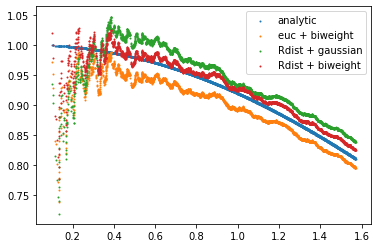

In [222]:
plt.scatter(rs[20:], real_ball_ratios[20:], s = 1, label = 'analytic')
plt.scatter(rs[20:], ball_ratios_euc[20:], s = 1, label = 'euc + biweight')
plt.scatter(rs[20:], ball_ratios_gauss[20:], s = 1, label = 'Rdist + gaussian')
plt.scatter(rs[20:], ball_ratios_biweight[20:], s = 1, label = 'Rdist + biweight')
plt.legend()
plt.show()

In [223]:
# Compare curvature dists
rmax = math.pi/2

# Rdist + gauss curvature dist
Cs = [sce_gauss.fit_quad_coeff(i, 0, rmax) for i in range(10000)]
Ss_gauss = [-6*(n + 2)*C for C in Cs]

# Rdist + biweight curvature dist
Cs = [sce_biweight.fit_quad_coeff(i, 0, rmax) for i in range(10000)]
Ss_biweight = [-6*(n + 2)*C for C in Cs]

# euc + biweight
Cs = [sce_euc.fit_quad_coeff(i, 0, rmax) for i in range(10000)]
Ss_euc = [-6*(n + 2)*C for C in Cs]

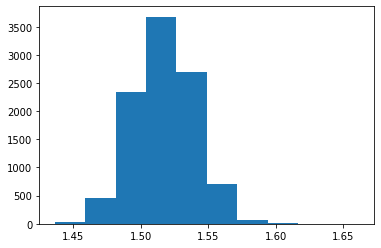

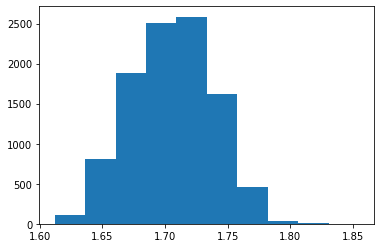

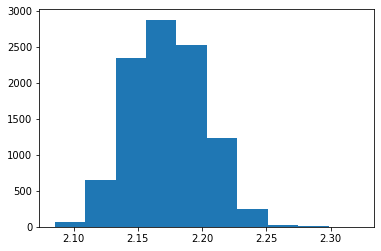

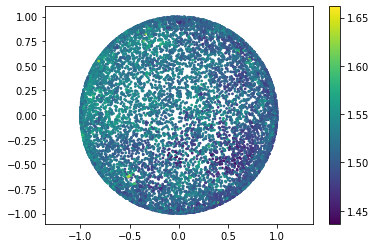

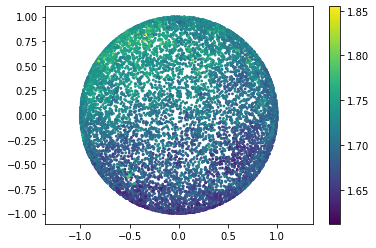

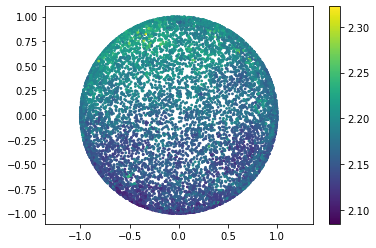

In [224]:
plt.hist(Ss_gauss)
plt.show()

plt.hist(Ss_biweight)
plt.show()

plt.hist(Ss_euc)
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_gauss)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_biweight)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_euc)
plt.axis('equal')
plt.colorbar()
plt.show()

In [225]:
# Increase rmin
rmax = math.pi/2
rmin = .4

# Rdist + gauss curvature dist
Cs = [sce_gauss.fit_quad_coeff(i, rmin, rmax) for i in range(10000)]
Ss_gauss = [-6*(n + 2)*C for C in Cs]

# Rdist + biweight curvature dist
Cs = [sce_biweight.fit_quad_coeff(i, rmin, rmax) for i in range(10000)]
Ss_biweight = [-6*(n + 2)*C for C in Cs]

# euc + biweight
Cs = [sce_euc.fit_quad_coeff(i, rmin, rmax) for i in range(10000)]
Ss_euc = [-6*(n + 2)*C for C in Cs]

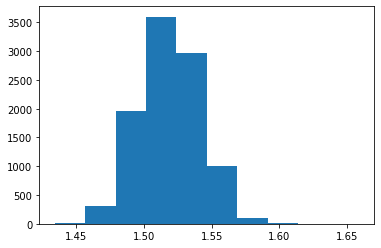

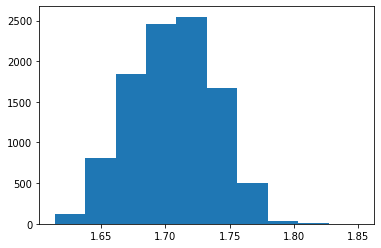

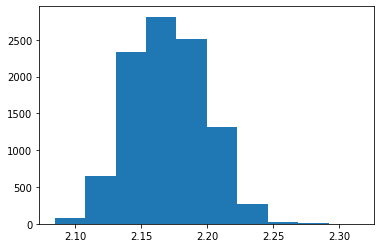

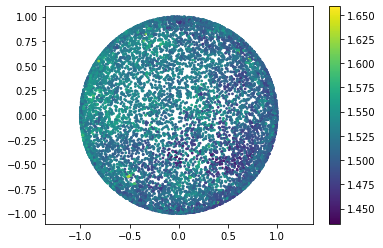

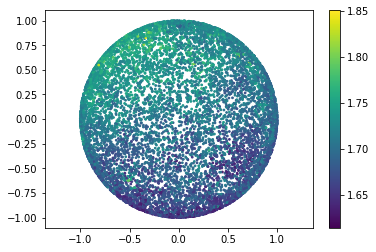

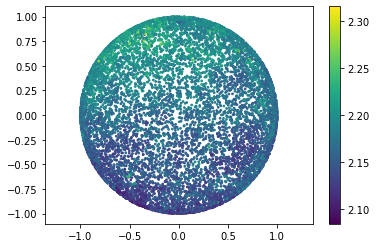

In [226]:
plt.hist(Ss_gauss)
plt.show()

plt.hist(Ss_biweight)
plt.show()

plt.hist(Ss_euc)
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_gauss)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_biweight)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_euc)
plt.axis('equal')
plt.colorbar()
plt.show()

In [227]:
# use C refinement
rmax = math.pi/2
rmin = 0

# Rdist + gauss curvature dist
Cs = [sce_gauss.fit_quad_coeff(i, rmin, rmax, l2norm = False) for i in range(10000)]
Ss_gauss = [-6*(n + 2)*C for C in Cs]

# Rdist + biweight curvature dist
Cs = [sce_biweight.fit_quad_coeff(i, rmin, rmax, l2norm = False) for i in range(10000)]
Ss_biweight = [-6*(n + 2)*C for C in Cs]

# euc + biweight
Cs = [sce_euc.fit_quad_coeff(i, rmin, rmax, l2norm = False) for i in range(10000)]
Ss_euc = [-6*(n + 2)*C for C in Cs]

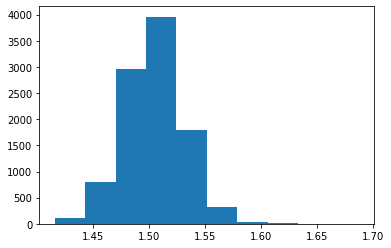

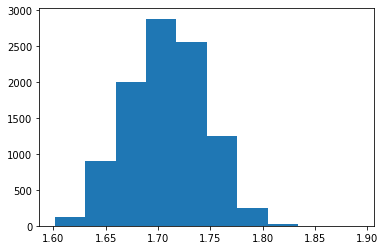

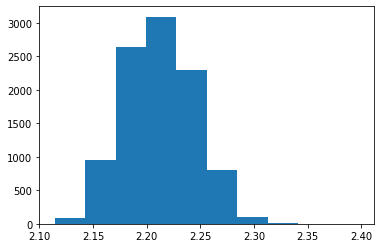

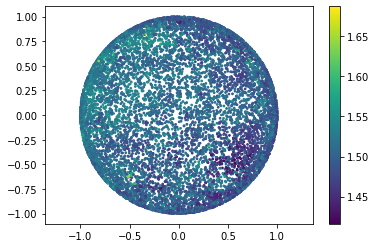

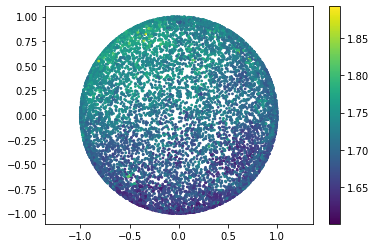

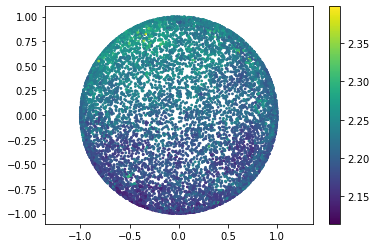

In [228]:
plt.hist(Ss_gauss)
plt.show()

plt.hist(Ss_biweight)
plt.show()

plt.hist(Ss_euc)
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_gauss)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_biweight)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_euc)
plt.axis('equal')
plt.colorbar()
plt.show()

In [229]:
# use C refinement with rmin = .4
rmax = math.pi/2
rmin = .4

# Rdist + gauss curvature dist
Cs = [sce_gauss.fit_quad_coeff(i, rmin, rmax, l2norm = False) for i in range(10000)]
Ss_gauss = [-6*(n + 2)*C for C in Cs]

# Rdist + biweight curvature dist
Cs = [sce_biweight.fit_quad_coeff(i, rmin, rmax, l2norm = False) for i in range(10000)]
Ss_biweight = [-6*(n + 2)*C for C in Cs]

# euc + biweight
Cs = [sce_euc.fit_quad_coeff(i, rmin, rmax, l2norm = False) for i in range(10000)]
Ss_euc = [-6*(n + 2)*C for C in Cs]

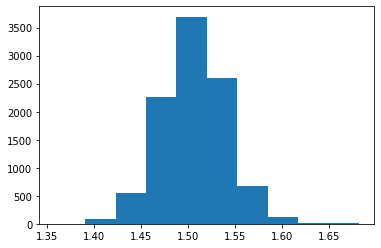

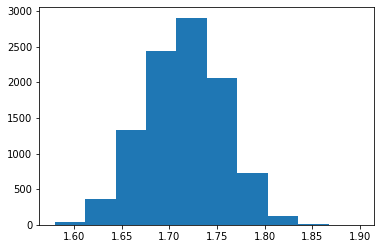

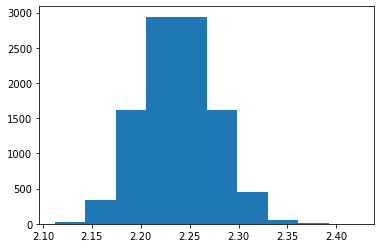

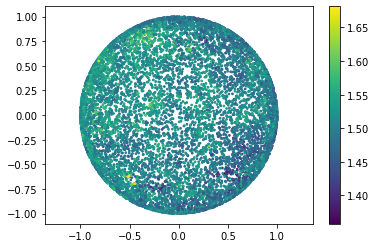

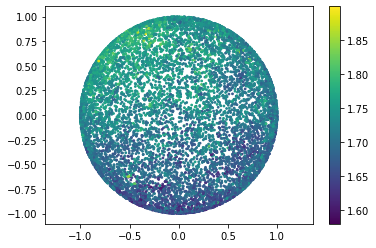

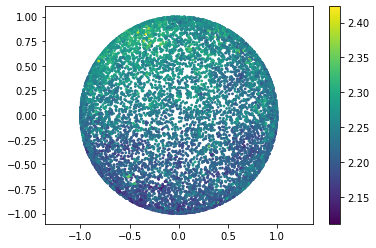

In [230]:
plt.hist(Ss_gauss)
plt.show()

plt.hist(Ss_biweight)
plt.show()

plt.hist(Ss_euc)
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_gauss)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_biweight)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_euc)
plt.axis('equal')
plt.colorbar()
plt.show()

For ball ratios, try comparing to empirically estimated Euclidean ball volume instead of analytic Euclidean ball volume. Might help because of biases across manifolds. For example, when you use Rdist in the kernel, ball volume tends to get overestimated

First test: Sphere

In [276]:
# load euc data
X_euc = np.load('X_euc_10000_R2.npy')
Rdist_euc = np.load('Rdist_euc_10000_R2.npy')
density_gauss_euc = np.load('density_euc_10000_R2_Rdist_gauss.npy')
density_biweight_euc = np.load('density_euc_10000_R2_Rdist_biweight.npy')
density_euc_euc = np.load('density_euc_10000_R2.npy')

sce_gauss_euc = scalar_curvature_est(X_euc, 2, density = density_gauss_euc, Rdist = Rdist_euc)
sce_biweight_euc = scalar_curvature_est(X_euc, 2, density = density_biweight_euc, Rdist = Rdist_euc)
sce_euc_euc = scalar_curvature_est(X_euc, 2, density = density_euc_euc, Rdist = Rdist_euc)

computed nearest neighbor distances
computed nearest neighbor distances
computed nearest neighbor distances


In [277]:
# load sphere data
X_sph = np.load('X_sphere_10000.npy')
Rdist_sph = np.load('Rdist_sphere_10000.npy')
density_euc_sph = np.load('density_sphere_10000.npy')
density_gauss_sph = np.load('density_sphere_10000_Rdist_gauss.npy')
density_biweight_sph = np.load('density_sphere_10000_Rdist.npy')

sce_gauss_sph = scalar_curvature_est(X_sph, 2, density = density_gauss_sph, Rdist = Rdist_sph)
sce_biweight_sph = scalar_curvature_est(X_sph, 2, density = density_biweight_sph, Rdist = Rdist_sph)
sce_euc_sph = scalar_curvature_est(X_sph, 2, density = density_euc_sph, Rdist = Rdist_sph)

computed nearest neighbor distances
computed nearest neighbor distances
computed nearest neighbor distances


In [278]:
rmax = math.pi/2
rs, ball_volumes_gauss_sph = sce_gauss_sph.ball_volumes(0, rmax)
rs, ball_volumes_biweight_sph = sce_biweight_sph.ball_volumes(0, rmax)
rs, ball_volumes_euc_sph = sce_euc_sph.ball_volumes(0, rmax)

i = np.argmin([np.linalg.norm(x) for x in X_euc])
rs, ball_volumes_gauss_euc = sce_gauss_euc.ball_volumes(i, rs = rs)
rs, ball_volumes_biweight_euc = sce_biweight_euc.ball_volumes(i, rs = rs)
rs, ball_volumes_euc_euc = sce_euc_euc.ball_volumes(i, rs = rs)

In [279]:
ball_ratios_gauss_sph = [ball_volumes_gauss_sph[i]/ball_volumes_gauss_euc[i] for i in range(len(rs))]
ball_ratios_biweight_sph = [ball_volumes_biweight_sph[i]/ball_volumes_biweight_euc[i] for i in range(len(rs))]
ball_ratios_euc_sph = [ball_volumes_euc_sph[i]/ball_volumes_euc_euc[i] for i in range(len(rs))]

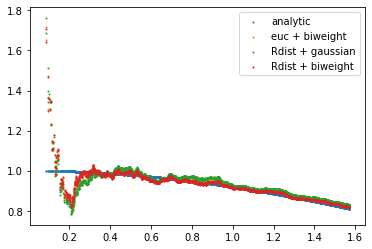

In [280]:
real_ball_ratios = [S2_ball_volume(r)/(math.pi*r**2) for r in rs]
plt.scatter(rs[20:], real_ball_ratios[20:], s = 1, label = 'analytic')
plt.scatter(rs[20:], ball_ratios_euc_sph[20:], s = 1, label = 'euc + biweight')
plt.scatter(rs[20:], ball_ratios_gauss_sph[20:], s = 1, label = 'Rdist + gaussian')
plt.scatter(rs[20:], ball_ratios_biweight_sph[20:], s = 1, label = 'Rdist + biweight')
plt.legend()
plt.show()

In [294]:
def calc_C(rs, ball_ratios):
    numerator = sum(np.array([(ball_ratios[i] - 1)*r**2 for i, r in enumerate(rs)]))
    denom = sum(np.array([r**4 for r in rs]))
    C = numerator/denom
    return C

def empirical_ball_ratios(i, sce, rs, ball_volumes_euc):
    _, ball_volumes = sce.ball_volumes(i, rs = rs)
    ball_ratios = [ball_volumes[j]/ball_volumes_euc[j] for j in range(len(rs))]
    return ball_ratios
    
def calc_S(i, sce, rs, ball_volumes_euc, n = 2):
    ball_ratios = empirical_ball_ratios(i, sce, rs, ball_volumes_euc)
    C = calc_C(rs, ball_ratios)
    S = -6*(n+2)*C
    return S

In [286]:
C_euc = calc_C(rs, ball_ratios_euc_sph)
C_gauss = calc_C(rs, ball_ratios_gauss_sph)
C_biweight = calc_C(rs, ball_ratios_biweight_sph)
print(-24*C_euc)
print(-24*C_gauss)
print(-24*C_biweight)

1.828340360699948
1.6472837770842612
1.8332202547289833


In [295]:
Ss_gauss = []
Ss_biweight = []
Ss_euc = []
for i in range(10000):
    if i%100 == 0: print(i)
    Ss_gauss.append(calc_S(i, sce_gauss_sph, rs, ball_volumes_gauss_euc))
    Ss_biweight.append(calc_S(i, sce_biweight_sph, rs, ball_volumes_biweight_euc))
    Ss_euc.append(calc_S(i, sce_euc_sph, rs, ball_volumes_euc_euc))

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


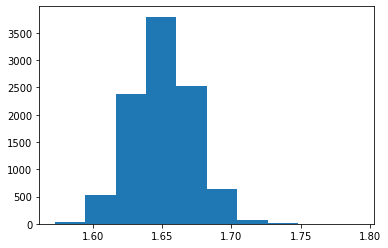

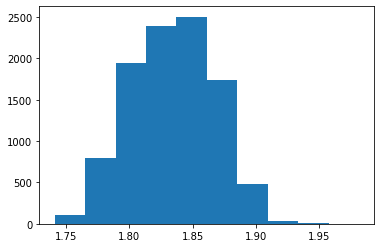

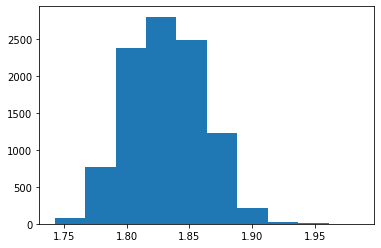

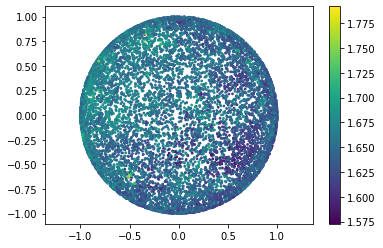

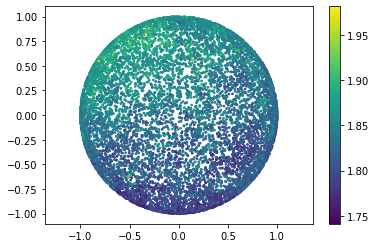

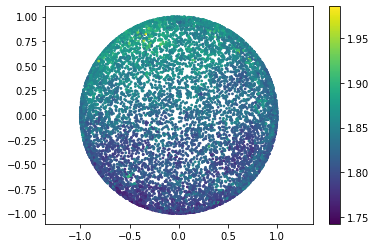

In [296]:
plt.hist(Ss_gauss)
plt.show()

plt.hist(Ss_biweight)
plt.show()

plt.hist(Ss_euc)
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_gauss)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_biweight)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_euc)
plt.axis('equal')
plt.colorbar()
plt.show()

Same thing, but try decreasing rmax to 1. Results are generally worse.

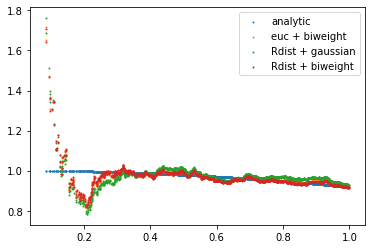

In [297]:
rmax = 1
rs, ball_volumes_gauss_sph = sce_gauss_sph.ball_volumes(0, rmax)
rs, ball_volumes_biweight_sph = sce_biweight_sph.ball_volumes(0, rmax)
rs, ball_volumes_euc_sph = sce_euc_sph.ball_volumes(0, rmax)

i = np.argmin([np.linalg.norm(x) for x in X_euc])
rs, ball_volumes_gauss_euc = sce_gauss_euc.ball_volumes(i, rs = rs)
rs, ball_volumes_biweight_euc = sce_biweight_euc.ball_volumes(i, rs = rs)
rs, ball_volumes_euc_euc = sce_euc_euc.ball_volumes(i, rs = rs)

ball_ratios_gauss_sph = [ball_volumes_gauss_sph[i]/ball_volumes_gauss_euc[i] for i in range(len(rs))]
ball_ratios_biweight_sph = [ball_volumes_biweight_sph[i]/ball_volumes_biweight_euc[i] for i in range(len(rs))]
ball_ratios_euc_sph = [ball_volumes_euc_sph[i]/ball_volumes_euc_euc[i] for i in range(len(rs))]

real_ball_ratios = [S2_ball_volume(r)/(math.pi*r**2) for r in rs]
plt.scatter(rs[20:], real_ball_ratios[20:], s = 1, label = 'analytic')
plt.scatter(rs[20:], ball_ratios_euc_sph[20:], s = 1, label = 'euc + biweight')
plt.scatter(rs[20:], ball_ratios_gauss_sph[20:], s = 1, label = 'Rdist + gaussian')
plt.scatter(rs[20:], ball_ratios_biweight_sph[20:], s = 1, label = 'Rdist + biweight')
plt.legend()
plt.show()

In [298]:
Ss_gauss = []
Ss_biweight = []
Ss_euc = []
for i in range(10000):
    if i%100 == 0: print(i)
    Ss_gauss.append(calc_S(i, sce_gauss_sph, rs, ball_volumes_gauss_euc))
    Ss_biweight.append(calc_S(i, sce_biweight_sph, rs, ball_volumes_biweight_euc))
    Ss_euc.append(calc_S(i, sce_euc_sph, rs, ball_volumes_euc_euc))

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


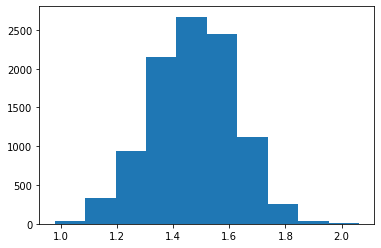

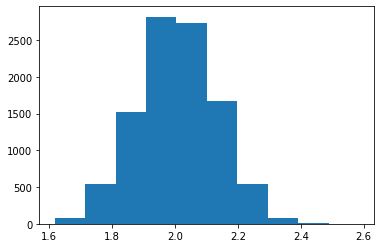

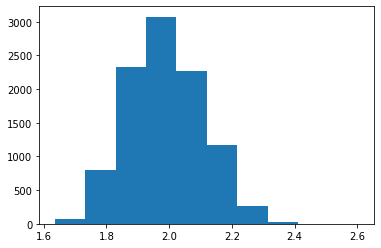

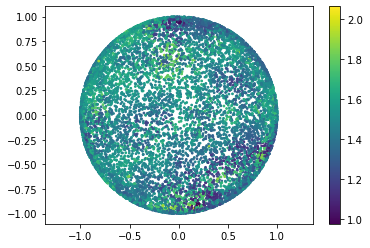

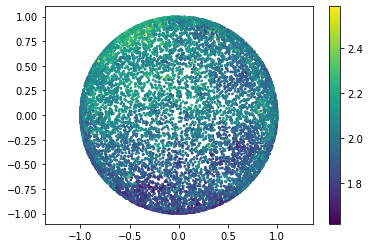

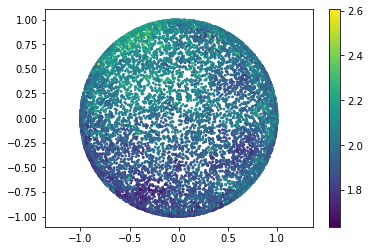

In [299]:
plt.hist(Ss_gauss)
plt.show()

plt.hist(Ss_biweight)
plt.show()

plt.hist(Ss_euc)
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_gauss)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_biweight)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_euc)
plt.axis('equal')
plt.colorbar()
plt.show()

Comparing estimated ball volume to empirical Euclidean ball volume instead of analytic Euclidean ball volume

Test 2: poincare disk

Results: not very good

In [301]:
# load poincare disk data
X_h = np.load('X_poincare_10000_Rh2.npy')
Rdist_h = np.load('Rdist_poincare_10000_Rh2.npy')
density_gauss_h = np.load('density_poincare_10000_Rh2_gauss.npy')
density_biweight_h = np.load('density_poincare_10000_Rh2_biweight.npy')

sce_gauss_h = scalar_curvature_est(X_h, 2, density = density_gauss_h, Rdist = Rdist_h)
sce_biweight_h = scalar_curvature_est(X_h, 2, density = density_biweight_h, Rdist = Rdist_h)

computed nearest neighbor distances
computed nearest neighbor distances


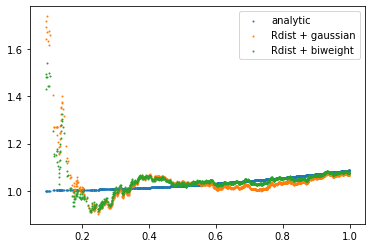

In [303]:
# look at ball ratios for balls centered at origin of poincare disk
rmax = 1
j = np.argmin([np.linalg.norm(x) for x in X_h])
rs, ball_volumes_gauss_h = sce_gauss_h.ball_volumes(j, rmax)
rs, ball_volumes_biweight_h = sce_biweight_h.ball_volumes(j, rmax)

i = np.argmin([np.linalg.norm(x) for x in X_euc])
rs, ball_volumes_gauss_euc = sce_gauss_euc.ball_volumes(i, rs = rs)
rs, ball_volumes_biweight_euc = sce_biweight_euc.ball_volumes(i, rs = rs)

ball_ratios_gauss_h = [ball_volumes_gauss_h[k]/ball_volumes_gauss_euc[k] for k in range(len(rs))]
ball_ratios_biweight_h = [ball_volumes_biweight_h[k]/ball_volumes_biweight_euc[k] for k in range(len(rs))]

real_ball_ratios = [hyperbolic_disk_area(r)/(math.pi*r**2) for r in rs]
plt.scatter(rs[20:], real_ball_ratios[20:], s = 1, label = 'analytic')
plt.scatter(rs[20:], ball_ratios_gauss_h[20:], s = 1, label = 'Rdist + gaussian')
plt.scatter(rs[20:], ball_ratios_biweight_h[20:], s = 1, label = 'Rdist + biweight')
plt.legend()
plt.show()

In [308]:
org = np.array([0,0])
norms = [hyperbolic_Rdist(org, x, -1) for x in X_h]
small_indices = [i for i in range(N) if norms[i] < (2 - rmax)]
X_small = np.array([X[i, :] for i in small_indices])

In [309]:
Ss_gauss = []
Ss_biweight = []
m = 0
for k in small_indices:
    if m%100 == 0: print(m)
    Ss_gauss.append(calc_S(k, sce_gauss_h, rs, ball_volumes_gauss_euc))
    Ss_biweight.append(calc_S(k, sce_biweight_h, rs, ball_volumes_biweight_euc))
    m += 1

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900


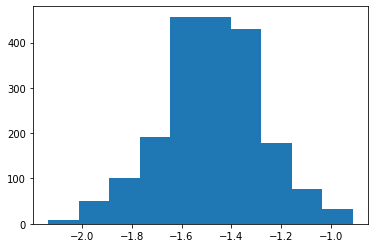

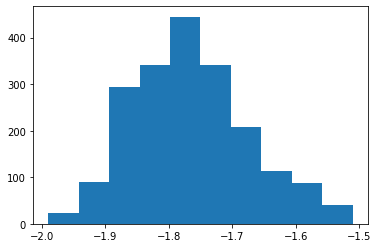

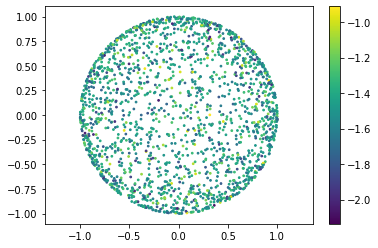

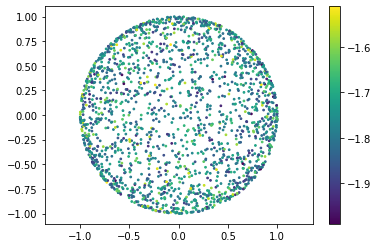

In [311]:
plt.hist(Ss_gauss)
plt.show()

plt.hist(Ss_biweight)
plt.show()

plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss_gauss)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss_biweight)
plt.axis('equal')
plt.colorbar()
plt.show()

Test: constant \Delta r (i.e., evenly spaced r_i's in the sequence)

In [333]:
def calc_rs(rmax, rmin, N):
    m = math.ceil((rmax - rmin)/((rmax**3 - rmin**3)/N))
    step = (rmax - rmin)/m
    rs = [rmin + step*(i+1) for i in range(m)] # rs[i] = r_{i+1}, where r_i = i*step
    return rs

First test: sphere. Use analytic Euclidean ball volume

In [323]:
# load sphere data
X_sph = np.load('X_sphere_10000.npy')
Rdist_sph = np.load('Rdist_sphere_10000.npy')
density_euc_sph = np.load('density_sphere_10000.npy')
density_gauss_sph = np.load('density_sphere_10000_Rdist_gauss.npy')
density_biweight_sph = np.load('density_sphere_10000_Rdist.npy')

sce_gauss_sph = scalar_curvature_est(X_sph, 2, density = density_gauss_sph, Rdist = Rdist_sph)
sce_biweight_sph = scalar_curvature_est(X_sph, 2, density = density_biweight_sph, Rdist = Rdist_sph)
sce_euc_sph = scalar_curvature_est(X_sph, 2, density = density_euc_sph, Rdist = Rdist_sph)

computed nearest neighbor distances
computed nearest neighbor distances
computed nearest neighbor distances


In [327]:
rmax = math.pi/2
rmin = .4
rs = rs(rmax, rmin, 10000)
print(len(rs))

3072


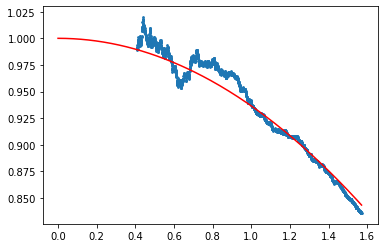

In [328]:
# testing fit_quad_coeff when rs is given
_, ball_ratios = sce_gauss_sph.ball_ratios(0, rs = rs)
C = sce_gauss_sph.fit_quad_coeff(0, rs = rs, version = 2)
xs = np.linspace(0, rmax, 200)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.scatter(rs[20:], ball_ratios[20:], s = 3)

In [329]:
Cs_gauss_sph = []
Cs_biweight_sph = []
Cs_euc_sph = []
for i in range(10000):
    if i%100 == 0: print(i)
    Cs_gauss_sph.append(sce_gauss_sph.fit_quad_coeff(i, rs = rs, version = 2))
    Cs_biweight_sph.append(sce_biweight_sph.fit_quad_coeff(i, rs = rs, version = 2))
    Cs_euc_sph.append(sce_euc_sph.fit_quad_coeff(i, rs = rs, version = 2))
Ss_gauss_sph = [-24*C for C in Cs_gauss_sph]
Ss_biweight_sph = [-24*C for C in Cs_biweight_sph]
Ss_euc_sph = [-24*C for C in Cs_euc_sph]

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


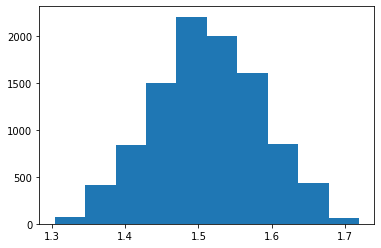

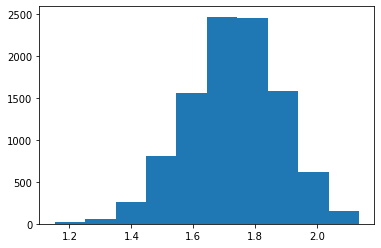

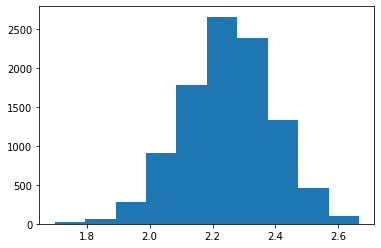

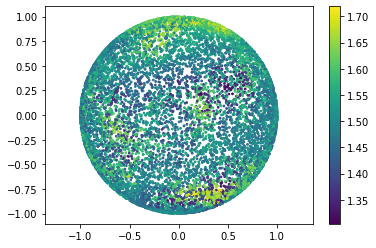

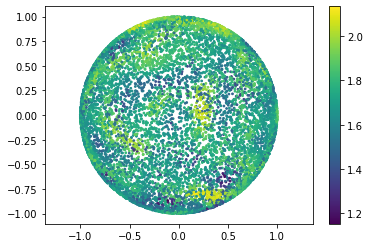

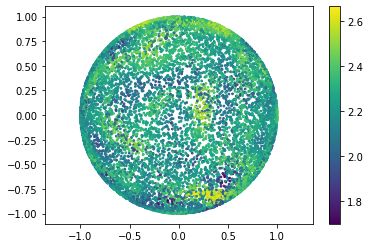

In [330]:
plt.hist(Ss_gauss_sph)
plt.show()

plt.hist(Ss_biweight_sph)
plt.show()

plt.hist(Ss_euc_sph)
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_gauss_sph)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_biweight_sph)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X[:, 0], X[:, 1], s = 3, c = Ss_euc_sph)
plt.axis('equal')
plt.colorbar()
plt.show()

In [331]:
# load hyperbolic data
X_h = np.load('X_poincare_10000_Rh2.npy')
Rdist_h = np.load('Rdist_poincare_10000_Rh2.npy')
density_gauss_h = np.load('density_poincare_10000_Rh2_gauss.npy')
density_biweight_h = np.load('density_poincare_10000_Rh2_biweight.npy')

sce_gauss_h = scalar_curvature_est(X_h, 2, density = density_gauss_h, Rdist = Rdist_h)
sce_biweight_h = scalar_curvature_est(X_h, 2, density = density_biweight_h, Rdist = Rdist_h)

computed nearest neighbor distances
computed nearest neighbor distances


In [334]:
rmax = 1
rmin = .4
rs = calc_rs(rmax, rmin, 10000)

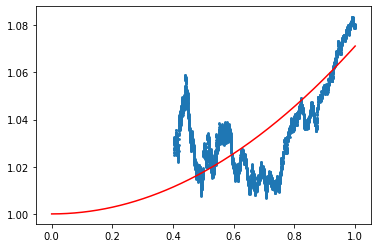

In [336]:
# testing fit_quad_coeff when rs is given
j = np.argmin([np.linalg.norm(x) for x in X_h])
_, ball_ratios = sce_gauss_h.ball_ratios(j, rs = rs)
C = sce_gauss_h.fit_quad_coeff(j, rs = rs, version = 2)
xs = np.linspace(0, rmax, 200)
ys = [1 + C*x**2 for x in xs]
plt.plot(xs, ys, color = 'r')
plt.scatter(rs[20:], ball_ratios[20:], s = 3)

In [337]:
Cs_gauss_h = []
Cs_biweight_h = []
m = 0
for k in small_indices:
    if m%100 == 0: print(m)
    Cs_gauss_h.append(sce_gauss_h.fit_quad_coeff(k, rs = rs, version = 2))
    Cs_biweight_h.append(sce_biweight_h.fit_quad_coeff(k, rs = rs, version = 2))
    m += 1
Ss_gauss_h = [-24*C for C in Cs_gauss_h]
Ss_biweight_h = [-24*C for C in Cs_biweight_h]

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900


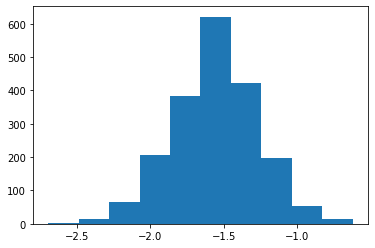

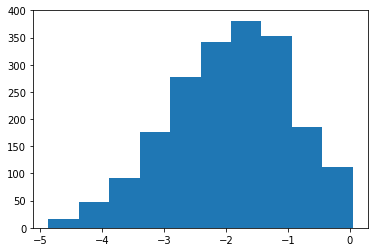

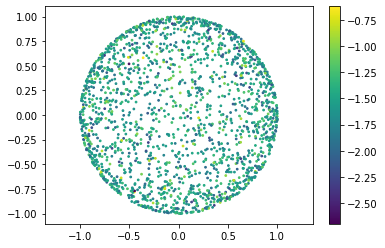

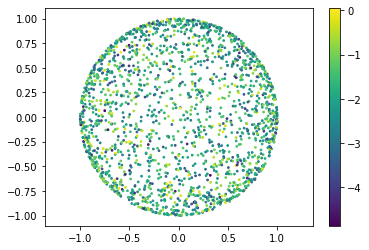

In [338]:
plt.hist(Ss_gauss_h)
plt.show()

plt.hist(Ss_biweight_h)
plt.show()

plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss_gauss_h)
plt.axis('equal')
plt.colorbar()
plt.show()

plt.scatter(X_small[:, 0], X_small[:, 1], s = 3, c = Ss_biweight_h)
plt.axis('equal')
plt.colorbar()
plt.show()